# Libraries and dataset

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import datetime
from scipy.stats import linregress
import statsmodels.api as sm

In [ ]:
!pip install plotly
import plotly.graph_objects as go

In [ ]:
from scipy import stats

from sklearn.cluster import KMeans, SpectralClustering, DBSCAN, Birch, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler,StandardScaler,RobustScaler,PowerTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline, make_pipeline

import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import make_blobs
from yellowbrick.cluster import SilhouetteVisualizer

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV, GridSearchCV, RandomizedSearchCV, cross_val_score, cross_validate
from sklearn.feature_selection import RFECV

from subprocess import call
from IPython.display import Image

In [ ]:
file = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/15072023-BQ-PeopleU1.csv'

df = pd.read_csv(file)
df

,leads_id,leads_reg_timestamp,number_of_employee,industry,contract_id,subscription_type,contract_date,reten_flag,user_price,deal_won,user_price_after,discount_type,session_source,stage,funnel_timestamp
0,244,2021-02-03 14:36:48.000000 UTC,5,Education,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CPC,leads_registered,2021-02-03 14:36:48.000000 UTC
1,244,2021-02-03 14:36:48.000000 UTC,5,Education,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CPC,leads_qualification,2021-02-10 14:26:01.000000 UTC
2,290,2021-02-23 14:27:36.000000 UTC,5,Education,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Organic Social,leads_registered,2021-02-23 14:27:36.000000 UTC
3,290,2021-02-23 14:27:36.000000 UTC,5,Education,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Organic Social,leads_qualification,2021-02-26 13:56:42.000000 UTC
4,290,2021-02-23 14:27:36.000000 UTC,5,Education,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Organic Social,initial_communication_success,2021-03-01 16:13:28.000000 UTC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23147,3371,2022-11-28 10:26:21.000000 UTC,250,Technology,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Organic Search,leads_qualification,2022-12-02 14:05:16.000000 UTC
23148,3371,2022-11-28 10:26:21.000000 UTC,250,Technology,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Organic Search,initial_communication_success,2022-12-05 10:39:29.000000 UTC
23149,3371,2022-11-28 10:26:21.000000 UTC,250,Technology,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Organic Search,approach_success,2022-12-06 13:33:35.000000 UTC
23150,3371,2022-11-28 10:26:21.000000 UTC,250,Technology,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Organic Search,discussion_success,2022-12-12 17:13:45.000000 UTC


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23152 entries, 0 to 23151
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   leads_id             23152 non-null  int64  
 1   leads_reg_timestamp  23152 non-null  object 
 2   number_of_employee   23152 non-null  int64  
 3   industry             23152 non-null  object 
 4   contract_id          14032 non-null  float64
 5   subscription_type    14032 non-null  object 
 6   contract_date        14032 non-null  object 
 7   reten_flag           14032 non-null  float64
 8   user_price           14032 non-null  float64
 9   deal_won             3536 non-null   object 
 10  user_price_after     3536 non-null   float64
 11  discount_type        3536 non-null   object 
 12  session_source       23152 non-null  object 
 13  stage                23152 non-null  object 
 14  funnel_timestamp     23152 non-null  object 
dtypes: float64(4), int64(2), object(9)
m

# Load Additional Dataset

##Additional

In [ ]:
file2 = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/Copy of SaaS Additional Data.xlsx'

df2_p = pd.ExcelFile(file2)
df2_p.sheet_names

['Marketing Spends', 'Survey', ' Survey Data Dictionary']

In [ ]:
df2 = pd.read_excel(df2_p, sheet_name='Survey')
df2.head()

,leads_id,NPS,Pre-Sales Information,Sales's Product Knowledge,Respon Time,Communication
0,2,9,2,5,4,5
1,6,8,3,4,1,3
2,8,8,4,2,3,3
3,9,7,4,2,1,2
4,10,8,3,2,4,2


In [ ]:
for i in df2.columns:
  if i == 'leads_id':
    continue
  else:
    print(i,'\n','min:',df2[i].min(),'max:',df2[i].max())

NPS 
 min: 6 max: 10
Pre-Sales Information 
 min: 1 max: 5
Sales's Product Knowledge 
 min: 1 max: 5
Respon Time 
 min: 1 max: 5
Communication 
 min: 1 max: 5


In [ ]:
df2_1 = pd.read_excel(df2_p, sheet_name='Marketing Spends')
df2_1.head()

,Date,CPC,Direct,Organic Search,Organic Social,Refferal
0,2020-Dec,"Rp4,000,000","Rp5,300,000","Rp3,800,000","Rp4,000,000","Rp14,000,000"
1,2020-Nov,"Rp1,000,000","Rp800,000","Rp300,000","Rp500,000","Rp1,000,000"
2,2021-Apr,"Rp5,000,000","Rp4,800,000","Rp3,000,000","Rp5,500,000","Rp12,500,000"
3,2021-Aug,"Rp4,000,000","Rp5,500,000","Rp3,800,000","Rp5,000,000","Rp11,500,000"
4,2021-Dec,"Rp7,000,000","Rp8,000,000","Rp9,500,000","Rp7,800,000","Rp24,000,000"


In [ ]:
#Convert Date
df2_1['Date'] = pd.to_datetime(df2_1['Date']).dt.to_period('M').astype('str')
df2_1['Date'].head()

0    2020-12
1    2020-11
2    2021-04
3    2021-08
4    2021-12
Name: Date, dtype: object

In [ ]:
#Remove Rp and ,
rp_col = df2_1.columns[1:]
for i in rp_col:
  df2_1[i] = df2_1[i].str.replace('Rp','')
  df2_1[i] = df2_1[i].str.replace(',','')
  df2_1[i] = df2_1[i].astype('int')

##Funnel and Stage

In [ ]:
file_funnel = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_funnel.csv'
file_stage = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_stage.csv'

In [ ]:
df_funnel = pd.read_csv(file_funnel)
df_stage = pd.read_csv(file_stage)

df_funnel.head(3)

,funnel_id,leads_id,stage_id,TimeStamp,reason
0,1,1,101,2020-11-25 13:49:44.000000 UTC,NaN
1,2,2,101,2020-11-26 09:04:53.000000 UTC,NaN
2,3,3,101,2020-11-26 09:26:32.000000 UTC,NaN


In [ ]:
df_stage.head(10)

,stage_id,stage
0,103,initial_communication_success
1,105,discussion_success
2,106,offer_sent
3,107,quotation_recieved
4,108,deal_won
5,104,approach_success
6,102,leads_qualification
7,101,leads_registered


In [ ]:
df_funnelstage = df_funnel.merge(df_stage, on='stage_id',how='left').drop(columns=['reason', 'stage_id', 'funnel_id'])
check = df_funnelstage.copy()
check['TimeStamp'] = pd.to_datetime(pd.to_datetime(check['TimeStamp']).dt.to_period('D').astype(str))
check['Date_Diff'] = pd.to_datetime('31-12-2022') - check['TimeStamp']

<ipython-input-16-41c10a2aed4e>:3: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  check['TimeStamp'] = pd.to_datetime(pd.to_datetime(check['TimeStamp']).dt.to_period('D').astype(str))
<ipython-input-16-41c10a2aed4e>:4: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  check['Date_Diff'] = pd.to_datetime('31-12-2022') - check['TimeStamp']


In [ ]:
check[check['Date_Diff'] < pd.Timedelta(30, 'd')]['leads_id'].nunique()

59

In [ ]:
df_funnelstage_stage = pd.get_dummies(df_funnelstage, columns=['stage'], prefix=None).groupby('leads_id', as_index=False).sum()
df_funnelstage_stage = df_funnelstage_stage[['leads_id', 'stage_leads_registered', 'stage_leads_qualification', 'stage_initial_communication_success', 'stage_approach_success', 'stage_discussion_success', 'stage_offer_sent', 'stage_quotation_recieved', 'stage_deal_won']]
df_funnelstage_stage.head(3)

<ipython-input-18-1a1341a04b9a>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_funnelstage_stage = pd.get_dummies(df_funnelstage, columns=['stage'], prefix=None).groupby('leads_id', as_index=False).sum()


,leads_id,stage_leads_registered,stage_leads_qualification,stage_initial_communication_success,stage_approach_success,stage_discussion_success,stage_offer_sent,stage_quotation_recieved,stage_deal_won
0,1,1,1,1,1,0,0,0,0
1,2,1,1,1,1,1,1,1,1
2,3,1,1,1,1,0,0,0,0


In [ ]:
#Change to ordered categorical data
categories = ['leads_registered', 'leads_qualification', 'initial_communication_success', 'approach_success', 'discussion_success', 'offer_sent', 'quotation_recieved', 'deal_won']
df_funnelstage['stage_cat'] = df_funnelstage['stage'].astype('category')\
                                                     .cat.reorder_categories(
                                                        new_categories = categories,
                                                        ordered = True
                                                      )
df_funnelstage['stage_cat'] = df_funnelstage['stage_cat'].cat.codes
df_funnelstage

,leads_id,TimeStamp,stage,stage_cat
0,1,2020-11-25 13:49:44.000000 UTC,leads_registered,0
1,2,2020-11-26 09:04:53.000000 UTC,leads_registered,0
2,3,2020-11-26 09:26:32.000000 UTC,leads_registered,0
3,4,2020-11-26 13:56:31.000000 UTC,leads_registered,0
4,5,2020-11-27 11:07:38.000000 UTC,leads_registered,0
...,...,...,...,...
16323,3190,2022-10-26 12:07:53.000000 UTC,approach_success,3
16324,3195,2022-10-31 10:14:39.000000 UTC,approach_success,3
16325,3286,2022-11-08 09:41:07.000000 UTC,approach_success,3
16326,3257,2022-11-10 12:16:26.000000 UTC,approach_success,3


In [ ]:
df_funnelstage.query("leads_id == 2")

,leads_id,TimeStamp,stage,stage_cat
1,2,2020-11-26 09:04:53.000000 UTC,leads_registered,0
3399,2,2020-12-03 13:07:29.000000 UTC,leads_qualification,1
6003,2,2020-12-04 09:41:16.000000 UTC,initial_communication_success,2
8235,2,2020-12-07 12:32:29.000000 UTC,approach_success,3
10040,2,2020-12-14 09:56:32.000000 UTC,discussion_success,4
11432,2,2020-12-15 16:43:05.000000 UTC,offer_sent,5
12536,2,2020-12-24 14:10:10.000000 UTC,quotation_recieved,6
13442,2,2021-01-01 17:45:51.000000 UTC,deal_won,7


In [ ]:
df_funnelstage.rename(columns={'TimeStamp':'funnel_timestamp'}, inplace=True)

In [ ]:
df_funnelstage_laststage = df_funnelstage.groupby('leads_id', as_index=False).agg({'stage_cat':'max'})
df_funnelstage_laststage.stage_cat.value_counts(dropna=False)

7    901
0    506
3    427
4    414
2    374
5    286
1    285
6    204
Name: stage_cat, dtype: int64

In [ ]:
#Change to wide format
cat = ['leads_id']
for i in categories:
  cat.append(i)

df_funnelstage_time = pd.pivot(df_funnelstage, index='leads_id', columns='stage', values='funnel_timestamp').reset_index()[cat]
df_funnelstage_time.head(1)

stage,leads_id,leads_registered,leads_qualification,initial_communication_success,approach_success,discussion_success,offer_sent,quotation_recieved,deal_won
0,1,2020-11-25 13:49:44.000000 UTC,2020-12-02 10:07:04.000000 UTC,2020-12-04 12:57:14.000000 UTC,2020-12-07 13:49:28.000000 UTC,NaN,NaN,NaN,NaN


In [ ]:
for i in cat:
  if i == 'leads_id':
    continue
  else:
    df_funnelstage_time[i] = pd.to_datetime(df_funnelstage_time[i])

In [ ]:
#Create time diff
df_funnelstage_time['registered_to_qualificatio'] = round((df_funnelstage_time['leads_qualification'] - df_funnelstage_time['leads_registered'])/pd.Timedelta('1 hour'),2)
df_funnelstage_time['qualification_to_initialcom'] = round((df_funnelstage_time['initial_communication_success'] - df_funnelstage_time['leads_qualification'])/pd.Timedelta('1 hour'),2)
df_funnelstage_time['initialcomm_to_approac'] = round((df_funnelstage_time['approach_success'] - df_funnelstage_time['initial_communication_success'])/pd.Timedelta('1 hour'),2)
df_funnelstage_time['approach_to_discussio'] = round((df_funnelstage_time['discussion_success'] - df_funnelstage_time['approach_success'])/pd.Timedelta('1 hour'),2)
df_funnelstage_time['discussion_to_offe'] = round((df_funnelstage_time['offer_sent'] - df_funnelstage_time['discussion_success'])/pd.Timedelta('1 hour'),2)
df_funnelstage_time['offer_to_quotatio'] = round((df_funnelstage_time['quotation_recieved'] - df_funnelstage_time['offer_sent'])/pd.Timedelta('1 hour'),2)
df_funnelstage_time['quotation_to_dea'] = round((df_funnelstage_time['deal_won'] - df_funnelstage_time['quotation_recieved'])/pd.Timedelta('1 hour'),2)

df_funnelstage_time['registered_to_qualification'] = np.max(df_funnelstage_time['registered_to_qualificatio']) - df_funnelstage_time['registered_to_qualificatio']
df_funnelstage_time['qualification_to_initialcomm'] = np.max(df_funnelstage_time['qualification_to_initialcom']) - df_funnelstage_time['qualification_to_initialcom']
df_funnelstage_time['initialcomm_to_approach'] = np.max(df_funnelstage_time['initialcomm_to_approac']) - df_funnelstage_time['initialcomm_to_approac']
df_funnelstage_time['approach_to_discussion'] = np.max(df_funnelstage_time['approach_to_discussio']) - df_funnelstage_time['approach_to_discussio']
df_funnelstage_time['discussion_to_offer'] = np.max(df_funnelstage_time['discussion_to_offe']) - df_funnelstage_time['discussion_to_offe']
df_funnelstage_time['offer_to_quotation'] = np.max(df_funnelstage_time['offer_to_quotatio']) - df_funnelstage_time['offer_to_quotatio']
df_funnelstage_time['quotation_to_deal'] = np.max(df_funnelstage_time['quotation_to_dea']) - df_funnelstage_time['quotation_to_dea']
df_funnelstage_time['register_to_deal'] = np.where(df_funnelstage_time['deal_won'].notna(),
                                                   round((df_funnelstage_time['deal_won'] - df_funnelstage_time['leads_registered'])/pd.Timedelta('1 hour'),2),
                                                   np.nan)

df_funnelstage_time.head(3)

stage,leads_id,leads_registered,leads_qualification,initial_communication_success,approach_success,discussion_success,offer_sent,quotation_recieved,deal_won,registered_to_qualificatio,...,offer_to_quotatio,quotation_to_dea,registered_to_qualification,qualification_to_initialcomm,initialcomm_to_approach,approach_to_discussion,discussion_to_offer,offer_to_quotation,quotation_to_deal,register_to_deal
0,1,2020-11-25 13:49:44+00:00,2020-12-02 10:07:04+00:00,2020-12-04 12:57:14+00:00,2020-12-07 13:49:28+00:00,NaT,NaT,NaT,NaT,164.29,...,NaN,NaN,12.30,29.87,7.53,NaN,NaN,NaN,NaN,NaN
1,2,2020-11-26 09:04:53+00:00,2020-12-03 13:07:29+00:00,2020-12-04 09:41:16+00:00,2020-12-07 12:32:29+00:00,2020-12-14 09:56:32+00:00,2020-12-15 16:43:05+00:00,2020-12-24 14:10:10+00:00,2021-01-01 17:45:51+00:00,172.04,...,213.45,195.59,4.55,60.15,5.55,107.19,73.99,56.31,70.8,872.68
2,3,2020-11-26 09:26:32+00:00,2020-12-03 17:25:06+00:00,2020-12-04 09:50:03+00:00,2020-12-07 10:21:42+00:00,NaT,NaT,NaT,NaT,175.98,...,NaN,NaN,0.61,64.29,7.87,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_funnelstage_time.drop(columns=categories,inplace=True)

In [ ]:
df_funnelstage_merge = df_funnelstage_laststage.merge(df_funnelstage_time, on='leads_id', how='inner')
df_funnelstage_merge.head(3)

,leads_id,stage_cat,registered_to_qualificatio,qualification_to_initialcom,initialcomm_to_approac,approach_to_discussio,discussion_to_offe,offer_to_quotatio,quotation_to_dea,registered_to_qualification,qualification_to_initialcomm,initialcomm_to_approach,approach_to_discussion,discussion_to_offer,offer_to_quotation,quotation_to_deal,register_to_deal
0,1,3,164.29,50.84,72.87,NaN,NaN,NaN,NaN,12.30,29.87,7.53,NaN,NaN,NaN,NaN,NaN
1,2,7,172.04,20.56,74.85,165.4,30.78,213.45,195.59,4.55,60.15,5.55,107.19,73.99,56.31,70.8,872.68
2,3,3,175.98,16.42,72.53,NaN,NaN,NaN,NaN,0.61,64.29,7.87,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_funnelstage_merge.rename(columns={'stage_cat':'last_stage'}, inplace=True)

In [ ]:
#Create column to identify leads that succsessfully convert to customer
df_funnelstage_merge['deal_won'] = np.where(df_funnelstage_merge['last_stage']==7, 1, 0)

##Contract

In [ ]:
file_contract = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_contract.csv'
df_contract = pd.read_csv(file_contract)
df_contract.head(5)

,contract_id,leads_id,date,subscription_type,number_of_employee,reten_flag,user_price,GMV
0,135,516,2021-05-25,Startup,200,0,20000,4000000
1,152,581,2021-06-07,Startup,200,0,20000,4000000
2,672,516,2022-05-25,Startup,200,1,20000,4000000
3,706,581,2022-06-07,Startup,200,1,20000,4000000
4,748,2197,2022-07-01,Startup,250,0,20000,4000000


In [ ]:
df_contract.query("leads_id == 516")

,contract_id,leads_id,date,subscription_type,number_of_employee,reten_flag,user_price,GMV
0,135,516,2021-05-25,Startup,200,0,20000,4000000
2,672,516,2022-05-25,Startup,200,1,20000,4000000


In [ ]:
df_contract.groupby('subscription_type')[['user_price','GMV']].agg({'user_price':['mean','sum'], 'GMV':'sum'}).round(2)

user_price                   GMV
                        mean       sum         sum
subscription_type                                 
Business             25000.0  18000000   869875000
Enterprise           15000.0   6360000  1828747500
Startup              20000.0  12200000  1513080000

##Discount and Discount type

In [ ]:
file_disc = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_discounts.csv'
file_disctype = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_discount_type.csv'

df_disc = pd.read_csv(file_disc)
df_disctype = pd.read_csv(file_disctype)

df_disc.head(3)

,contract_id,discount_type_code,deal_won,user_price_after,reten_flag
0,4,D1,2021-01-01 10:45:45.000000 UTC,18000,0
1,8,D1,2021-01-04 12:27:39.000000 UTC,18000,0
2,12,D1,2021-01-05 10:40:32.000000 UTC,18000,0


In [ ]:
df_disctype.head(3)

,discount_type_code,discount_type,month_discount
0,D1,2021_quarter_discount,3 month discounts
1,D2,2022_quarter_discount,3 month discounts


In [ ]:
df_contract_disc = df_contract.drop(columns=['date', 'GMV'])\
                              .merge(df_disc.drop(columns=['deal_won', 'reten_flag']),
                                     on='contract_id', how='left')

#Add final price column, merging user price and user price after
df_contract_disc['final_user_price'] = np.where(df_contract_disc['user_price_after'].isna(),
                                                df_contract_disc['user_price'],
                                                df_contract_disc['user_price_after'])

#Drop user price after
df_contract_disc.drop(columns=['user_price', 'user_price_after'], inplace=True)

#Calculate revenue
df_contract_disc['revenue'] = df_contract_disc['final_user_price'] * df_contract_disc['number_of_employee']
df_contract_disc.head()

,contract_id,leads_id,subscription_type,number_of_employee,reten_flag,discount_type_code,final_user_price,revenue
0,135,516,Startup,200,0,NaN,20000.0,4000000.0
1,152,581,Startup,200,0,NaN,20000.0,4000000.0
2,672,516,Startup,200,1,NaN,20000.0,4000000.0
3,706,581,Startup,200,1,NaN,20000.0,4000000.0
4,748,2197,Startup,250,0,D2,16000.0,4000000.0


##Google Analytics

In [ ]:
file_ga = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_google_analytics.csv'
df_ga = pd.read_csv(file_ga)
df_ga.head()

,leads_id,ga_id,Page_Name,Page_timestamp
0,1,1,/home,2020-11-25 13:47:09.000000 UTC
1,7,24,/home,2020-11-30 12:12:30.000000 UTC
2,8,27,/home,2020-11-30 16:08:34.000000 UTC
3,13,47,/home,2020-12-01 11:22:49.000000 UTC
4,16,53,/home,2020-12-02 12:56:54.000000 UTC


In [ ]:
df_ga.query("leads_id == 2")

,leads_id,ga_id,Page_Name,Page_timestamp
1207,2,6,/features,2020-11-26 09:02:24.000000 UTC
2857,2,7,/form/demo,2020-11-26 09:03:08.000000 UTC
8570,2,8,/form/brochure,2020-11-26 09:03:27.000000 UTC


In [ ]:
#Convert Page_Name to category
new_page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting']

df_ga['Page_Name_cat'] = df_ga['Page_Name'].astype('category').cat.reorder_categories(
    new_categories = new_page_categories,
    ordered = True
)

df_ga['Page_Name_cat'] = df_ga['Page_Name_cat'].cat.codes

In [ ]:
#Change to datetime
df_ga['Page_timestamp'] = pd.to_datetime(df_ga['Page_timestamp'])

#rank the page_timestamp
df_ga['Page_timestamp_rank'] = df_ga.groupby('leads_id')['Page_timestamp'].rank()

df_ga.query("leads_id == 2")

,leads_id,ga_id,Page_Name,Page_timestamp,Page_Name_cat,Page_timestamp_rank
1207,2,6,/features,2020-11-26 09:02:24+00:00,1,1.0
2857,2,7,/form/demo,2020-11-26 09:03:08+00:00,5,2.0
8570,2,8,/form/brochure,2020-11-26 09:03:27+00:00,6,3.0


In [ ]:
#change to wide format - Page_Name
df_ga_name = pd.pivot(df_ga, index='leads_id', columns='Page_timestamp_rank', values='Page_Name_cat').reset_index().rename(
    columns={1.0:'first_page', 2.0:'second_page', 3.0:'third_page', 4.0:'fourth_page', 5.0:'fifth_page', 6.0:'sixth_page'})
df_ga_name.head()

Page_timestamp_rank,leads_id,first_page,second_page,third_page,fourth_page,fifth_page,sixth_page
0,1,0.0,1.0,4.0,5.0,8.0,NaN
1,2,1.0,5.0,6.0,NaN,NaN,NaN
2,3,3.0,8.0,NaN,NaN,NaN,NaN
3,4,3.0,4.0,3.0,4.0,6.0,NaN
4,5,1.0,8.0,6.0,NaN,NaN,NaN


In [ ]:
#Add column - visit_page
one = df_ga_name['first_page']
two = df_ga_name['second_page']
three = df_ga_name['third_page']
four = df_ga_name['fourth_page']
five = df_ga_name['fifth_page']
six = df_ga_name['sixth_page']

mask_home = (one==0)|(two==0)|(three==0)|(four==0)|(five==0)|(six==0)
mask_features = (one==1)|(two==1)|(three==1)|(four==1)|(five==1)|(six==1)
mask_case = (one==2)|(two==2)|(three==2)|(four==2)|(five==2)|(six==2)
mask_portofolio = (one==3)|(two==3)|(three==3)|(four==3)|(five==3)|(six==3)
mask_testi = (one==4)|(two==4)|(three==4)|(four==4)|(five==4)|(six==4)
mask_fdemo = (one==5)|(two==5)|(three==5)|(four==5)|(five==5)|(six==5)
mask_fbrochure = (one==6)|(two==6)|(three==6)|(four==6)|(five==6)|(six==6)
mask_fpubl = (one==7)|(two==7)|(three==7)|(four==7)|(five==7)|(six==7)
mask_fmeet = (one==8)|(two==8)|(three==8)|(four==8)|(five==8)|(six==8)

df_ga_name['visit_home'] = np.where(mask_home, 1, 0)
df_ga_name['visit_features'] = np.where(mask_features, 1, 0)
df_ga_name['visit_casestudy'] = np.where(mask_case, 1, 0)
df_ga_name['visit_portofolio'] = np.where(mask_portofolio, 1, 0)
df_ga_name['visit_testi'] = np.where(mask_testi, 1, 0)
df_ga_name['visit_fdemo'] = np.where(mask_fdemo, 1, 0)
df_ga_name['visit_fbrochure'] = np.where(mask_fbrochure, 1, 0)
df_ga_name['visit_fpubl'] = np.where(mask_fpubl, 1, 0)
df_ga_name['visit_fmeet'] = np.where(mask_fmeet, 1, 0)

In [ ]:
df_ga_name.columns

Index(['leads_id', 'first_page', 'second_page', 'third_page', 'fourth_page',
       'fifth_page', 'sixth_page', 'visit_home', 'visit_features',
       'visit_casestudy', 'visit_portofolio', 'visit_testi', 'visit_fdemo',
       'visit_fbrochure', 'visit_fpubl', 'visit_fmeet'],
      dtype='object', name='Page_timestamp_rank')

In [ ]:
df_ga_name_new = df_ga_name.copy()
new_page_pair = [0,1,2,3,4,5,6,7,8]
new_page_category_dict = dict(zip(new_page_pair, new_page_categories))

for i in df_ga_name.columns[1:7]:
  df_ga_name_new[i] = df_ga_name_new[i].map(new_page_category_dict)
  df_ga_name_new = pd.get_dummies(df_ga_name_new, columns=[i], prefix=None)

df_ga_name_new.head(3)

,leads_id,visit_home,visit_features,visit_casestudy,visit_portofolio,visit_testi,visit_fdemo,visit_fbrochure,visit_fpubl,visit_fmeet,...,fifth_page_/form/demo,fifth_page_/form/publications,fifth_page_/form/set-a-meeting,fifth_page_/home,fifth_page_/portofolio,fifth_page_/studycase,fifth_page_/testimonials,sixth_page_/form/brochure,sixth_page_/form/demo,sixth_page_/form/set-a-meeting
0,1,1,1,0,0,1,1,0,0,1,...,0,0,1,0,0,0,0,0,0,0
1,2,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_ga_name.head()

Page_timestamp_rank,leads_id,first_page,second_page,third_page,fourth_page,fifth_page,sixth_page,visit_home,visit_features,visit_casestudy,visit_portofolio,visit_testi,visit_fdemo,visit_fbrochure,visit_fpubl,visit_fmeet
0,1,0.0,1.0,4.0,5.0,8.0,NaN,1,1,0,0,1,1,0,0,1
1,2,1.0,5.0,6.0,NaN,NaN,NaN,0,1,0,0,0,1,1,0,0
2,3,3.0,8.0,NaN,NaN,NaN,NaN,0,0,0,1,0,0,0,0,1
3,4,3.0,4.0,3.0,4.0,6.0,NaN,0,0,0,1,1,0,1,0,0
4,5,1.0,8.0,6.0,NaN,NaN,NaN,0,1,0,0,0,0,1,0,1


##Industry, Leads, Session Source

In [ ]:
#Load industry dataset
file_industry = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_industries.csv'
df_industry = pd.read_csv(file_industry)
df_industry.head()

,industry_code,industry
0,3,Finance
1,5,Retail
2,1,Education
3,6,Technology
4,2,F&B


In [ ]:
#Load leads dataset
file_leads = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_leads.csv'
df_leads = pd.read_csv(file_leads)
df_leads.head()

,leads_id,session_source_code,industry_code,leads_registered,number_of_employee
0,244,1,1,2021-02-03 14:36:48 UTC,5
1,290,4,1,2021-02-23 14:27:36 UTC,5
2,425,1,1,2021-03-30 15:10:12 UTC,5
3,437,4,1,2021-04-01 15:39:02 UTC,5
4,462,4,1,2021-04-06 10:44:11 UTC,5


In [ ]:
#Load session source dataset
file_session = '/content/drive/MyDrive/[MAY23]-DATA ANALYTICS NEXT ERIDANUS 1 Biyan Bahtiar Ramadhan/saas_session_source.csv'
df_session = pd.read_csv(file_session)
df_session.head()

,session_source_code,session_source
0,1,CPC
1,4,Organic Social
2,3,Organic Search
3,2,Direct
4,5,Refferal


In [ ]:
#Merge 3 dataset above
df_leads_merge = df_leads.merge(df_industry, on='industry_code', how='left')\
                         .merge(df_session, on='session_source_code', how='left')

df_leads_merge.drop(columns=['session_source_code', 'industry_code'], inplace=True)
df_leads_merge.head()

,leads_id,leads_registered,number_of_employee,industry,session_source
0,244,2021-02-03 14:36:48 UTC,5,Education,CPC
1,290,2021-02-23 14:27:36 UTC,5,Education,Organic Social
2,425,2021-03-30 15:10:12 UTC,5,Education,CPC
3,437,2021-04-01 15:39:02 UTC,5,Education,Organic Social
4,462,2021-04-06 10:44:11 UTC,5,Education,Organic Social


In [ ]:
#Add new column - leads_reg_year, leads_reg_quarter, leads_reg_month
df_leads_merge['leads_registered'] = pd.to_datetime(df_leads_merge['leads_registered'])
df_leads_merge['leads_reg_year'] = df_leads_merge['leads_registered'].dt.year
df_leads_merge['leads_reg_quarter'] = df_leads_merge['leads_registered'].dt.quarter
df_leads_merge['leads_reg_month'] = df_leads_merge['leads_registered'].dt.month
df_leads_merge['leads_reg_quarter_period'] = df_leads_merge['leads_registered'].dt.to_period('Q')
df_leads_merge['leads_reg_month_period'] = df_leads_merge['leads_registered'].dt.to_period('M')
df_leads_merge['discount_month'] = np.where(df_leads_merge['leads_reg_month'].isin([1,4,7,10]), 1, 0)
df_leads_merge['discount_month_b1'] = np.where(df_leads_merge['leads_reg_month'].isin([12,3,6,9]), 1, 0)

<ipython-input-49-558eb24b7c14>:6: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_leads_merge['leads_reg_quarter_period'] = df_leads_merge['leads_registered'].dt.to_period('Q')
<ipython-input-49-558eb24b7c14>:7: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_leads_merge['leads_reg_month_period'] = df_leads_merge['leads_registered'].dt.to_period('M')


In [ ]:
#Convert to wide format - industry
df_dum_industry = pd.get_dummies(df_leads_merge, columns=['industry'], prefix=None)
df_dum_industry

,leads_id,leads_registered,number_of_employee,session_source,leads_reg_year,leads_reg_quarter,leads_reg_month,leads_reg_quarter_period,leads_reg_month_period,discount_month,discount_month_b1,industry_Education,industry_F&B,industry_Finance,industry_Hospitality,industry_Retail,industry_Technology
0,244,2021-02-03 14:36:48+00:00,5,CPC,2021,1,2,2021Q1,2021-02,0,0,1,0,0,0,0,0
1,290,2021-02-23 14:27:36+00:00,5,Organic Social,2021,1,2,2021Q1,2021-02,0,0,1,0,0,0,0,0
2,425,2021-03-30 15:10:12+00:00,5,CPC,2021,1,3,2021Q1,2021-03,0,1,1,0,0,0,0,0
3,437,2021-04-01 15:39:02+00:00,5,Organic Social,2021,2,4,2021Q2,2021-04,1,0,1,0,0,0,0,0
4,462,2021-04-06 10:44:11+00:00,5,Organic Social,2021,2,4,2021Q2,2021-04,1,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3392,2716,2022-08-22 17:09:04+00:00,250,Refferal,2022,3,8,2022Q3,2022-08,0,0,0,0,0,0,0,1
3393,3045,2022-09-28 09:32:25+00:00,250,Organic Search,2022,3,9,2022Q3,2022-09,0,1,0,0,0,0,0,1
3394,3071,2022-09-29 11:16:13+00:00,250,Refferal,2022,3,9,2022Q3,2022-09,0,1,0,0,0,0,0,1
3395,3367,2022-11-25 13:51:20+00:00,250,Direct,2022,4,11,2022Q4,2022-11,0,0,0,0,0,0,0,1


In [ ]:
#Convert to wide format - session_source
df_dum_session = pd.get_dummies(df_dum_industry, columns=['session_source'], prefix='source')

In [ ]:
#Check year
df_leads_final = df_dum_session.copy()
df_leads_final['leads_reg_year'].value_counts()

2022    1853
2021    1423
2020     121
Name: leads_reg_year, dtype: int64

##Merge

In [ ]:
#merge df_leads_final, df_ga_name, df_funnelstage_merge
df_final = df_leads_final.merge(df_ga_name, on='leads_id', how='left')\
                         .merge(df_funnelstage_merge, on='leads_id', how='left')\
                         .drop(columns='leads_registered')

df_final.head()

,leads_id,number_of_employee,leads_reg_year,leads_reg_quarter,leads_reg_month,leads_reg_quarter_period,leads_reg_month_period,discount_month,discount_month_b1,industry_Education,...,quotation_to_dea,registered_to_qualification,qualification_to_initialcomm,initialcomm_to_approach,approach_to_discussion,discussion_to_offer,offer_to_quotation,quotation_to_deal,register_to_deal,deal_won
0,244,5,2021,1,2,2021Q1,2021-02,0,0,1,...,NaN,8.77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,290,5,2021,1,2,2021Q1,2021-02,0,0,1,...,NaN,105.11,6.43,NaN,NaN,NaN,NaN,NaN,NaN,0
2,425,5,2021,1,3,2021Q1,2021-03,0,1,1,...,NaN,14.13,25.32,61.4,129.98,77.63,NaN,NaN,NaN,0
3,437,5,2021,2,4,2021Q2,2021-04,1,0,1,...,169.13,84.71,3.73,62.0,104.99,26.10,102.77,97.26,769.64,1
4,462,5,2021,2,4,2021Q2,2021-04,1,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3397 entries, 0 to 3396
Data columns (total 52 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      3397 non-null   int64        
 1   number_of_employee            3397 non-null   int64        
 2   leads_reg_year                3397 non-null   int64        
 3   leads_reg_quarter             3397 non-null   int64        
 4   leads_reg_month               3397 non-null   int64        
 5   leads_reg_quarter_period      3397 non-null   period[Q-DEC]
 6   leads_reg_month_period        3397 non-null   period[M]    
 7   discount_month                3397 non-null   int64        
 8   discount_month_b1             3397 non-null   int64        
 9   industry_Education            3397 non-null   uint8        
 10  industry_F&B                  3397 non-null   uint8        
 11  industry_Finance              3397 non-null

#EDA

In [ ]:
df_eda = df_final.copy()
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3397 entries, 0 to 3396
Data columns (total 52 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      3397 non-null   int64        
 1   number_of_employee            3397 non-null   int64        
 2   leads_reg_year                3397 non-null   int64        
 3   leads_reg_quarter             3397 non-null   int64        
 4   leads_reg_month               3397 non-null   int64        
 5   leads_reg_quarter_period      3397 non-null   period[Q-DEC]
 6   leads_reg_month_period        3397 non-null   period[M]    
 7   discount_month                3397 non-null   int64        
 8   discount_month_b1             3397 non-null   int64        
 9   industry_Education            3397 non-null   uint8        
 10  industry_F&B                  3397 non-null   uint8        
 11  industry_Finance              3397 non-null

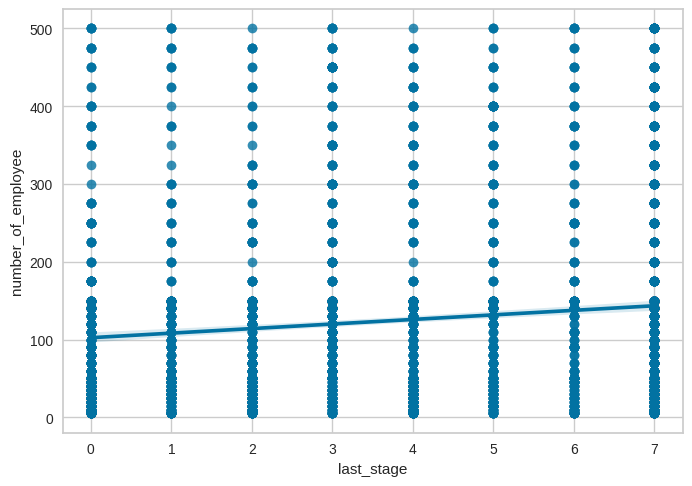

In [ ]:
#Correlation between number_of_employee and last_stage
plot= sns.regplot(data=df_eda, x='last_stage', y='number_of_employee')
plt.show()

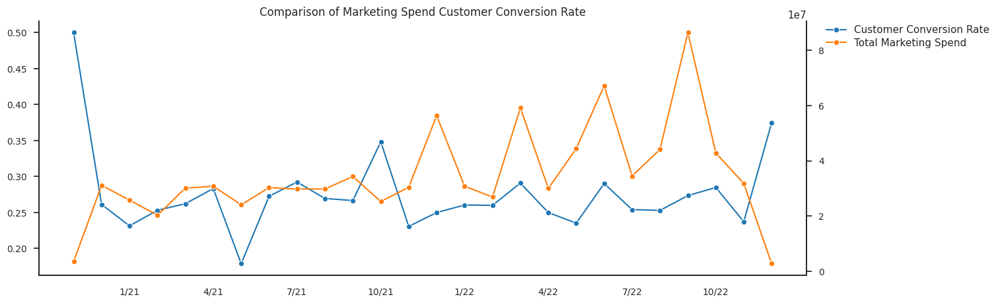

In [ ]:
sns.set_theme(style='white', palette=None, rc={"axes.spines.right": True, "axes.spines.top": False})

#Compare Conversion Rate to Marketing Spend

df_eda['leads_reg_month_period'] = df_eda['leads_reg_month_period'].astype('str')

df_eda1 = df_eda.groupby('leads_reg_month_period',as_index=False)[['deal_won']].mean()\
         .merge(df2_1, left_on = 'leads_reg_month_period', right_on = 'Date', how='inner')\
         .drop(columns='Date')

df_eda1['total_marketing_spend'] = df_eda1['CPC'] + df_eda1['Direct'] + df_eda1['Organic Search'] + df_eda1['Organic Social'] + df_eda1['Refferal']

tab_palette = sns.color_palette('tab10', 10)

fig, ax = plt.subplots(figsize=(15,5))

plot = sns.lineplot(data=df_eda1, x='leads_reg_month_period', y='deal_won',
                    ax=ax, color=tab_palette[0], marker='o', label='Customer Conversion Rate')

ax2 = ax.twinx()

plot = sns.lineplot(data=df_eda1, x='leads_reg_month_period', y='total_marketing_spend',
                    ax=ax2, color=tab_palette[1], marker='o', label='Total Marketing Spend')

ax.set_ylabel('')
ax2.set_ylabel('')
ax.set_xlabel('')

rename_month = ['','','1/21', '', '', '4/21', '', '',
                '7/21', '', '', '10/21', '', '', '1/22', '',
                '', '4/22', '', '', '7/22', '', '', '10/22',
                '', '']

ax.set_xticks(ax.get_xticks(), rename_month, fontsize=10)
ax.tick_params(axis='y', labelsize=10)
ax2.tick_params(axis='y', labelsize=10)
plt.title("Comparison of Marketing Spend Customer Conversion Rate")

ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0.0)
ax2.legend(loc='upper left', bbox_to_anchor=(1.02, 0.95), borderaxespad=0.0)

plt.show()
fig.savefig('spend_vs_conversion.png', format='png', bbox_inches='tight', dpi=200)

####Compare CAC/CLTV

In [ ]:
#Melt df2_1 that contains marketing spend per channel
df_marketing_melt = df2_1.melt(id_vars='Date', value_vars=df2_1.columns[1:],
                    var_name='session_source', value_name='marketing_spend')

df_marketing_melt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130 entries, 0 to 129
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Date             130 non-null    object
 1   session_source   130 non-null    object
 2   marketing_spend  130 non-null    int64 
dtypes: int64(1), object(2)
memory usage: 3.2+ KB


In [ ]:
#review df_contract_disc
df_contract_disc.head()

,contract_id,leads_id,subscription_type,number_of_employee,reten_flag,discount_type_code,final_user_price,revenue
0,135,516,Startup,200,0,NaN,20000.0,4000000.0
1,152,581,Startup,200,0,NaN,20000.0,4000000.0
2,672,516,Startup,200,1,NaN,20000.0,4000000.0
3,706,581,Startup,200,1,NaN,20000.0,4000000.0
4,748,2197,Startup,250,0,D2,16000.0,4000000.0


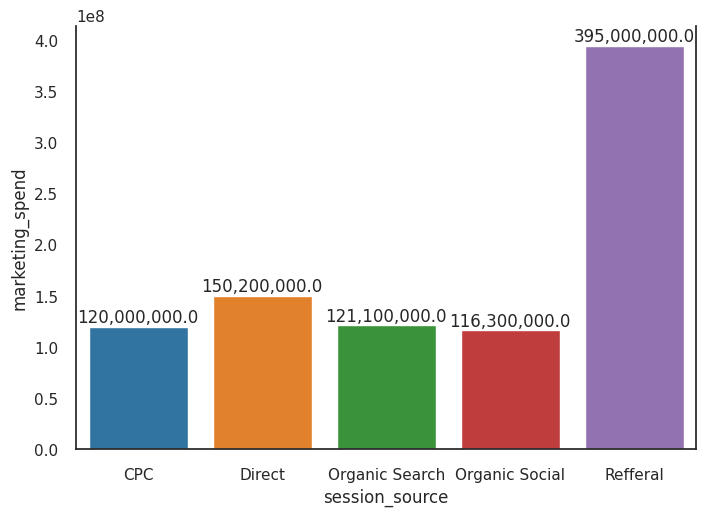

In [ ]:
plot = sns.barplot(data=df_marketing_melt, x='session_source', y='marketing_spend', estimator='sum', errorbar=None, palette='tab10')
plot.bar_label(plot.containers[0], fmt="{:,}")
plt.show()
# plot.set_ylabel('%')

In [ ]:
df_eda5 = df_final.copy().merge(df_leads_merge[['leads_id', 'session_source']])

In [ ]:
df_eda5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3397 entries, 0 to 3396
Data columns (total 53 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      3397 non-null   int64        
 1   number_of_employee            3397 non-null   int64        
 2   leads_reg_year                3397 non-null   int64        
 3   leads_reg_quarter             3397 non-null   int64        
 4   leads_reg_month               3397 non-null   int64        
 5   leads_reg_quarter_period      3397 non-null   period[Q-DEC]
 6   leads_reg_month_period        3397 non-null   period[M]    
 7   discount_month                3397 non-null   int64        
 8   discount_month_b1             3397 non-null   int64        
 9   industry_Education            3397 non-null   uint8        
 10  industry_F&B                  3397 non-null   uint8        
 11  industry_Finance              3397 non-null

In [ ]:
df_eda5['leads_reg_month_period'] = df_eda5['leads_reg_month_period'].astype('str')
df_eda5['leads_reg_quarter_period '] = df_eda5['leads_reg_quarter_period'].astype('str')

In [ ]:
#CAC / CLTV

#Calculate deal_won_sum
df_deal_won_sum = df_eda5.groupby(['leads_reg_month_period', 'leads_reg_year',
                                   'leads_reg_quarter_period'],
                                  as_index=False)[['deal_won']].sum().rename(columns={'deal_won':'deal_won_sum'})

df_marketing_melt_sum = df_marketing_melt.groupby('Date', as_index=False)[['marketing_spend']].sum()

df_deal_won_sum = df_deal_won_sum.merge(df_marketing_melt_sum,
                                        left_on=['leads_reg_month_period'],
                                        right_on=['Date'], how='right')\
                                        .drop(columns='leads_reg_month_period')\
                                        .fillna(0)

df_deal_won_sum.head()

,leads_reg_year,leads_reg_quarter_period,deal_won_sum,Date,marketing_spend
0,2020,2020Q4,5,2020-11,3600000
1,2020,2020Q4,29,2020-12,31100000
2,2021,2021Q1,25,2021-01,25800000
3,2021,2021Q1,20,2021-02,20300000
4,2021,2021Q1,32,2021-03,30100000


In [ ]:
#Calculate CLTV and group yearly per marketing channel
df_cltv_yr = df_contract_disc.groupby('leads_id', as_index=False)[['revenue']].sum()\
                             .merge(df_eda5[['leads_id', 'leads_reg_month_period', 'leads_reg_quarter_period', 'leads_reg_year']])\
                             .groupby(['leads_reg_year'], as_index=False)[['revenue']].mean()\
                             .rename(columns={'leads_reg_month_period':'Date'})

df_deal_won_sum_yr = df_deal_won_sum.groupby(['leads_reg_year'], as_index=False)[['deal_won_sum', 'marketing_spend']].sum()

df_cac_cltv_yr = df_cltv_yr.merge(df_deal_won_sum_yr, on=['leads_reg_year'], how='inner')
df_cac_cltv_yr['cac'] = round(df_cac_cltv_yr['marketing_spend']/df_cac_cltv_yr['deal_won_sum'],2)
df_cac_cltv_yr.rename(columns={'revenue':'cltv'}, inplace=True)
df_cac_cltv_yr['cac/cltv'] = round(df_cac_cltv_yr['cac'] / df_cac_cltv_yr['cltv'],4)
df_cac_cltv_yr.head()

,leads_reg_year,cltv,deal_won_sum,marketing_spend,cac,cac/cltv
0,2020,4.751838e+06,34,34700000,1020588.24,0.2148
1,2021,4.413949e+06,371,367300000,990026.95,0.2243
2,2022,4.864042e+06,496,500600000,1009274.19,0.2075


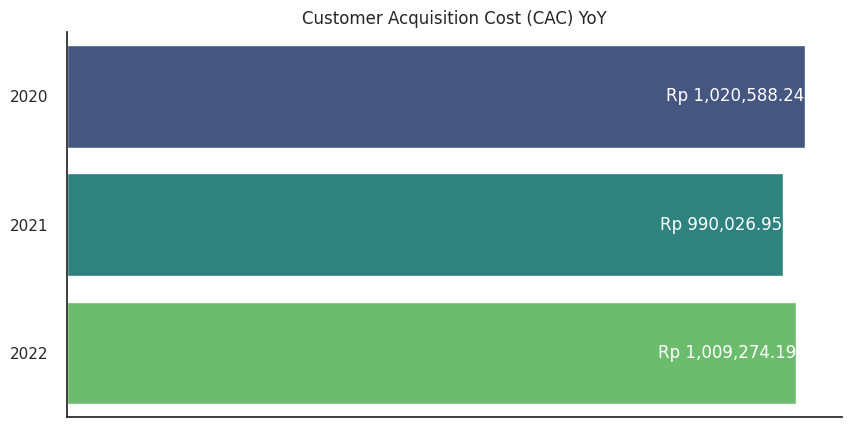

In [ ]:
#Plot CAC
sns.set_theme(style='white', palette=None, rc={"axes.spines.left": True, "axes.spines.right": False, "axes.spines.top": False, "axes.spines.bottom": True})

#CAC
fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(data=df_cac_cltv_yr, y='leads_reg_year', x='cac',palette='viridis', orient='h')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "Rp {:,}".format(round(v,2)), horizontalalignment='right', verticalalignment='center', color='white')

ax.set_xlabel('')
plot.set(xticklabels=[])
ax.set_ylabel('')
ax.set_title("Customer Acquisition Cost (CAC) YoY")
plt.show()

fig.savefig('Customer Acquisition Cost (CAC) YoY.png', format='png', bbox_inches='tight', dpi=200)

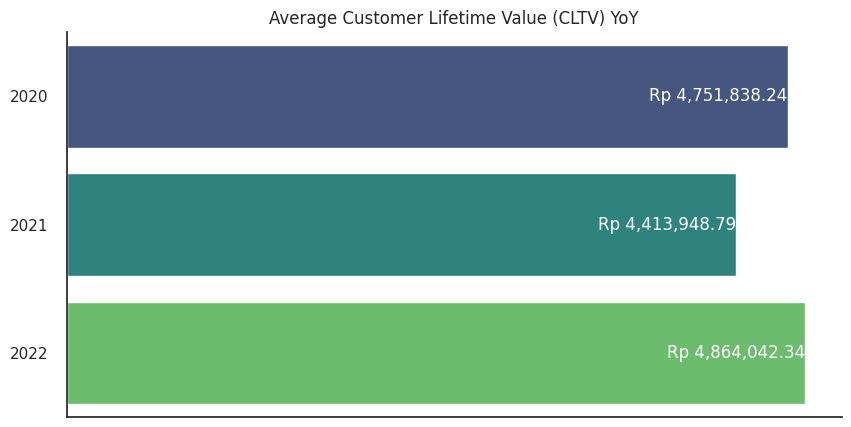

In [ ]:
#Plot CLTV
fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(data=df_cac_cltv_yr, y='leads_reg_year', x='cltv',palette='viridis', orient='h')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "Rp {:,}".format(round(v,2)), horizontalalignment='right', verticalalignment='center', color='white')

ax.set_xlabel('')
plot.set(xticklabels=[])
ax.set_ylabel('')
ax.set_title("Average Customer Lifetime Value (CLTV) YoY")
plt.show()

fig.savefig('Customer Lifetime Value (CLTV) YoY.png', format='png', bbox_inches='tight', dpi=200)

###Compare CAC/CLTV per marketing channel

In [ ]:
#CAC / CLTV

#Calculate deal_won_sum
df_deal_won_sum = df_eda5.groupby(['leads_reg_month_period', 'leads_reg_year',
                                   'leads_reg_quarter_period','session_source'],
                                  as_index=False)[['deal_won']].sum().rename(columns={'deal_won':'deal_won_sum'})
df_deal_won_sum = df_deal_won_sum.merge(df_marketing_melt,
                                        left_on=['leads_reg_month_period', 'session_source'],
                                        right_on=['Date', 'session_source'], how='right')\
                                        .drop(columns='leads_reg_month_period')\
                                        .dropna()

df_deal_won_sum.head()

,leads_reg_year,leads_reg_quarter_period,session_source,deal_won_sum,Date,marketing_spend
0,2020.0,2020Q4,CPC,9.0,2020-12,4000000
1,2020.0,2020Q4,CPC,2.0,2020-11,1000000
2,2021.0,2021Q2,CPC,13.0,2021-04,5000000
3,2021.0,2021Q3,CPC,8.0,2021-08,4000000
4,2021.0,2021Q4,CPC,17.0,2021-12,7000000


In [ ]:
df_rev_yr = df_contract_disc.groupby('leads_id', as_index=False)[['revenue']].sum()\
                             .merge(df_eda5[['leads_id', 'leads_reg_month_period', 'leads_reg_quarter_period', 'leads_reg_year', 'session_source']])\
                             .groupby(['leads_reg_year','session_source'], as_index=False)[['revenue']].sum()

df_rev_yr.head()

,leads_reg_year,session_source,revenue
0,2020,CPC,33940000.0
1,2020,Direct,34770000.0
2,2020,Organic Search,19317500.0
3,2020,Organic Social,17337500.0
4,2020,Refferal,56197500.0


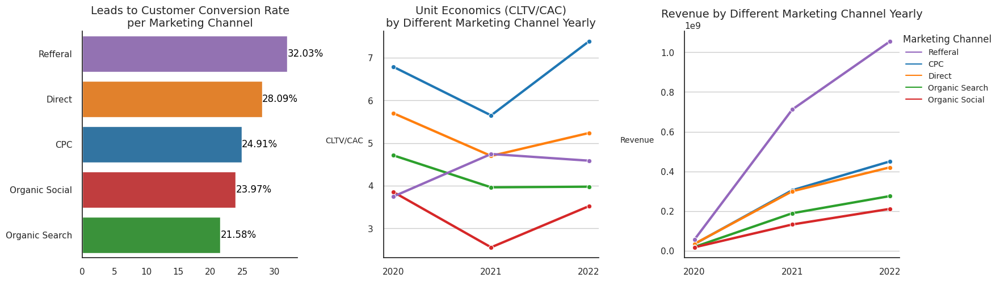

In [ ]:
#Calculate marketing roi
df_cltv_yr = df_contract_disc.groupby('leads_id', as_index=False)[['revenue']].sum()\
                             .merge(df_eda5[['leads_id', 'leads_reg_month_period', 'leads_reg_quarter_period', 'leads_reg_year', 'session_source']])\
                             .groupby(['leads_reg_year','session_source'], as_index=False)[['revenue']].mean()\
                             .rename(columns={'leads_reg_month_period':'Date'})

df_deal_won_sum_yr = df_deal_won_sum.groupby(['leads_reg_year', 'session_source'], as_index=False)[['deal_won_sum', 'marketing_spend']].sum()

df_cac_cltv_yr = df_cltv_yr.merge(df_deal_won_sum_yr, on=['leads_reg_year', 'session_source'], how='inner')
df_cac_cltv_yr['cac'] = round(df_cac_cltv_yr['marketing_spend']/df_cac_cltv_yr['deal_won_sum'],2)
df_cac_cltv_yr.rename(columns={'revenue':'cltv'}, inplace=True)
df_cac_cltv_yr['cltv/cac'] = round(df_cac_cltv_yr['cltv'] / df_cac_cltv_yr['cac'],4)
df_cac_cltv_yr['leads_reg_year'] = df_cac_cltv_yr['leads_reg_year'].astype('str')

pastel = sns.color_palette('pastel')
tab = sns.color_palette('tab10')
dark = sns.color_palette('dark')

palette1 = [tab[0], tab[1], tab[2], tab[3], tab[4]]
palette2 = [tab[4], tab[1], tab[0], tab[3], tab[2]]

fig, ax = plt.subplots(figsize=(18,5), nrows=1, ncols=3)
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

plot = sns.lineplot(data=df_cac_cltv_yr, x='leads_reg_year', y='cltv/cac',
                    hue='session_source', marker='o', palette=palette1, ax=ax[1],
                    linewidth=3)

ax[1].set_xlabel('')
ax[1].set_ylabel('CLTV/CAC', rotation=0, ha='center',labelpad=30, fontsize=10)
ax[1].set_title("Unit Economics (CLTV/CAC)\nby Different Marketing Channel Yearly", fontsize=14)
ax[1].grid(axis='y')
ax[1].get_legend().remove()

#Calculate customer conversion rate
df_deal_won_mean = (df_eda5.groupby(['session_source'])[['deal_won']].mean()*100)\
                                    .rename(columns={'deal_won':'deal_won_mean'})\
                                    .sort_values(by='deal_won_mean', ascending=False)

plot3 = sns.barplot(x="deal_won_mean", y=df_deal_won_mean.index, data=df_deal_won_mean,
                    palette=palette2, orient='h', ax=ax[0], order = ['Refferal', 'Direct', 'CPC', 'Organic Social', 'Organic Search'])
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Leads to Customer Conversion Rate\nper Marketing Channel', fontsize=14)
for i,v in enumerate(plot3.patches):
  v = v.get_width()
  y = ax[0].get_yticks()[i]
  ax[0].text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

#Total Revenue per channel
df_rev_yr = df_contract_disc.groupby('leads_id', as_index=False)[['revenue']].sum()\
                            .merge(df_eda5[['leads_id', 'leads_reg_month_period', 'leads_reg_quarter_period', 'leads_reg_year', 'session_source']])\
                            .groupby(['leads_reg_year','session_source'], as_index=False)[['revenue']].sum()
df_rev_yr['leads_reg_year'] = df_rev_yr['leads_reg_year'].astype('str')

plot2 = sns.lineplot(data=df_rev_yr, x='leads_reg_year', y='revenue',
                    hue='session_source', marker='o', palette=palette1, ax=ax[2],
                    linewidth=3)

ax[2].set_xlabel('')
ax[2].set_ylabel('Revenue', rotation=0, ha='center',labelpad=30, fontsize=10)
ax[2].set_title("Revenue by Different Marketing Channel Yearly", fontsize=14)
ax[2].grid(axis='y')

handles, labels = ax[1].get_legend_handles_labels()
ax[2].legend([handles[4],handles[0],handles[1],handles[2],handles[3]],
          ['Refferal', 'CPC', 'Direct', 'Organic Search', 'Organic Social'],
          loc='upper left', fontsize=10,
          title='Marketing Channel', bbox_to_anchor=(1, 1), borderaxespad=0.0)

plt.show()

fig.savefig('compare_ue_conv_yr.png', format='png', bbox_inches='tight', dpi=200)

<!--  -->

###Customer Conversion Rate

In [ ]:
df_eda5.query("leads_reg_year == 2022")['deal_won'].mean()*100

26.76740420939018

In [ ]:
df_deal_won_sum.query("leads_reg_year == 2022")['marketing_spend'].sum()

500600000

In [ ]:
print("{:,}".format(df_deal_won_sum.query("leads_reg_year == 2022")['marketing_spend'].sum()))

500,600,000


#Clustering

##Feature Selection

In [ ]:
df_final.columns

Index(['leads_id', 'number_of_employee', 'leads_reg_year', 'leads_reg_quarter',
       'leads_reg_month', 'leads_reg_quarter_period', 'leads_reg_month_period',
       'discount_month', 'discount_month_b1', 'industry_Education',
       'industry_F&B', 'industry_Finance', 'industry_Hospitality',
       'industry_Retail', 'industry_Technology', 'source_CPC', 'source_Direct',
       'source_Organic Search', 'source_Organic Social', 'source_Refferal',
       'first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page',
       'sixth_page', 'visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo', 'visit_fbrochure',
       'visit_fpubl', 'visit_fmeet', 'last_stage',
       'registered_to_qualificatio', 'qualification_to_initialcom',
       'initialcomm_to_approac', 'approach_to_discussio', 'discussion_to_offe',
       'offer_to_quotatio', 'quotation_to_dea', 'registered_to_qualification',
       'qualification_to_initialcomm', 'init

In [ ]:
df_try0 = df_final.copy().drop(columns=['leads_id','registered_to_qualificatio', 'qualification_to_initialcom',
       'initialcomm_to_approac', 'approach_to_discussio', 'discussion_to_offe',
       'offer_to_quotatio', 'quotation_to_dea','leads_reg_quarter_period','leads_reg_month_period', 'register_to_deal', 'deal_won'])

In [ ]:
try1 = ['last_stage', 'registered_to_qualification',
         'qualification_to_initialcomm', 'initialcomm_to_approach',
         'approach_to_discussion','discussion_to_offer',
         'offer_to_quotation', 'quotation_to_deal']

<ipython-input-77-1942443108e0>:8: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_try0.corr(), dtype=np.bool))


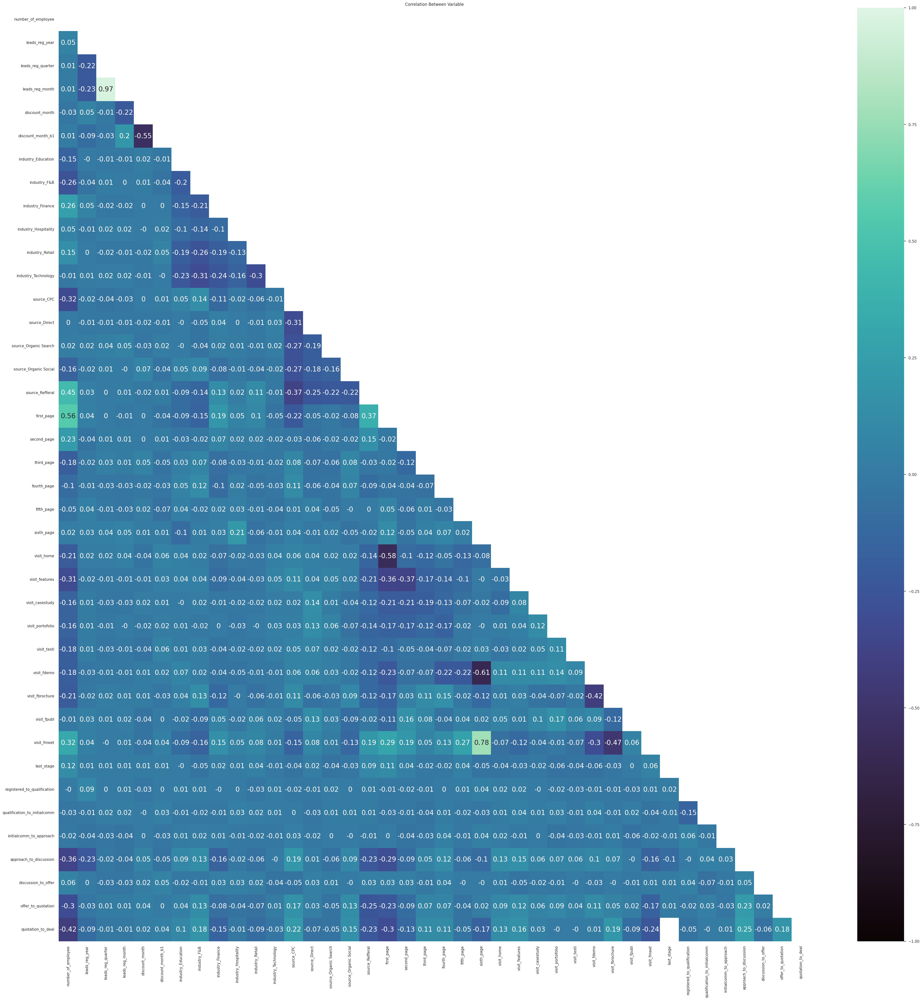

In [ ]:
fig = plt.figure(figsize=(50,50))

ax = fig.add_subplot(1, 1, 1)
ax.set_title('Correlation Between Variable')

# Supaya matriks korelasi yang terlihat cuman bagian bawahnya
mask = np.triu(np.ones_like(
    df_try0.corr(), dtype=np.bool))

sns.heatmap(df_try0.corr().round(2),vmin=-1,
            vmax=1,cmap='mako',annot=True,mask=mask,
            annot_kws={"fontsize":20})

plt.show()

In [ ]:
# Create correlation matrix
corr_matrix = df_try0.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.7, and add into to_drop list
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

<ipython-input-78-538949f3978c>:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))


In [ ]:
to_drop

['leads_reg_month']

In [ ]:
to_keep = list(set(df_try0.columns) - set(['leads_reg_quarter', 'last_stage', 'first_page_/home']))
to_keep

['visit_fbrochure',
 'source_Direct',
 'source_Organic Social',
 'sixth_page',
 'industry_Finance',
 'visit_features',
 'third_page',
 'source_Organic Search',
 'visit_fmeet',
 'discount_month',
 'source_Refferal',
 'visit_fpubl',
 'number_of_employee',
 'registered_to_qualification',
 'visit_home',
 'visit_casestudy',
 'fifth_page',
 'discussion_to_offer',
 'quotation_to_deal',
 'visit_testi',
 'industry_Hospitality',
 'discount_month_b1',
 'visit_portofolio',
 'leads_reg_year',
 'industry_Retail',
 'second_page',
 'industry_Education',
 'fourth_page',
 'industry_F&B',
 'visit_fdemo',
 'initialcomm_to_approach',
 'leads_reg_month',
 'qualification_to_initialcomm',
 'offer_to_quotation',
 'industry_Technology',
 'approach_to_discussion',
 'first_page',
 'source_CPC']

In [ ]:
to_keep2 = list(set(to_keep) - set(['registered_to_qualification', 'qualification_to_initialcomm','initialcomm_to_approach', 'approach_to_discussion','discussion_to_offer', 'offer_to_quotation', 'quotation_to_deal', 'discount_month']))
to_keep2

['visit_fbrochure',
 'source_Direct',
 'source_Organic Social',
 'sixth_page',
 'industry_Finance',
 'visit_features',
 'third_page',
 'source_Organic Search',
 'visit_fmeet',
 'source_Refferal',
 'visit_fpubl',
 'number_of_employee',
 'visit_home',
 'visit_casestudy',
 'visit_testi',
 'industry_Hospitality',
 'discount_month_b1',
 'visit_portofolio',
 'leads_reg_year',
 'industry_Retail',
 'second_page',
 'industry_Education',
 'fourth_page',
 'industry_F&B',
 'visit_fdemo',
 'leads_reg_month',
 'first_page',
 'industry_Technology',
 'fifth_page',
 'source_CPC']

In [ ]:
to_keep3 = list(set(to_keep2) - set(['sixth_page','first_page','second_page','fourth_page','third_page','fifth_page']))
to_keep3

['visit_fbrochure',
 'source_Direct',
 'leads_reg_year',
 'industry_Retail',
 'source_Organic Social',
 'industry_Education',
 'industry_F&B',
 'visit_fdemo',
 'industry_Finance',
 'visit_features',
 'source_Organic Search',
 'visit_fmeet',
 'source_Refferal',
 'visit_fpubl',
 'number_of_employee',
 'leads_reg_month',
 'visit_home',
 'visit_casestudy',
 'industry_Technology',
 'visit_testi',
 'industry_Hospitality',
 'discount_month_b1',
 'source_CPC',
 'visit_portofolio']

In [ ]:
to_keep4 = list(set(to_keep3) - set(['visit_testi', 'visit_home', 'visit_features', 'visit_casestudy', 'visit_portofolio']))
to_keep4

['visit_fbrochure',
 'source_Direct',
 'leads_reg_year',
 'industry_Retail',
 'source_Organic Social',
 'industry_Education',
 'industry_F&B',
 'visit_fdemo',
 'industry_Finance',
 'source_Organic Search',
 'visit_fmeet',
 'source_Refferal',
 'visit_fpubl',
 'number_of_employee',
 'leads_reg_month',
 'industry_Technology',
 'industry_Hospitality',
 'discount_month_b1',
 'source_CPC']

In [ ]:
to_keep5 = list(set(to_keep4) - set(['discount_month_b1','leads_reg_year','leads_reg_month']))
to_keep5

['visit_fbrochure',
 'source_Direct',
 'industry_Retail',
 'source_Organic Social',
 'industry_Education',
 'industry_F&B',
 'visit_fdemo',
 'industry_Finance',
 'source_Organic Search',
 'visit_fmeet',
 'source_Refferal',
 'visit_fpubl',
 'number_of_employee',
 'industry_Technology',
 'industry_Hospitality',
 'source_CPC']

In [ ]:
df_try0.fillna(-1, inplace=True)

##Preprocessing

In [ ]:
#MinMax0
df_mm = df_try0.copy()

mm = MinMaxScaler()
df_mm[to_keep] = mm.fit_transform(df_mm[to_keep])

df_mm[to_keep].head()

,visit_fbrochure,source_Direct,source_Organic Social,sixth_page,industry_Finance,visit_features,third_page,source_Organic Search,visit_fmeet,discount_month,...,industry_F&B,visit_fdemo,initialcomm_to_approach,leads_reg_month,qualification_to_initialcomm,offer_to_quotation,industry_Technology,approach_to_discussion,first_page,source_CPC
0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,...,0.0,1.0,0.000000,0.090909,0.000000,0.000000,0.0,0.000000,0.375,1.0
1,1.0,0.0,1.0,0.0,0.0,1.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.090909,0.111931,0.000000,0.0,0.000000,0.125,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,...,0.0,0.0,0.942456,0.181818,0.396505,0.000000,0.0,0.572841,0.000,1.0
3,0.0,0.0,1.0,0.0,0.0,1.0,1.000000,0.0,1.0,1.0,...,0.0,1.0,0.951518,0.272727,0.071256,0.505382,0.0,0.463547,0.125,0.0
4,1.0,0.0,1.0,0.0,0.0,0.0,0.777778,0.0,0.0,1.0,...,0.0,0.0,0.000000,0.272727,0.000000,0.000000,0.0,0.000000,0.500,0.0


In [ ]:
#MinMax1
df_mm1 = df_final.copy()

mm = MinMaxScaler()
df_mm1[try1] = mm.fit_transform(df_mm1[try1])

In [ ]:
#MinMax2
df_mm2 = df_try0.copy()

mm = MinMaxScaler()
df_mm2[to_keep2] = mm.fit_transform(df_mm2[to_keep2])

In [ ]:
#MinMax3
df_mm3 = df_try0.copy()

mm3 = MinMaxScaler()
df_mm3[to_keep3] = mm3.fit_transform(df_mm3[to_keep3])

In [ ]:
#MinMax4
df_mm4 = df_try0.copy()

mm4 = MinMaxScaler()
df_mm4[to_keep4] = mm4.fit_transform(df_mm4[to_keep4])

In [ ]:
#MinMax5
df_mm5 = df_try0.copy()

mm5 = MinMaxScaler()
df_mm5[to_keep5] = mm5.fit_transform(df_mm5[to_keep5])

In [ ]:
#StandardScaler
df_ss = df_try0.copy()

ss = StandardScaler()
df_ss[to_keep] = ss.fit_transform(df_ss[to_keep])

df_ss[to_keep].head()

,visit_fbrochure,source_Direct,source_Organic Social,sixth_page,industry_Finance,visit_features,third_page,source_Organic Search,visit_fmeet,discount_month,...,industry_F&B,visit_fdemo,initialcomm_to_approach,leads_reg_month,qualification_to_initialcomm,offer_to_quotation,industry_Technology,approach_to_discussion,first_page,source_CPC
0,-0.874457,-0.46222,-0.397247,-0.359229,-0.393264,-0.887104,0.893364,-0.406635,-0.782950,-0.620806,...,-0.523179,1.387777,-1.007283,-1.439372,-1.005659,-0.631807,-0.600814,-0.950150,0.226067,1.480766
1,1.143567,-0.46222,2.517327,-0.359229,-0.393264,1.127263,-1.204878,-0.406635,-0.782950,-0.620806,...,-0.523179,-0.720577,-1.007283,-1.439372,-0.682927,-0.631807,-0.600814,-0.950150,-0.601466,-0.675326
2,1.143567,-0.46222,-0.397247,-0.359229,-0.393264,-0.887104,-0.155757,-0.406635,-0.782950,-0.620806,...,-0.523179,-0.720577,1.487498,-1.141065,0.137587,-0.631807,-0.600814,1.059519,-1.015233,1.480766
3,-0.874457,-0.46222,2.517327,-0.359229,-0.393264,1.127263,1.942484,-0.406635,1.277221,1.610810,...,-0.523179,1.387777,1.511486,-0.842758,-0.800205,1.359374,-0.600814,0.676089,-0.601466,-0.675326
4,1.143567,-0.46222,2.517327,-0.359229,-0.393264,-0.887104,1.243070,-0.406635,-0.782950,1.610810,...,-0.523179,-0.720577,-1.007283,-0.842758,-1.005659,-0.631807,-0.600814,-0.950150,0.639834,-0.675326


In [ ]:
#StandardScaler1
df_ss1 = df_final.copy()

ss = StandardScaler()
df_ss1[try1] = ss.fit_transform(df_ss1[try1])

In [ ]:
#StandardScaler2
df_ss2 = df_try0.copy()

ss = StandardScaler()
df_ss2[to_keep2] = ss.fit_transform(df_ss2[to_keep2])

In [ ]:
#RobustScaler
df_rs = df_try0.copy()

rs = RobustScaler()
df_rs[to_keep] = rs.fit_transform(df_rs[to_keep])

df_rs[to_keep].head()

,visit_fbrochure,source_Direct,source_Organic Social,sixth_page,industry_Finance,visit_features,third_page,source_Organic Search,visit_fmeet,discount_month,...,industry_F&B,visit_fdemo,initialcomm_to_approach,leads_reg_month,qualification_to_initialcomm,offer_to_quotation,industry_Technology,approach_to_discussion,first_page,source_CPC
0,0.0,0.0,0.0,0.0,0.0,0.0,0.500000,0.0,0.0,0.0,...,0.0,1.0,-0.239993,-1.0,-0.251208,0.0000,0.0,-0.428677,0.25,1.0
1,1.0,0.0,1.0,0.0,0.0,1.0,-0.500000,0.0,0.0,0.0,...,0.0,0.0,-0.239993,-1.0,-0.095148,0.0000,0.0,-0.428677,-0.25,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.900567,-0.8,0.301617,0.0000,0.0,0.643875,-0.50,1.0
3,0.0,0.0,1.0,0.0,0.0,1.0,1.000000,0.0,1.0,1.0,...,0.0,1.0,0.911534,-0.6,-0.151859,1.3517,0.0,0.439240,-0.25,0.0
4,1.0,0.0,1.0,0.0,0.0,0.0,0.666667,0.0,0.0,1.0,...,0.0,0.0,-0.239993,-0.6,-0.251208,0.0000,0.0,-0.428677,0.50,0.0


In [ ]:
#RobustScaler1
df_rs1 = df_final.copy()

rs = RobustScaler()
df_rs1[try1] = rs.fit_transform(df_rs1[try1])

In [ ]:
#RobustScaler2
df_rs2 = df_try0.copy()

rs = RobustScaler()
df_rs2[to_keep2] = rs.fit_transform(df_rs2[to_keep2])

##PCA Visualization

In [ ]:
sns.set_theme(style='white', palette=None, rc={"axes.spines.right": False, "axes.spines.top": False})
df_use = df_mm2[to_keep2].copy()

In [ ]:
df_pca = df_use.copy()
df_visual = df_final.copy().fillna(-1)

df_visual.columns

Index(['leads_id', 'number_of_employee', 'leads_reg_year', 'leads_reg_quarter',
       'leads_reg_month', 'leads_reg_quarter_period', 'leads_reg_month_period',
       'discount_month', 'discount_month_b1', 'industry_Education',
       'industry_F&B', 'industry_Finance', 'industry_Hospitality',
       'industry_Retail', 'industry_Technology', 'source_CPC', 'source_Direct',
       'source_Organic Search', 'source_Organic Social', 'source_Refferal',
       'first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page',
       'sixth_page', 'visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo', 'visit_fbrochure',
       'visit_fpubl', 'visit_fmeet', 'last_stage',
       'registered_to_qualificatio', 'qualification_to_initialcom',
       'initialcomm_to_approac', 'approach_to_discussio', 'discussion_to_offe',
       'offer_to_quotatio', 'quotation_to_dea', 'registered_to_qualification',
       'qualification_to_initialcomm', 'init

In [ ]:
#Create PCA for visualization
pca = PCA(n_components=2)
pca_features = pca.fit_transform(df_pca)
df_visual['pca_x'] = pca_features[:,0]
df_visual['pca_y'] = pca_features[:,1]

In [ ]:
# Dump components relations with features
df_pc = pd.DataFrame(pca.components_,columns=df_pca.columns,index = ['PC-1','PC-2']).T
df_pc['PC-1'] = abs(df_pc['PC-1'])
df_pc['PC-2'] = abs(df_pc['PC-2'])

df_pc.sort_values('PC-2', ascending=False)

,PC-1,PC-2
visit_fbrochure,0.104548,0.528334
visit_fmeet,0.278644,0.422676
visit_portofolio,0.276559,0.293101
fifth_page,0.136721,0.274699
source_CPC,0.234583,0.221204
industry_F&B,0.115145,0.212577
visit_fdemo,0.263605,0.194141
visit_casestudy,0.229895,0.192809
fourth_page,0.246692,0.181149
source_Direct,0.076217,0.180046


In [ ]:
df_pc.sort_values('PC-1', ascending=False)

,PC-1,PC-2
source_Refferal,0.342608,0.098772
visit_features,0.308875,0.008771
first_page,0.299910,0.052120
visit_fmeet,0.278644,0.422676
visit_portofolio,0.276559,0.293101
visit_fdemo,0.263605,0.194141
fourth_page,0.246692,0.181149
third_page,0.241752,0.029622
visit_testi,0.238644,0.146144
source_CPC,0.234583,0.221204


<Axes: xlabel='pca_x', ylabel='pca_y'>

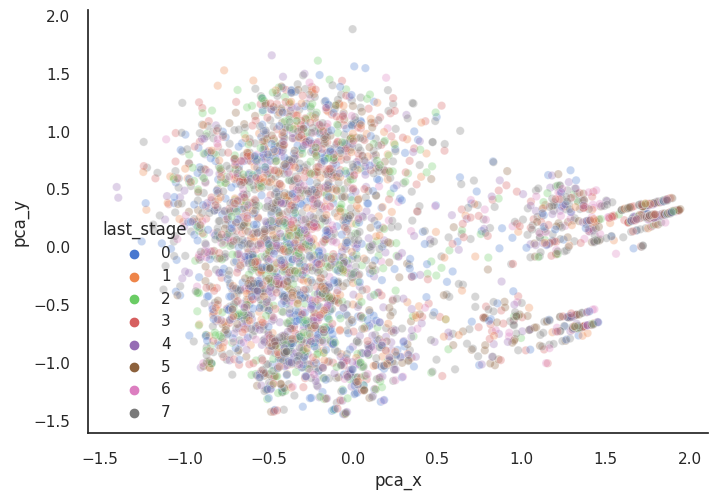

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="last_stage", data=df_visual, alpha=0.3, palette='muted')

<Axes: xlabel='pca_x', ylabel='pca_y'>

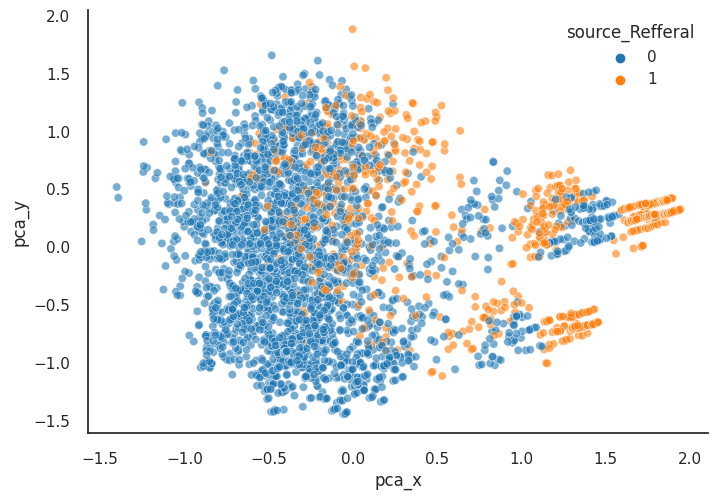

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="source_Refferal", data=df_visual, alpha=0.6, palette='tab10')

<ipython-input-105-7c1763c9aa5a>:10: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


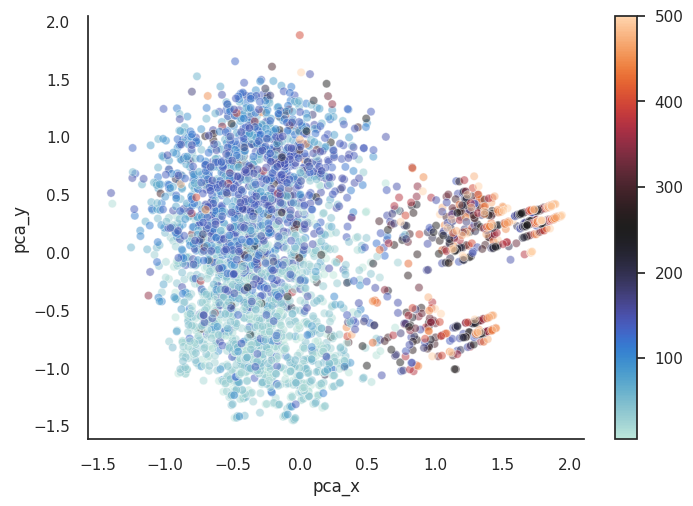

In [ ]:
ax = sns.scatterplot(x="pca_x", y="pca_y", hue="number_of_employee",
                     palette='icefire', alpha=0.5, data=df_visual)

norm = plt.Normalize(df_visual['number_of_employee'].min(), df_visual['number_of_employee'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

##Simple Last Stage Clustering

###Cluster Interpretation

In [ ]:
df_laststage_visual = df_visual.copy()

In [ ]:
df_laststage_visual.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3397 entries, 0 to 3396
Data columns (total 54 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      3397 non-null   int64        
 1   number_of_employee            3397 non-null   int64        
 2   leads_reg_year                3397 non-null   int64        
 3   leads_reg_quarter             3397 non-null   int64        
 4   leads_reg_month               3397 non-null   int64        
 5   leads_reg_quarter_period      3397 non-null   period[Q-DEC]
 6   leads_reg_month_period        3397 non-null   period[M]    
 7   discount_month                3397 non-null   int64        
 8   discount_month_b1             3397 non-null   int64        
 9   industry_Education            3397 non-null   uint8        
 10  industry_F&B                  3397 non-null   uint8        
 11  industry_Finance              3397 non-null

<Axes: xlabel='register_to_deal'>

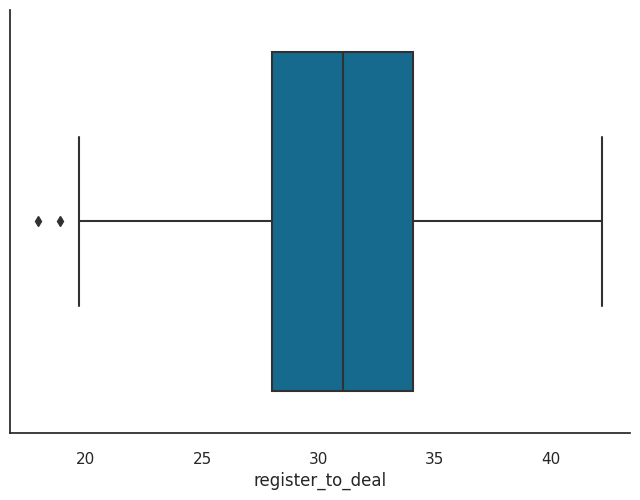

In [ ]:
#Time needed from registration to deal_won
df_laststage_describe = df_laststage_visual.replace(-1, np.nan)
df_laststage_describe['register_to_deal'] = round(df_laststage_describe['register_to_deal']/24,2)
sns.boxplot(df_laststage_describe, x='register_to_deal', orient='h')

<Axes: xlabel='pca_x', ylabel='pca_y'>

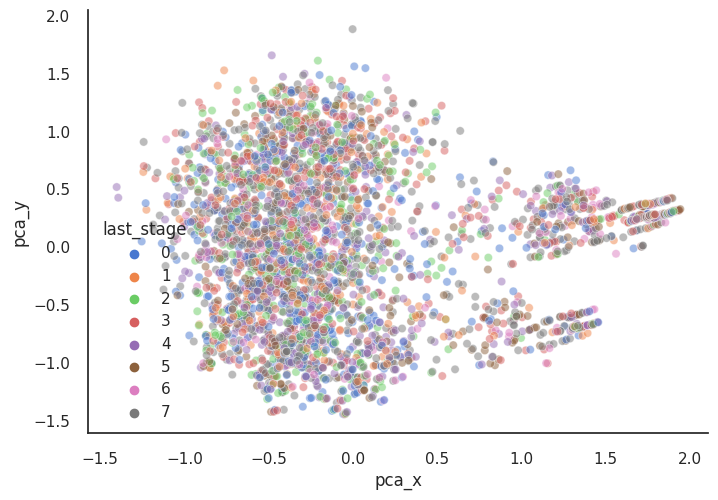

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="last_stage", data=df_laststage_visual, alpha=0.5, palette='muted')

In [ ]:
#industry
df_laststage_visual = df_laststage_visual.merge(df_leads_merge[['leads_id', 'industry']], on='leads_id', how='left')

<Axes: xlabel='last_stage', ylabel='count'>

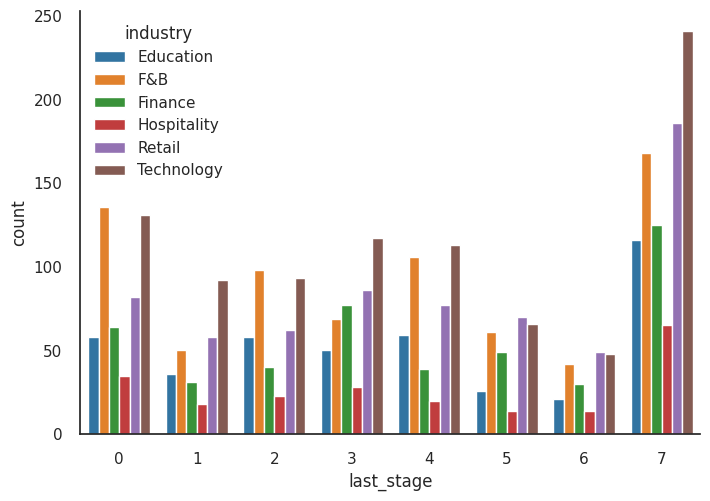

In [ ]:
sns.countplot(x="last_stage", hue="industry", data=df_laststage_visual, palette='tab10')

In [ ]:
#session_source
df_laststage_visual = df_laststage_visual.merge(df_leads_merge[['leads_id', 'session_source']], on='leads_id', how='left')

<Axes: xlabel='last_stage', ylabel='count'>

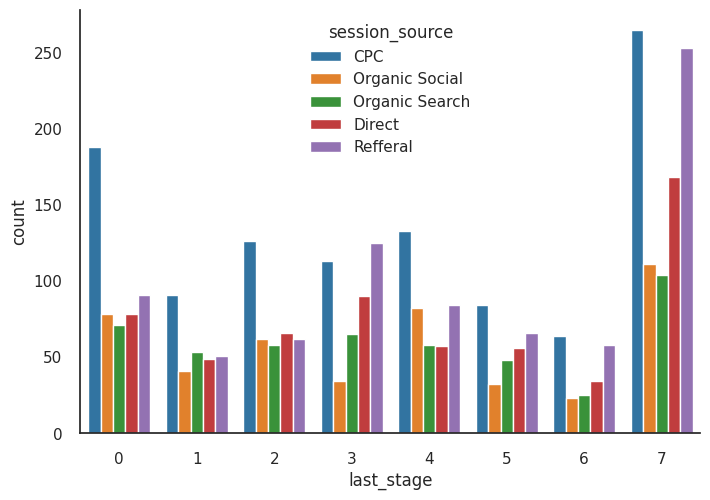

In [ ]:
sns.countplot(x="last_stage", hue="session_source", data=df_laststage_visual, palette='tab10')

<Axes: xlabel='session_source', ylabel='count'>

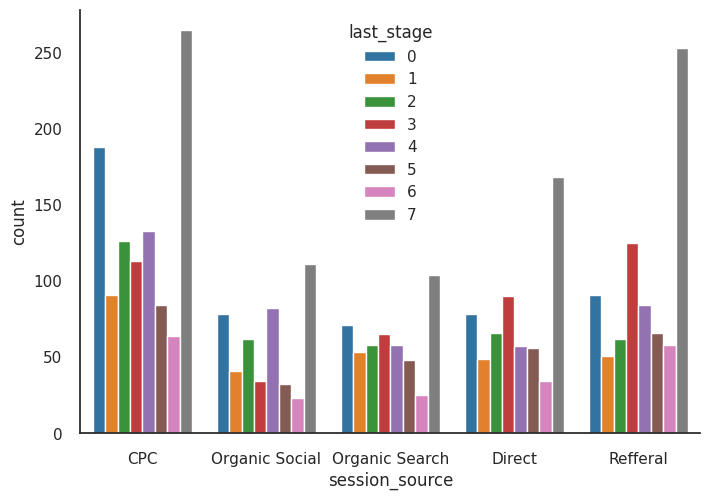

In [ ]:
sns.countplot(x="session_source", hue="last_stage", data=df_laststage_visual, palette='tab10')

<Axes: xlabel='number_of_employee', ylabel='last_stage'>

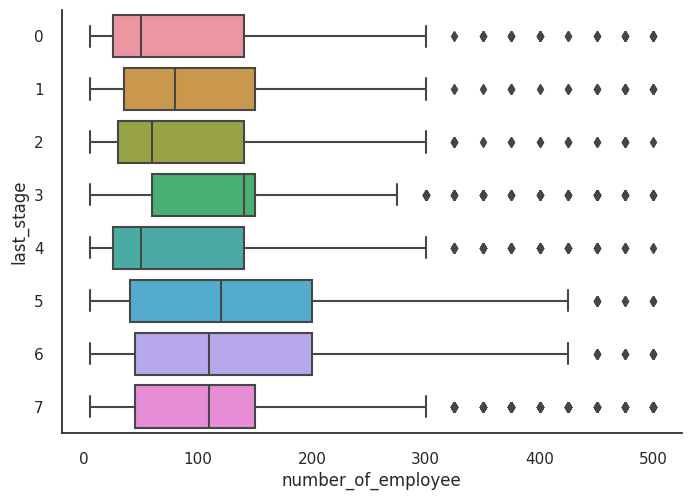

In [ ]:
#number_of_employee
sns.boxplot(data=df_laststage_visual, orient='h', y='last_stage', x='number_of_employee')

##Kmeans

###Deciding Number of Cluster

In [ ]:
df_kmeans = df_use.copy()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=2, the average silhouette score is 0.0953625243713748


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=3, the average silhouette score is 0.10237347784021268


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=4, the average silhouette score is 0.11115854268567235


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=5, the average silhouette score is 0.09754519200928796


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=6, the average silhouette score is 0.07684563821617083


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=7, the average silhouette score is 0.09307945351269602


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=8, the average silhouette score is 0.09603148555853573


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=9, the average silhouette score is 0.08285695604141136


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=10, the average silhouette score is 0.08226238415882237


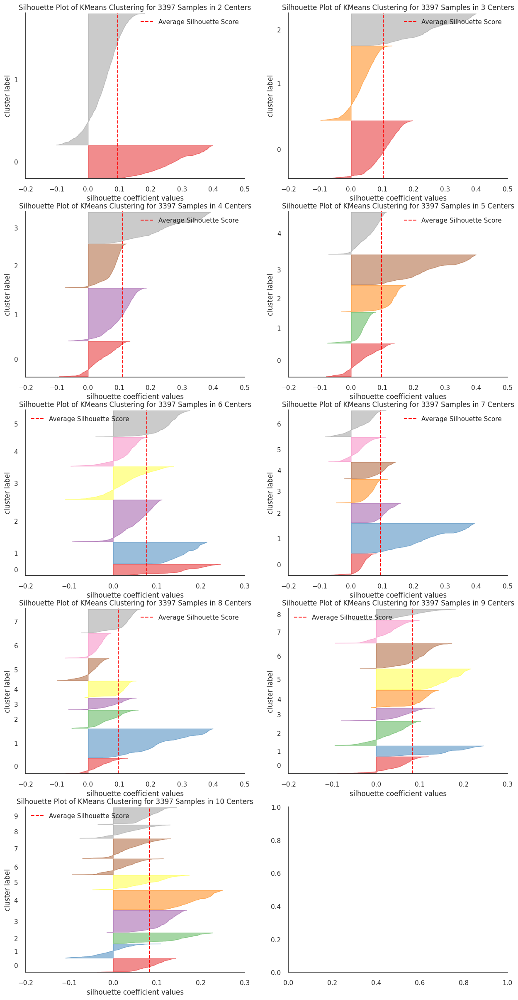

In [ ]:
# Silhouette score plot
K = range(2,11)
max_K = max(K)
fig, ax = plt.subplots(int(np.ceil(max_K/2)), 2, figsize = (15,30))

for n_clusters in K:
  kmeansModel = KMeans(n_clusters=n_clusters, init='k-means++', random_state=10)

  q, mod = divmod(n_clusters,2)
  sil = SilhouetteVisualizer(kmeansModel, is_fitted = False, ax = ax[q-1][mod])
  sil.fit(df_kmeans)
  sil.finalize()
  print(f"For k={n_clusters}, the average silhouette score is {sil.silhouette_score_}")

###Cluster Interpretation

####General Info

In [ ]:
duration_col = ['registered_to_qualification', 'qualification_to_initialcomm','initialcomm_to_approach', 'approach_to_discussion','discussion_to_offer', 'offer_to_quotation', 'quotation_to_deal']
duration_co = ['registered_to_qualificatio', 'qualification_to_initialcom','initialcomm_to_approac', 'approach_to_discussio','discussion_to_offe', 'offer_to_quotatio', 'quotation_to_dea']

df_kmeans_visual = df_visual.copy().drop(columns=duration_col).rename(columns=dict(zip(duration_co, duration_col))).replace(-1,np.nan)

In [ ]:
df_kmeans_visual.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3397 entries, 0 to 3396
Data columns (total 47 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      3397 non-null   int64        
 1   number_of_employee            3397 non-null   int64        
 2   leads_reg_year                3397 non-null   int64        
 3   leads_reg_quarter             3397 non-null   int64        
 4   leads_reg_month               3397 non-null   int64        
 5   leads_reg_quarter_period      3397 non-null   period[Q-DEC]
 6   leads_reg_month_period        3397 non-null   period[M]    
 7   discount_month                3397 non-null   int64        
 8   discount_month_b1             3397 non-null   int64        
 9   industry_Education            3397 non-null   uint8        
 10  industry_F&B                  3397 non-null   uint8        
 11  industry_Finance              3397 non-null

In [ ]:
df_cluster_kmeans = df_kmeans.copy()

kmeansModel = KMeans(n_clusters=2, init='k-means++', random_state=10)
kmeansModel.fit_predict(df_cluster_kmeans)

df_kmeans_visual['cluster'] = kmeansModel.labels_
df_cluster_kmeans['cluster'] = kmeansModel.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<Axes: xlabel='pca_x', ylabel='pca_y'>

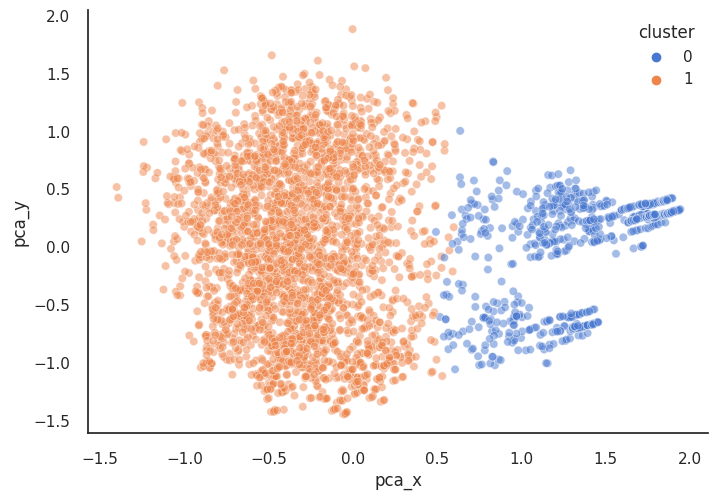

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="cluster", data=df_kmeans_visual, alpha=0.5, palette='muted')

In [ ]:
pivot_col_kmeans_median = ['number_of_employee']

df_kmeans_describe_median = df_kmeans_visual.groupby('cluster', as_index=False)[pivot_col_kmeans_median].agg(['min','median','max']).T.rename(columns={0:'Big Enterprise', 1:'Business'})
df_kmeans_describe_median

cluster                    Big Enterprise  Business
number_of_employee min               10.0       5.0
                   median           300.0      60.0
                   max              500.0     500.0

In [ ]:
df_kmeans_describe_count = df_kmeans_visual.groupby('cluster', as_index=False)['cluster'].agg('count').T.rename(columns={0:'Total Member in Big Enterprise',1:'Total Member in Business'})
df_kmeans_describe_count

,Total Member in Big Enterprise,Total Member in Business
cluster,675,2722


In [ ]:
pivot_col_kmeans_sum = ['industry_Education','industry_F&B', 'industry_Finance',
                 'industry_Hospitality','industry_Retail', 'industry_Technology',
                 'source_CPC', 'source_Direct','source_Organic Search', 'source_Organic Social',
                 'source_Refferal']

df_kmeans_describe_sum = df_kmeans_visual.groupby('cluster', as_index=False)[pivot_col_kmeans_sum].agg('sum').T
df_kmeans_describe_sum

,0,1
cluster,0.0,1.0
industry_Education,28.0,396.0
industry_F&B,34.0,696.0
industry_Finance,199.0,256.0
industry_Hospitality,68.0,149.0
industry_Retail,199.0,471.0
industry_Technology,147.0,754.0
source_CPC,24.0,1040.0
source_Direct,59.0,539.0
source_Organic Search,81.0,401.0


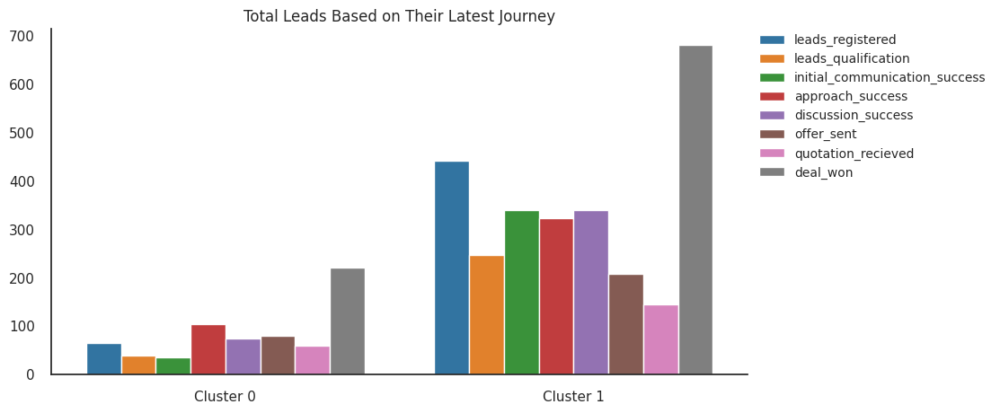

In [ ]:
#last_stage
fig = plt.figure(figsize=(10,5))
sns.countplot(x="cluster", hue="last_stage", data=df_kmeans_visual, palette='tab10')
plt.title('Total Leads Based on Their Latest Journey')
plt.ylabel('')
plt.xticks([0,1],['Cluster 0', 'Cluster 1'])
plt.xlabel('')
plt.legend(df_stage.sort_values(by='stage_id').stage.unique(), loc='upper right', bbox_to_anchor=(1.35, 1), borderaxespad=0.0, fontsize=10)
plt.show()

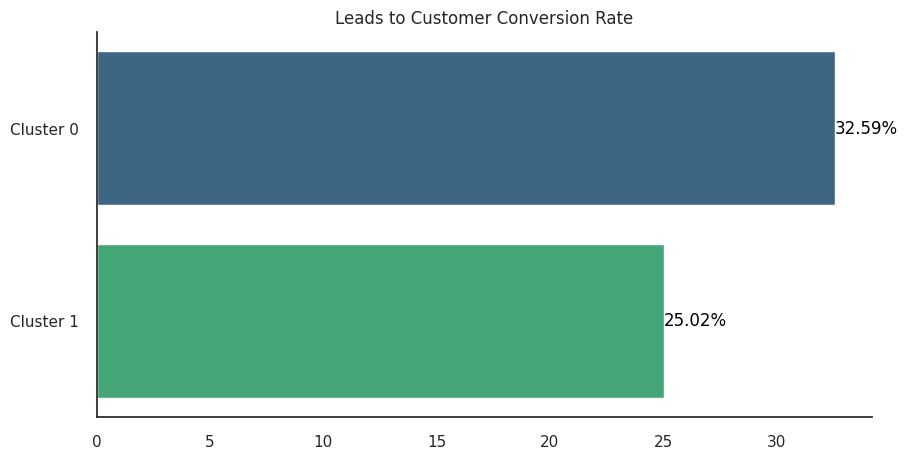

In [ ]:
#leads_to_won ratio
df_won = df_kmeans_visual.groupby('cluster').agg({'deal_won':'mean'}).round(4)*100
df_won = df_won.sort_values(by='deal_won', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(x="deal_won", y=df_won.index, data=df_won, palette='viridis', orient='h', order = df_won.index, ax=ax)
plt.ylabel('')

y_dict = dict(zip([0,1,2,3,4], ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']))
label = [y_dict[x] for x in df_won.index.to_list()]
plt.yticks(ax.get_yticks(), label)

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.xlabel('')
plt.title('Leads to Customer Conversion Rate')
plt.show()

In [ ]:
#industry
df_kmeans_visual = df_kmeans_visual.merge(df_leads_merge[['leads_id', 'industry']], on='leads_id', how='left')

<Axes: xlabel='cluster', ylabel='count'>

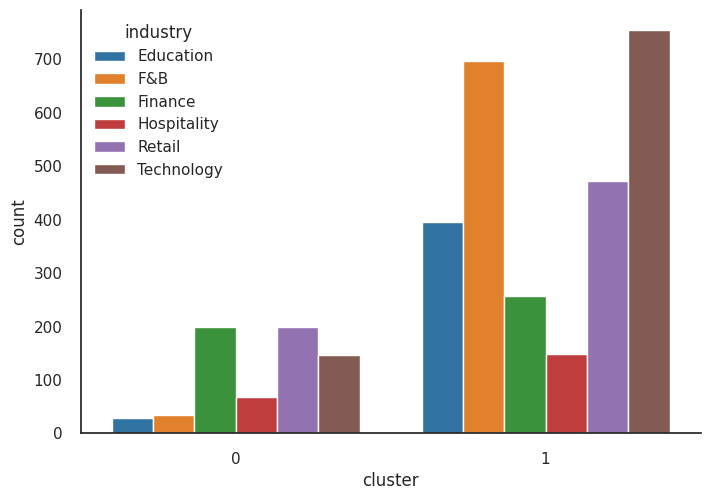

In [ ]:
sns.countplot(x="cluster", hue="industry", data=df_kmeans_visual, palette='tab10')

In [ ]:
#session_source
df_kmeans_visual = df_kmeans_visual.merge(df_leads_merge[['leads_id', 'session_source']], on='leads_id', how='left')

<Axes: xlabel='cluster', ylabel='count'>

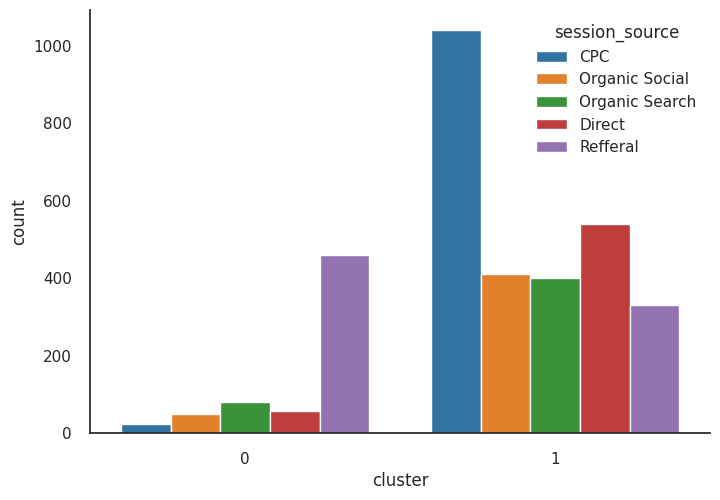

In [ ]:
sns.countplot(x="cluster", hue="session_source", data=df_kmeans_visual, palette='tab10')

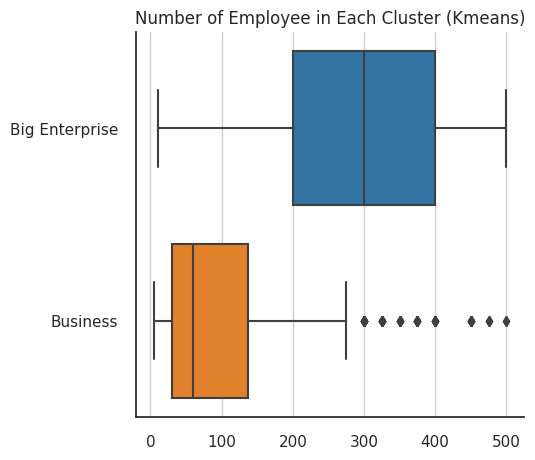

In [ ]:
#number_of_employee
fig, ax = plt.subplots(figsize=(5,5))
plot = sns.boxplot(data=df_kmeans_visual, orient='h', y='cluster', x='number_of_employee', palette='tab10')
ax.set_yticks([0,1], ['Big Enterprise', 'Business'])
ax.set_ylabel('')
ax.set_xlabel('')
ax.set_title('Number of Employee in Each Cluster (Kmeans)')
ax.grid(axis='x')
fig.savefig('Number of Employee in Each Cluster (Kmeans).png', format='png', bbox_inches='tight', dpi=200)

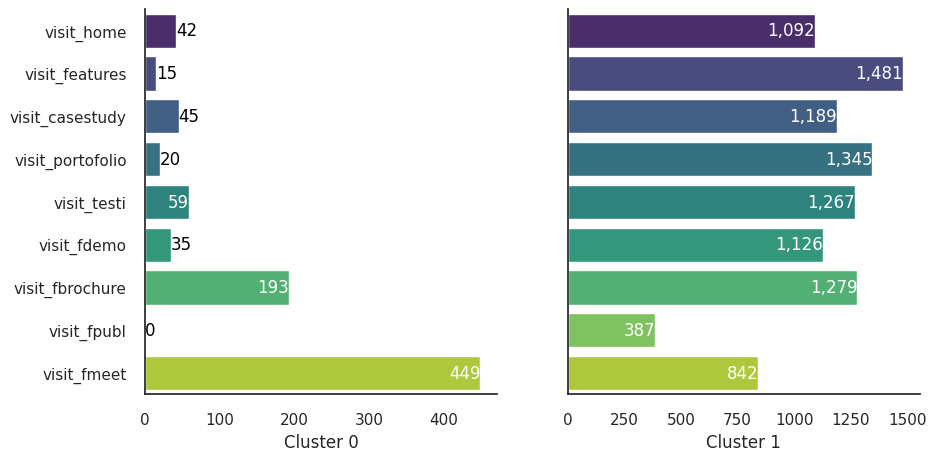

In [ ]:
#page visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo',
        'visit_fbrochure', 'visit_fpubl', 'visit_fmeet']

df_pagevisit = df_kmeans_visual.groupby('cluster')[page].agg('sum')

# for i in df_pagevisit.index:
#   df_pagevisit.loc[i] = df_pagevisit.loc[i]/df_pagevisit.loc[i].sum()*100

df_pagevisit = df_pagevisit.T

fig, ax = plt.subplots(nrows=1, ncols=len(df_pagevisit.columns), figsize=(5*len(df_pagevisit.columns),5), sharey=True)

for j in df_pagevisit.columns:
  sns.barplot(df_pagevisit, y=df_pagevisit.index, x=j, orient='h', palette='viridis', ax=ax[j])
  ax[j].set_xlabel(f"Cluster {j}")

  for i,v in enumerate(df_pagevisit[j]):
    if v < 50:
      ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
    else:
      ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='right', verticalalignment='center', color='white')

plt.show()

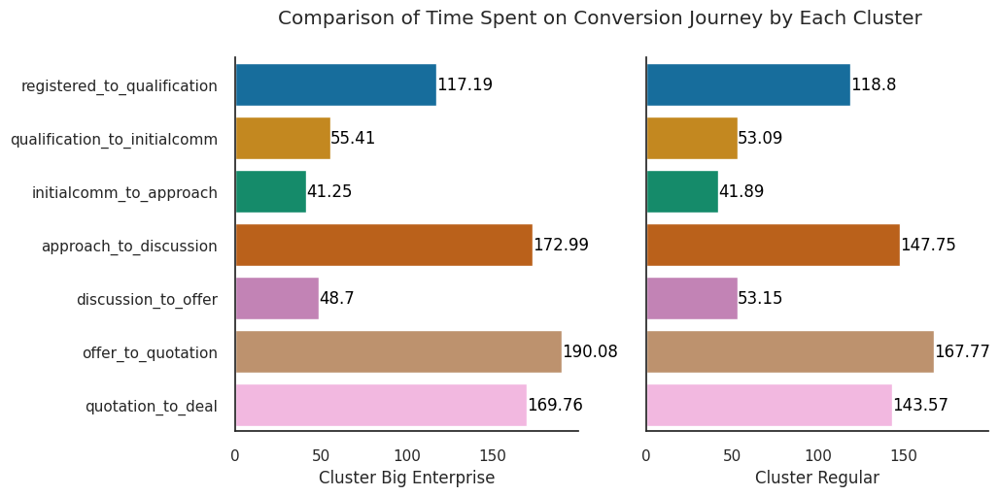

In [ ]:
#duration on each stage
df_duration_visual = df_kmeans_visual.groupby('cluster')[duration_col].median().T

fig, ax = plt.subplots(nrows=1, ncols=len(df_duration_visual.columns), figsize=(5*len(df_duration_visual.columns),5), sharey=True, sharex=True)

for j in df_duration_visual.columns:
  sns.barplot(df_duration_visual, y=df_duration_visual.index, x=j, orient='h', palette='colorblind', ax=ax[j])
  if j == 0:
    title = 'Big Enterprise'
  else:
    title = 'Regular'
  ax[j].set_xlabel(f"Cluster {title}")

  for i,v in enumerate(df_duration_visual[j]):
    ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

fig.suptitle('Comparison of Time Spent on Conversion Journey by Each Cluster')
plt.show()

##GaussianMixtureModel

###Deciding Number of Cluster

In [ ]:
df_gmm = df_use.copy()

In [ ]:
#BIC score
def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)

param_grid = {
    "n_components": range(1, 7),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(random_state=10), param_grid=param_grid, scoring=gmm_bic_score
)
grid_search.fit(df_gmm)

df_bic = pd.DataFrame(grid_search.cv_results_)[
         ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df_bic["mean_test_score"] = -df_bic["mean_test_score"]
df_bic = df_bic.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)
df_bic.sort_values(by="BIC score").head()

,Number of components,Type of covariance,BIC score
3,4,spherical,19377.677938
2,3,spherical,19489.823731
4,5,spherical,19621.963454
5,6,spherical,19673.711175
1,2,spherical,20146.853768


###Cluster Interpretation

####General Info

In [ ]:
duration_col = ['registered_to_qualification', 'qualification_to_initialcomm','initialcomm_to_approach', 'approach_to_discussion','discussion_to_offer', 'offer_to_quotation', 'quotation_to_deal']
duration_co = ['registered_to_qualificatio', 'qualification_to_initialcom','initialcomm_to_approac', 'approach_to_discussio','discussion_to_offe', 'offer_to_quotatio', 'quotation_to_dea']

df_gmm_visual = df_visual.copy().drop(columns=duration_col).rename(columns=dict(zip(duration_co, duration_col))).replace(-1,np.nan)

In [ ]:
df_gmm_visual.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3397 entries, 0 to 3396
Data columns (total 47 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      3397 non-null   int64        
 1   number_of_employee            3397 non-null   int64        
 2   leads_reg_year                3397 non-null   int64        
 3   leads_reg_quarter             3397 non-null   int64        
 4   leads_reg_month               3397 non-null   int64        
 5   leads_reg_quarter_period      3397 non-null   period[Q-DEC]
 6   leads_reg_month_period        3397 non-null   period[M]    
 7   discount_month                3397 non-null   int64        
 8   discount_month_b1             3397 non-null   int64        
 9   industry_Education            3397 non-null   uint8        
 10  industry_F&B                  3397 non-null   uint8        
 11  industry_Finance              3397 non-null

In [ ]:
df_gmm_visual.columns

Index(['leads_id', 'number_of_employee', 'leads_reg_year', 'leads_reg_quarter',
       'leads_reg_month', 'leads_reg_quarter_period', 'leads_reg_month_period',
       'discount_month', 'discount_month_b1', 'industry_Education',
       'industry_F&B', 'industry_Finance', 'industry_Hospitality',
       'industry_Retail', 'industry_Technology', 'source_CPC', 'source_Direct',
       'source_Organic Search', 'source_Organic Social', 'source_Refferal',
       'first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page',
       'sixth_page', 'visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo', 'visit_fbrochure',
       'visit_fpubl', 'visit_fmeet', 'last_stage',
       'registered_to_qualification', 'qualification_to_initialcomm',
       'initialcomm_to_approach', 'approach_to_discussion',
       'discussion_to_offer', 'offer_to_quotation', 'quotation_to_deal',
       'register_to_deal', 'deal_won', 'pca_x', 'pca_y'],
      dtyp

In [ ]:
df_cluster_gmm = df_gmm.copy()

gaussianModel = GaussianMixture(n_components=2, covariance_type='spherical', random_state=10)
df_gmm_visual['cluster'] = gaussianModel.fit_predict(df_cluster_gmm)
df_cluster_gmm['cluster'] = df_gmm_visual['cluster']

In [ ]:
pivot_col_gmm_median = ['number_of_employee']

df_gmm_describe_median = df_gmm_visual.groupby('cluster', as_index=False)[pivot_col_kmeans_median].agg(['min','median','max']).T.rename(columns={0:'Big Enterprise', 1:'Business'})
df_gmm_describe_median

cluster                    Big Enterprise  Business
number_of_employee min              140.0       5.0
                   median           300.0      60.0
                   max              500.0     500.0

In [ ]:
df_gmm_visual.groupby('cluster')[['number_of_employee']].agg({'number_of_employee':['min','median','max']}).rename(index={0:'Big Enterprise',1:'Regular'})

number_of_employee            
                              min median  max
cluster                                      
Big Enterprise                140  300.0  500
Regular                         5   60.0  500

In [ ]:
df_gmm_describe_count = df_gmm_visual.groupby('cluster', as_index=False)['cluster'].agg('count').T.rename(columns={0:'Total Member in Big Enterprise',1:'Total Member in Business'})
df_gmm_describe_count

,Total Member in Big Enterprise,Total Member in Business
cluster,566,2831


In [ ]:
pivot_col_gmm_sum = ['industry_Education','industry_F&B', 'industry_Finance',
                 'industry_Hospitality','industry_Retail', 'industry_Technology',
                 'source_CPC', 'source_Direct','source_Organic Search', 'source_Organic Social',
                 'source_Refferal']

df_gmm_describe_sum = df_gmm_visual.groupby('cluster', as_index=False)[pivot_col_gmm_sum].agg('sum').T
df_gmm_describe_sum

,0,1
cluster,0.0,1.0
industry_Education,22.0,402.0
industry_F&B,20.0,710.0
industry_Finance,176.0,279.0
industry_Hospitality,53.0,164.0
industry_Retail,175.0,495.0
industry_Technology,120.0,781.0
source_CPC,21.0,1043.0
source_Direct,40.0,558.0
source_Organic Search,59.0,423.0


<Axes: xlabel='pca_x', ylabel='pca_y'>

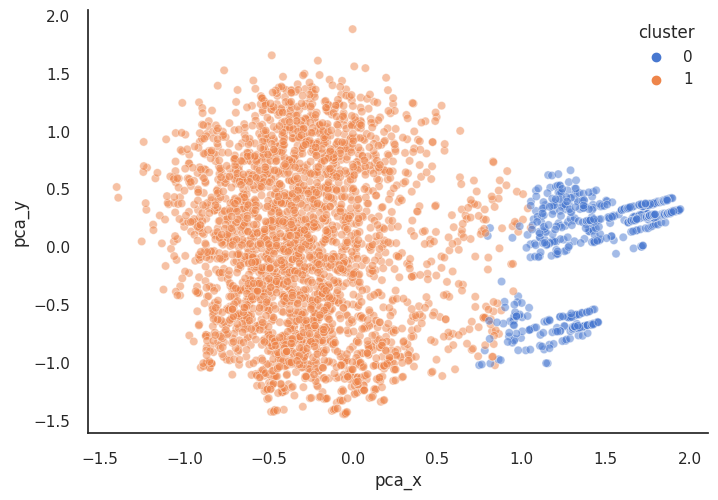

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="cluster", data=df_gmm_visual, alpha=0.5, palette='muted')

<Axes: xlabel='cluster', ylabel='count'>

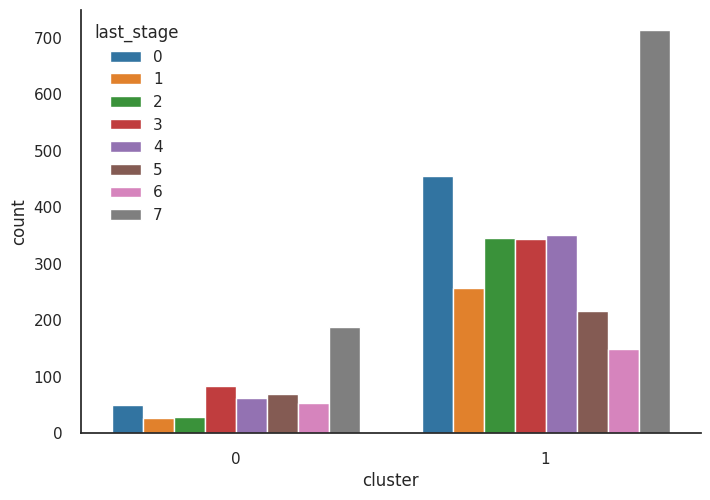

In [ ]:
#last_stage
sns.countplot(x="cluster", hue="last_stage", data=df_gmm_visual, palette='tab10')

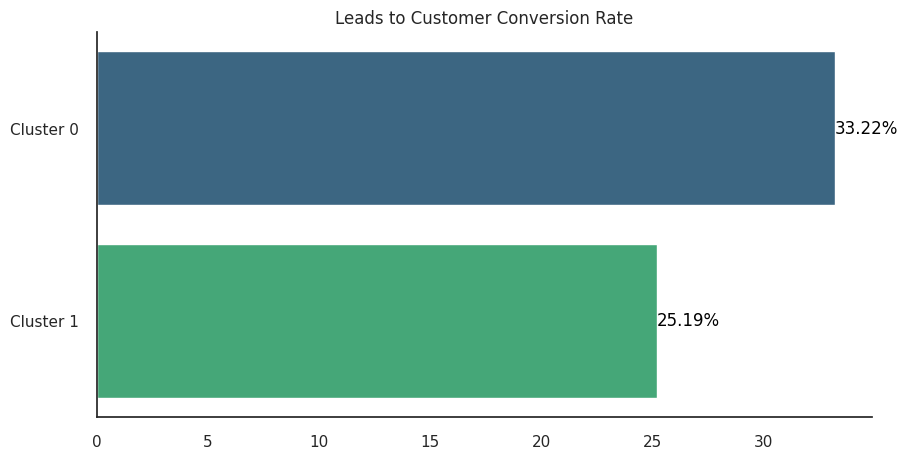

In [ ]:
#leads_to_won ratio
df_gmm_visual['deal_won'] = np.where(df_gmm_visual['last_stage']==7,1,0)
df_won = df_gmm_visual.groupby('cluster').agg({'deal_won':'mean'}).round(4)*100
df_won = df_won.sort_values(by='deal_won', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(x="deal_won", y=df_won.index, data=df_won, palette='viridis', orient='h', order = df_won.index, ax=ax)
plt.ylabel('')

y_dict = dict(zip([0,1,2,3,4,5], ['Cluster 0', 'Cluster 1', 'Cluster 2','Cluster 3','Cluster 4', 'Cluster 5']))
label = [y_dict[x] for x in df_won.index.to_list()]
plt.yticks(ax.get_yticks(), label)

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.xlabel('')
plt.title('Leads to Customer Conversion Rate')
plt.show()

In [ ]:
#industry
df_gmm_visual = df_gmm_visual.merge(df_leads_merge[['leads_id', 'industry']], on='leads_id', how='left')

<Axes: xlabel='cluster', ylabel='count'>

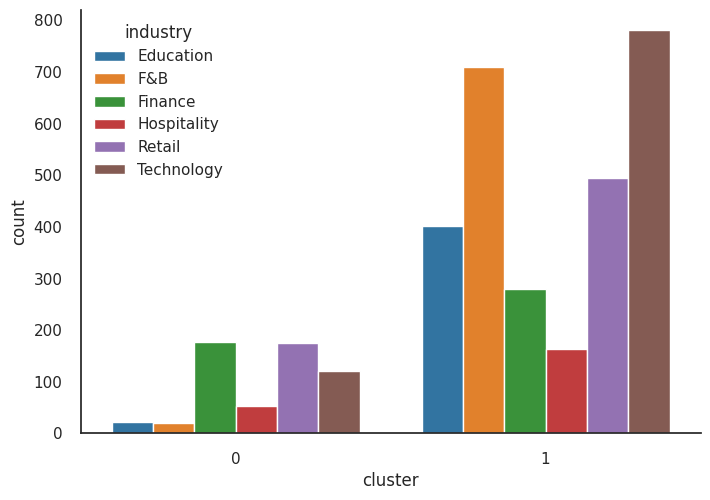

In [ ]:
sns.countplot(x="cluster", hue="industry", data=df_gmm_visual, palette='tab10')

In [ ]:
#session_source
df_gmm_visual = df_gmm_visual.merge(df_leads_merge[['leads_id', 'session_source']], on='leads_id', how='left')

<Axes: xlabel='cluster', ylabel='count'>

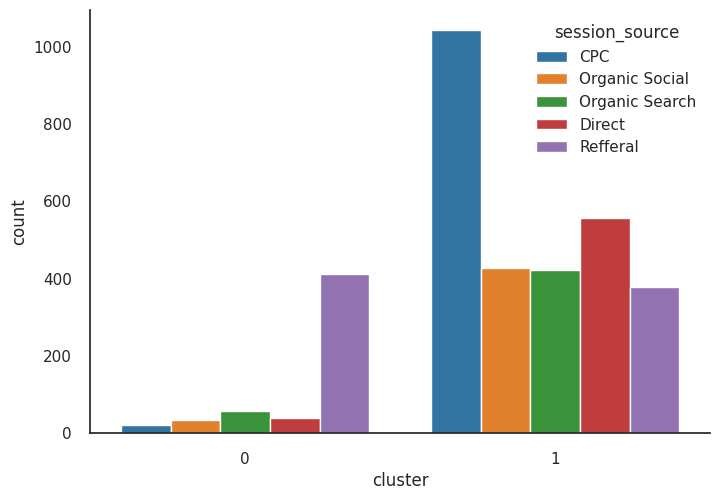

In [ ]:
sns.countplot(x="cluster", hue="session_source", data=df_gmm_visual, palette='tab10')

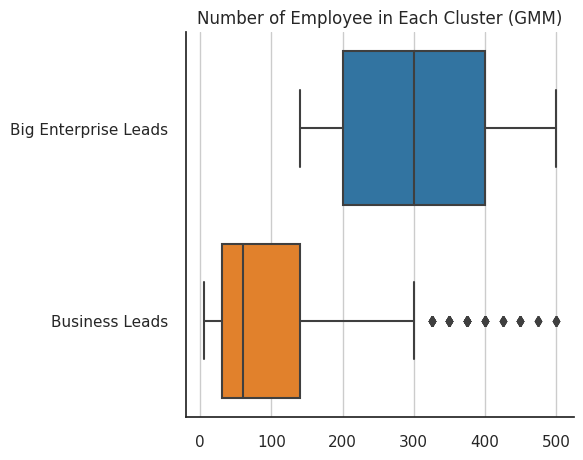

In [ ]:
#number_of_employee
fig, ax = plt.subplots(figsize=(5,5))
plot = sns.boxplot(data=df_gmm_visual, orient='h', y='cluster', x='number_of_employee', ax=ax, palette='tab10')
ax.set_yticks([0,1],['Big Enterprise Leads', 'Business Leads'])
ax.set_ylabel('')
ax.set_xlabel('')
ax.set_title('Number of Employee in Each Cluster (GMM)')
ax.grid(axis='x')
fig.savefig('Number of Employee in Each Cluster (GMM).png', format='png', bbox_inches='tight', dpi=200)

In [ ]:
df_gmm_visual.columns

Index(['leads_id', 'number_of_employee', 'leads_reg_year', 'leads_reg_quarter',
       'leads_reg_month', 'leads_reg_quarter_period', 'leads_reg_month_period',
       'discount_month', 'discount_month_b1', 'industry_Education',
       'industry_F&B', 'industry_Finance', 'industry_Hospitality',
       'industry_Retail', 'industry_Technology', 'source_CPC', 'source_Direct',
       'source_Organic Search', 'source_Organic Social', 'source_Refferal',
       'first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page',
       'sixth_page', 'visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo', 'visit_fbrochure',
       'visit_fpubl', 'visit_fmeet', 'last_stage',
       'registered_to_qualification', 'qualification_to_initialcomm',
       'initialcomm_to_approach', 'approach_to_discussion',
       'discussion_to_offer', 'offer_to_quotation', 'quotation_to_deal',
       'register_to_deal', 'deal_won', 'pca_x', 'pca_y', 'cluster', 

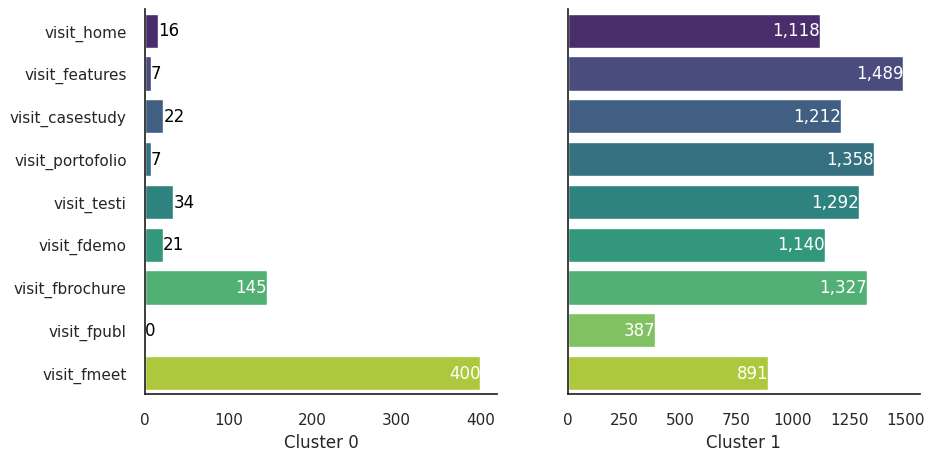

In [ ]:
#page visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo',
        'visit_fbrochure', 'visit_fpubl', 'visit_fmeet']
df_pagevisit = df_gmm_visual.groupby('cluster')[page].agg('sum')

# for i in df_pagevisit.index:
#   df_pagevisit.loc[i] = df_pagevisit.loc[i]/df_pagevisit.loc[i].sum()*100

df_pagevisit = df_pagevisit.T

fig, ax = plt.subplots(nrows=1, ncols=len(df_pagevisit.columns), figsize=(5*len(df_pagevisit.columns),5), sharey=True)

for j in df_pagevisit.columns:
  sns.barplot(df_pagevisit, y=df_pagevisit.index, x=j, orient='h', palette='viridis', ax=ax[j])
  ax[j].set_xlabel(f"Cluster {j}")

  for i,v in enumerate(df_pagevisit[j]):
    if v < 50:
      ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
    else:
      ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='right', verticalalignment='center', color='white')

plt.show()

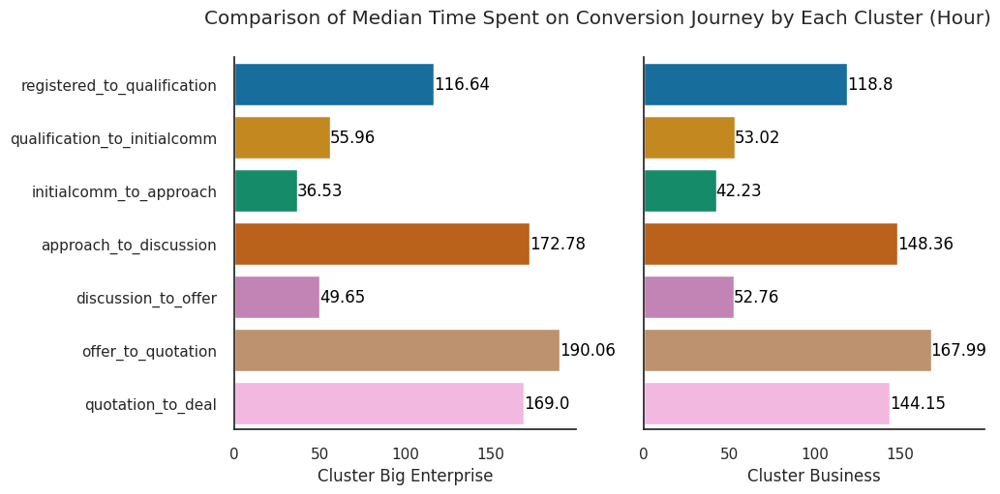

In [ ]:
#duration on each stage
df_duration_visual = df_gmm_visual.groupby('cluster')[duration_col].median().T

fig, ax = plt.subplots(nrows=1, ncols=len(df_duration_visual.columns), figsize=(5*len(df_duration_visual.columns),5), sharey=True, sharex=True)

for j in df_duration_visual.columns:
  sns.barplot(df_duration_visual, y=df_duration_visual.index, x=j, orient='h', palette='colorblind', ax=ax[j])
  ax[j].set_xlabel(f"Cluster {j}")
  if j == 0:
    title = 'Big Enterprise'
  else:
    title = 'Business'
  ax[j].set_xlabel(f"Cluster {title}")

  for i,v in enumerate(df_duration_visual[j]):
    ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

fig.suptitle('Comparison of Median Time Spent on Conversion Journey by Each Cluster (Hour)')
plt.show()

fig.savefig('Comparison of Time Spent on Conversion Journey by Each Cluster (Hour).png', format='png', bbox_inches='tight', dpi=200)

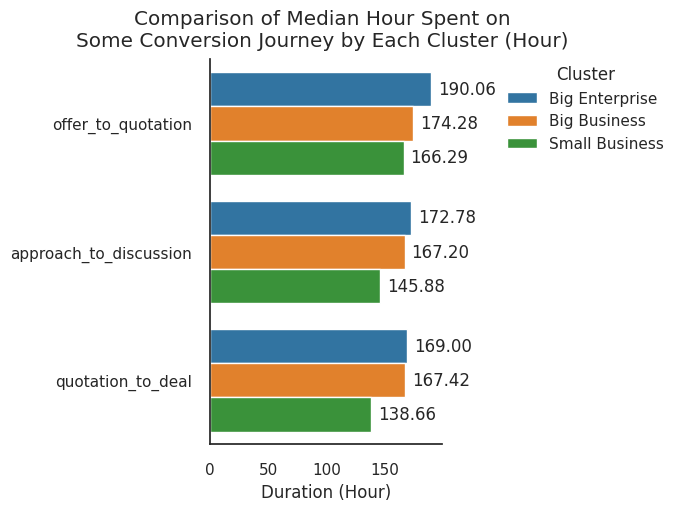

In [ ]:
#duration on each stage - side by side
df_temp = df_gmm_visual.copy()
df_temp['cluster'] = np.where((df_temp['cluster']==1) & (df_temp['number_of_employee']>=140), 1,
                              np.where((df_temp['cluster']==1) & (df_temp['number_of_employee']<140),2,0))
df_duration_visual = df_temp.groupby('cluster')[duration_col].median().T

df_duration_melt = df_duration_visual.reset_index().melt(id_vars='index', value_vars=df_duration_visual.columns[0:],
                   var_name='cluster', value_name='hour_spent').rename(columns={'index':'conversion_journey'})
df_duration_melt = df_duration_melt[df_duration_melt['conversion_journey'].isin(['offer_to_quotation', 'approach_to_discussion', 'quotation_to_deal'])]
order = df_duration_melt.query("cluster == 0").sort_values(by='hour_spent', ascending=False)['conversion_journey']

fig, ax = plt.subplots(figsize=(3,5))

plot = sns.barplot(df_duration_melt, y='conversion_journey', x='hour_spent', hue='cluster',
                   orient='h', palette='tab10', ax=ax, order=order)

for p in plot.patches:
    plot.annotate("%.2f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
                  xytext=(5, 0), textcoords='offset points', ha="left", va="center")

handles, labels = ax.get_legend_handles_labels()
ax.legend([handles[0], handles[1], handles[2]],['Big Enterprise', 'Big Business', 'Small Business'], loc='upper left', bbox_to_anchor=(1.25, 1), borderaxespad=0.0, title='Cluster')
ax.set_ylabel('')
ax.set_xlabel('Duration (Hour)')
fig.suptitle('Comparison of Median Hour Spent on\nSome Conversion Journey by Each Cluster (Hour)')
plt.show()

fig.savefig('Comparison of Time Spent on Conversion Journey by Each Cluster (Hour).png', format='png', bbox_inches='tight', dpi=200)

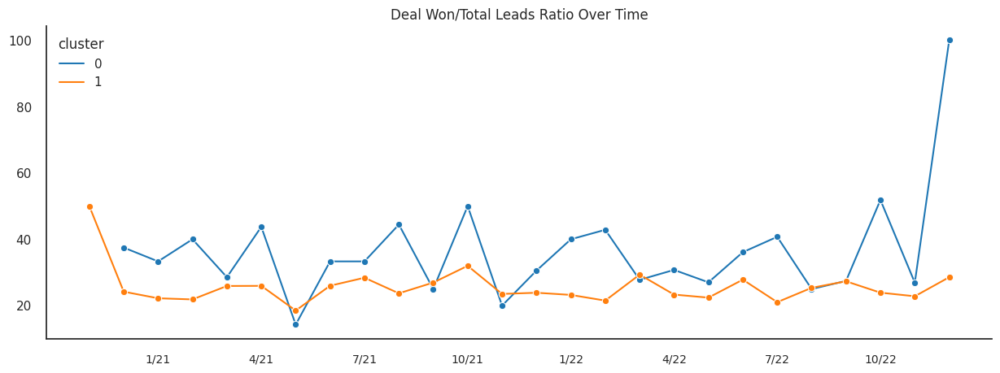

In [ ]:
#Customer Conversion Rate Comparison Between 3 Cluster Over Time
df_gmm_compare_won = df_gmm_visual.groupby(['leads_reg_month_period', 'cluster'], as_index=False).agg({'deal_won':'mean'})
df_gmm_compare_won['deal_won'] = df_gmm_compare_won['deal_won']*100
df_gmm_compare_won['leads_reg_month_period'] = df_gmm_compare_won['leads_reg_month_period'].astype('str')

rename_month = ['', '','1/21', '', '', '4/21', '', '',
                '7/21', '', '', '10/21', '', '', '1/22', '',
                '', '4/22', '', '', '7/22', '', '', '10/22',
                '', '']

fig, ax = plt.subplots(figsize=(15,5))

plot = sns.lineplot(data=df_gmm_compare_won, x='leads_reg_month_period', y='deal_won',
                    hue='cluster', ax=ax,
                    marker='o', palette='tab10')

ax.set_xticks(ax.get_xticks(), rename_month, fontsize=10)
ax.set_ylabel('')
ax.set_xlabel('')

plt.title("Deal Won/Total Leads Ratio Over Time")

plt.show()

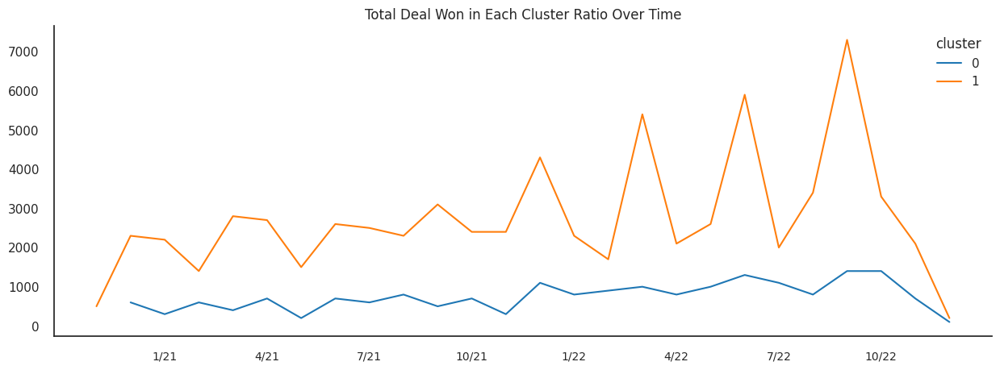

In [ ]:
#Total Deal Won Comparison Between 3 Cluster Over Time
df_gmm_compare_won_sum = df_gmm_visual.groupby(['leads_reg_month_period', 'cluster'], as_index=False).agg({'deal_won':'sum'})
df_gmm_compare_won_sum['deal_won'] = df_gmm_compare_won_sum['deal_won']*100
df_gmm_compare_won_sum['leads_reg_month_period'] = df_gmm_compare_won_sum['leads_reg_month_period'].astype('str')

rename_month = ['', '','1/21', '', '', '4/21', '', '',
                '7/21', '', '', '10/21', '', '', '1/22', '',
                '', '4/22', '', '', '7/22', '', '', '10/22',
                '', '']

fig, ax = plt.subplots(figsize=(15,5))

plot = sns.lineplot(data=df_gmm_compare_won_sum, x='leads_reg_month_period', y='deal_won',
                    hue='cluster', ax=ax,
                    palette='tab10')

ax.set_xticks(ax.get_xticks(), rename_month, fontsize=10)
ax.set_ylabel('')
ax.set_xlabel('')

plt.title("Total Deal Won in Each Cluster Ratio Over Time")

plt.show()

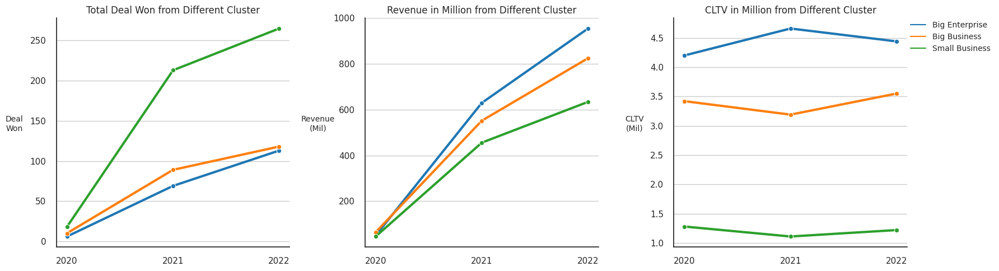

In [ ]:
fig, ax = plt.subplots(figsize=(18,5), nrows=1, ncols=3)
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

cluster_mask = df_gmm_visual['cluster']==1
employee_mask = df_gmm_visual['number_of_employee']>=140

df_gmm_visual['new_cluster'] = np.where(cluster_mask & employee_mask, 1,
                                        np.where(cluster_mask & ~employee_mask, 2, 0))

#deal_won related
df_won_sum = df_gmm_visual.groupby(['leads_reg_year','new_cluster'], as_index=False).agg({'deal_won':'sum'})
df_won_sum['leads_reg_year'] = df_won_sum['leads_reg_year'].astype('str')

plot = sns.lineplot(x="leads_reg_year", y='deal_won', data=df_won_sum, palette='tab10',
                    hue = 'new_cluster', ax=ax[0], marker='o', linewidth=3)
ax[0].set_title('Total Deal Won from Different Cluster')
ax[0].set_xlabel('')
ax[0].set_ylabel('Deal\nWon', rotation=0, labelpad=20, fontsize=10)
ax[0].get_legend().remove()
ax[0].grid(axis='y')

#Revenue related
df_gmm_rev = df_gmm_visual.merge(df_contract_disc[['leads_id', 'revenue']], how='left', on='leads_id')
df_gmm_rev['leads_reg_year'] = df_gmm_rev['leads_reg_year'].astype('str')
df_gmm_rev = df_gmm_rev.groupby(['leads_reg_year', 'new_cluster'], as_index=False)[['revenue']].sum()
df_gmm_rev['revenue'] = df_gmm_rev['revenue']/1000000

plot2 = sns.lineplot(x="leads_reg_year", y='revenue', data=df_gmm_rev, palette='tab10',
                    hue = 'new_cluster', ax=ax[1], marker='o', linewidth=3)
ax[1].set_title('Revenue in Million from Different Cluster')
ax[1].set_xlabel('')
ax[1].set_ylabel('Revenue\n(Mil)', rotation=0, labelpad=20, fontsize=10)
ax[1].get_legend().remove()
ax[1].grid(axis='y')
ax[1].set_ylim(ymax=1000)

#CLTV
df_gmm_cltv = df_gmm_visual.merge(df_contract_disc[['leads_id', 'revenue']], how='left', on='leads_id')
df_gmm_cltv['leads_reg_year'] = df_gmm_cltv['leads_reg_year'].astype('str')
df_gmm_cltv = df_gmm_cltv.groupby(['leads_reg_year', 'new_cluster'], as_index=False)[['revenue','deal_won']].sum()
df_gmm_cltv['cltv'] = round(df_gmm_cltv['revenue']/df_gmm_cltv['deal_won']/1000000,2)

plot3 = sns.lineplot(x="leads_reg_year", y='cltv', data=df_gmm_cltv, palette='tab10',
                    hue = 'new_cluster', ax=ax[2], marker='o', linewidth=3)
ax[2].set_title('CLTV in Million from Different Cluster')
ax[2].set_xlabel('')
ax[2].set_ylabel('CLTV\n(Mil)', rotation=0, labelpad=20, fontsize=10)
handles, labels = ax[2].get_legend_handles_labels()
ax[2].legend([handles[0],handles[1],handles[2]], ['Big Enterprise', 'Big Business', 'Small Business'],
             title=(''), fontsize=10, loc='upper left', bbox_to_anchor=(1, 1), borderaxespad=0.0)
ax[2].grid(axis='y')

fig.tight_layout()
plt.show()
fig.savefig('compare_rev_cluster.png', format='png', bbox_inches='tight', dpi=200)

####Cluster 0 Persona

In [ ]:
df_gmm_visual.query("cluster==0")[pivot_col_gmm_median].describe()

,number_of_employee
count,566.000000
mean,310.265018
std,114.044784
min,140.000000
25%,200.000000
50%,300.000000
75%,400.000000
max,500.000000


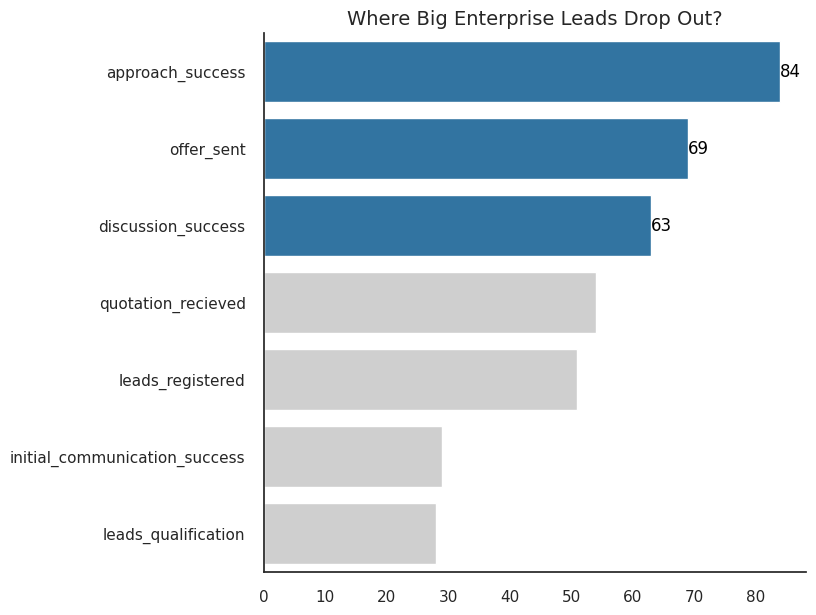

In [ ]:
#Where Cluster 0 mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster0_stagecount = df_gmm_visual.query("cluster == 0")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster0_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster0_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster0_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(7,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster0_stagecount.index,
            data=df_gmm_cluster0_stagecount, orient='h',
            order = df_gmm_cluster0_stagecount.index, ax=ax, palette=color)

plt.title('Where Big Enterprise Leads Drop Out?', fontsize=14)
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')

plt.show()
fig.savefig('Where Big Enterprise Leads Drop Out.png', format='png', bbox_inches='tight', dpi=200)

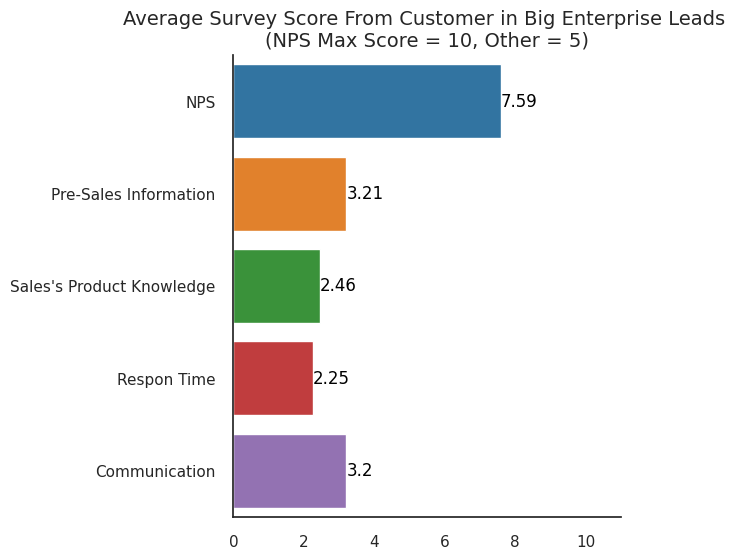

In [ ]:
#Survey Result from Customer in Cluster 0
df_survey_cluster0 = df2.merge(df_gmm_visual.query("cluster == 0"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='mean', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Average Survey Score From Customer in Big Enterprise Leads \n(NPS Max Score = 10, Other = 5)', fontsize=14)
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

fig.savefig('Average Survey Score From Customer in Big Enterprise.png', format='png', bbox_inches='tight', dpi=200)

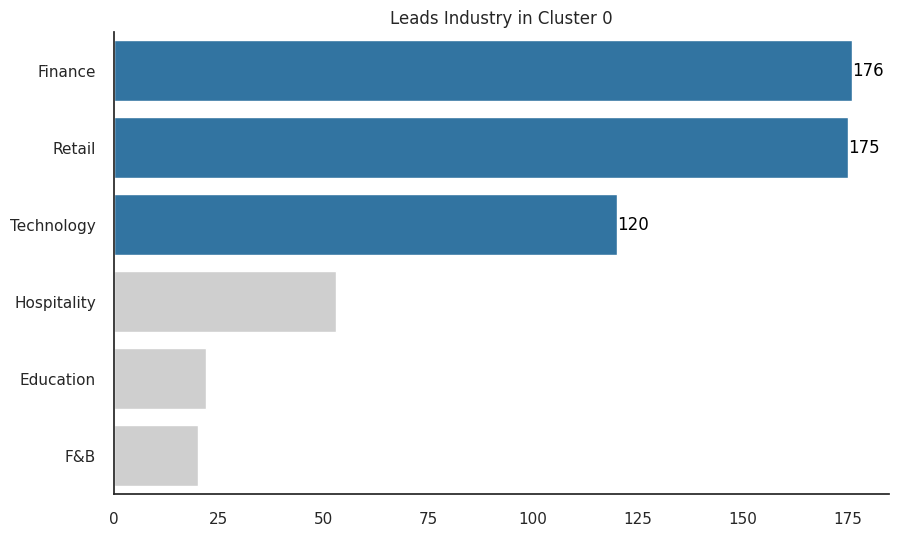

In [ ]:
#Top 3 industry
df_industry_cluster0 = df_gmm_visual.query("cluster == 0").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster0.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster0['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster0, y=df_industry_cluster0.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 0')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

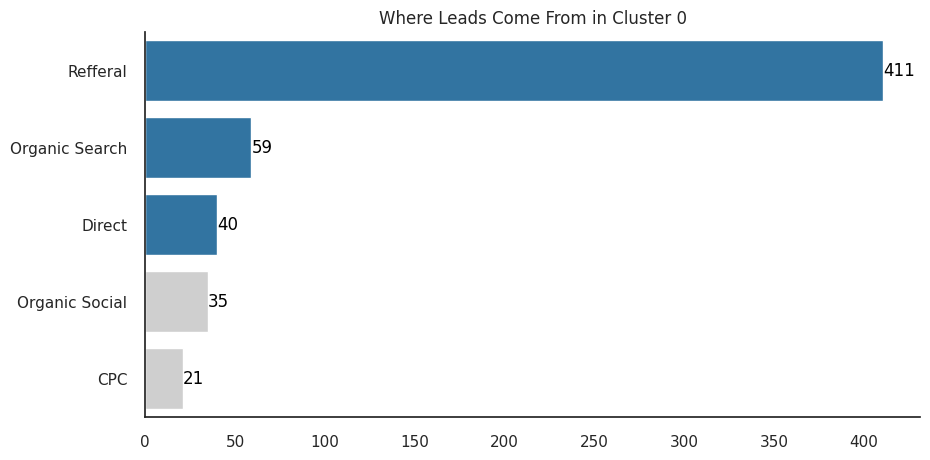

In [ ]:
#Top 3 session_source
df_session_cluster0 = df_gmm_visual.query("cluster == 0").groupby('session_source').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_session_cluster0.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_session_cluster0['col']]

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(data=df_session_cluster0, y=df_session_cluster0.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Where Leads Come From in Cluster 0')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  # if i < 3:
  ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

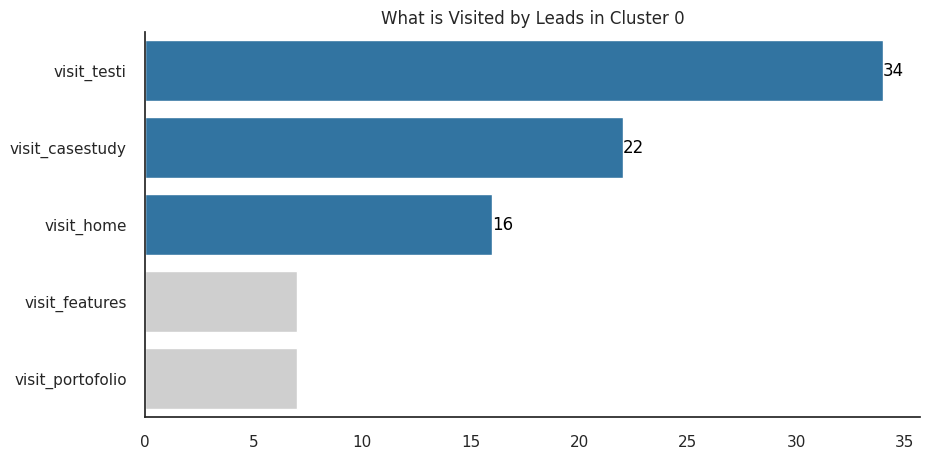

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual.groupby('cluster')[page].agg('sum')

df_pagevisit_cluster0 = df_pagevisit.reindex([0]).T\
                        .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster0.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster0['col']]

plot = sns.barplot(df_pagevisit_cluster0, y=df_pagevisit_cluster0.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster0.index)
plt.title('What is Visited by Leads in Cluster 0')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

In [ ]:
#Register 1 month before discount
df_discount_0 = df_gmm_visual.query("cluster==0").groupby(['leads_reg_month','discount_month_b1'],as_index=False)['leads_id'].count()
df_discount_0

,leads_reg_month,discount_month_b1,leads_id
0,1,0,29
1,2,0,36
2,3,1,50
3,4,0,42
4,5,0,51
5,6,1,57
6,7,0,45
7,8,0,50
8,9,1,71
9,10,0,41


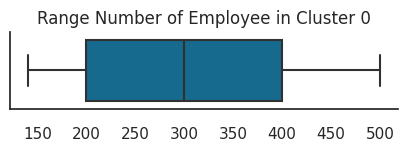

In [ ]:
#Number of employee in cluster 0
df_emp_cluster0 = df_gmm_visual.query("cluster == 0")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster0, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 0')
plt.xlabel('')
plt.show()

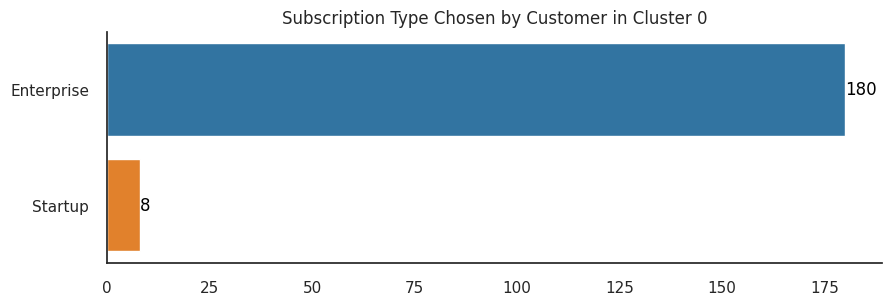

In [ ]:
#What kind of subscription is chosen by customer in cluster 0
df_gmm_contract0 = df_gmm_visual.query("cluster==0").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract0, y=df_gmm_contract0.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Cluster 0')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

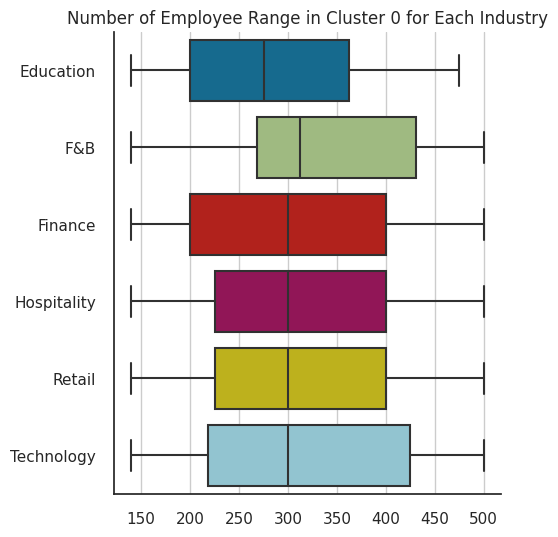

In [ ]:
#Number of employee for each industry in cluster 0
df_emp_cluster0 = df_gmm_visual.query("cluster == 0")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster0, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 0 for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual0 = df_gmm_visual.copy().query("cluster == 0")
df_gmm_visual0['second_page'] = df_gmm_visual0['second_page'].fillna(9)
df_gmm_visual0['third_page'] = np.where(
    (df_gmm_visual0['second_page']==9)&(df_gmm_visual0['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual0['second_page'].isin(range(9)))&(df_gmm_visual0['third_page'].isna()),
         9,df_gmm_visual0['third_page']
    ))
df_gmm_visual0['fourth_page'] = np.where(
    (df_gmm_visual0['third_page']==9)&(df_gmm_visual0['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual0['third_page'].isin(range(9)))&(df_gmm_visual0['fourth_page'].isna()),
         9,df_gmm_visual0['fourth_page']
    ))
df_gmm_visual0['fifth_page'] = np.where(
    (df_gmm_visual0['fourth_page']==9)&(df_gmm_visual0['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual0['fourth_page'].isin(range(9)))&(df_gmm_visual0['fifth_page'].isna()),
         9,df_gmm_visual0['fifth_page']
    ))
df_gmm_visual0['sixth_page'] = np.where(
    (df_gmm_visual0['fifth_page']==9)&(df_gmm_visual0['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual0['fifth_page'].isin(range(9)))&(df_gmm_visual0['sixth_page'].isna()),
         9,df_gmm_visual0['sixth_page']
    ))

new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual0.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual0.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual0.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual0.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual0.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'green',
               'green', 'green', 'orange',
               'orange', 'orange', 'black']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Big Enterprise Leads Page Journey", font_size=14)
fig.show()

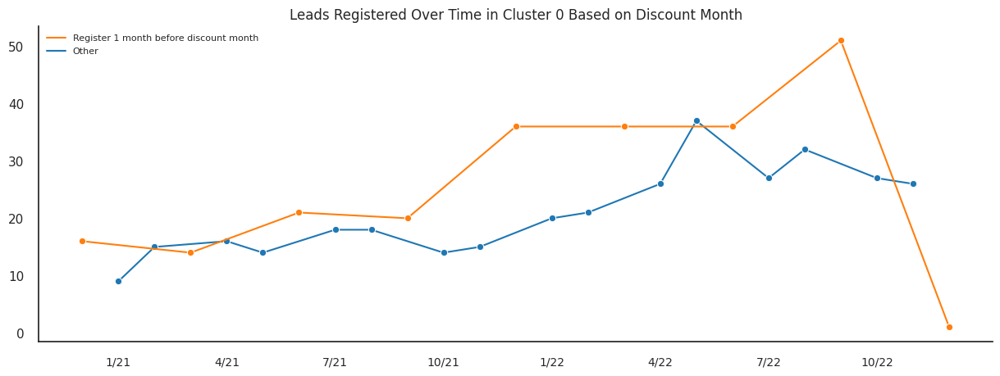

In [ ]:
#leads registered over time
df_gmm_monthp = df_gmm_visual.query("cluster==0").groupby(['leads_reg_month_period', 'discount_month_b1'], as_index=False).agg({'leads_id':'count'})
df_gmm_monthp['leads_reg_month_period'] = df_gmm_monthp['leads_reg_month_period'].astype('str')

rename_month = ['','1/21', '', '', '4/21', '', '',
                '7/21', '', '', '10/21', '', '', '1/22', '',
                '', '4/22', '', '', '7/22', '', '', '10/22',
                '', '']

fig, ax = plt.subplots(figsize=(15,5))

plot = sns.lineplot(data=df_gmm_monthp, x='leads_reg_month_period', y='leads_id',
                    hue='discount_month_b1', ax=ax,
                    palette='tab10', marker='o')

ax.set_xticks(ax.get_xticks(), rename_month, fontsize=10)
ax.set_ylabel('')
ax.set_xlabel('')
plt.title("Leads Registered Over Time in Cluster 0 Based on Discount Month")
handles, labels = ax.get_legend_handles_labels()
ax.legend([handles[1],handles[0]], ['Register 1 month before discount month', 'Other'], title=(''), fontsize=8)

plt.show()

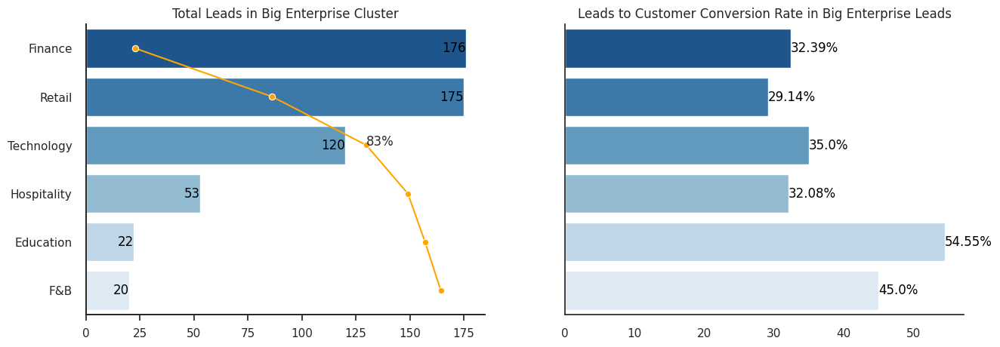

In [ ]:
#leads_to_won ratio and sum per industry
df_won_mean = df_gmm_visual0.groupby('industry').agg({'deal_won':'mean'}).round(4)*100
df_won_mean = df_won_mean.sort_values(by='deal_won', ascending=False)

fig, ax = plt.subplots(figsize=(15,5), nrows=1, ncols=2, sharey=True)

df_won_sum = df_gmm_visual0.groupby('industry').agg({'leads_id':'count'})
df_won_sum = df_won_sum.sort_values(by='leads_id', ascending=False)

plot2 = sns.barplot(x="leads_id", y=df_won_sum.index, data=df_won_sum, palette='Blues_r', orient='h', order = df_won_sum.index, ax=ax[0])
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Total Leads in Big Enterprise Cluster')
for i,v in enumerate(plot2.patches):
  v = v.get_width()
  y = ax[0].get_yticks()[i]
  ax[0].text(v, y, "{:,}".format(round(v),0), horizontalalignment='right', verticalalignment='center', color='black')
ax[0].tick_params(bottom = False)

ax2 = ax[0].twiny()
df_won_sum['cum_percentage'] = np.round(df_won_sum['leads_id'].cumsum()/df_won_sum['leads_id'].sum() * 100,2)
plot3 = sns.lineplot(data=df_won_sum, y='industry', x='cum_percentage', color='orange', marker='o', ax=ax2, orient='y')
ax2.set_xlabel('')
ax2.set_xticks(ax2.get_xticks(),['','','','','','','','','',''])
ax2.tick_params(top = False)
for i,v in enumerate(df_won_sum['cum_percentage']):
  if v >= 80:
    plt.text(v, i, f"{round(v)}%")
    break
  else:
    continue

plot = sns.barplot(x="deal_won", y=df_won_mean.index, data=df_won_mean, palette='Blues_r', orient='h', order = df_won_sum.index, ax=ax[1])
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('Leads to Customer Conversion Rate in Big Enterprise Leads')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax[1].get_yticks()[i]
  ax[1].text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()
fig.savefig('leads_conv_total0.png', format='png', bbox_inches='tight', dpi=200)

####Cluster 1 Persona

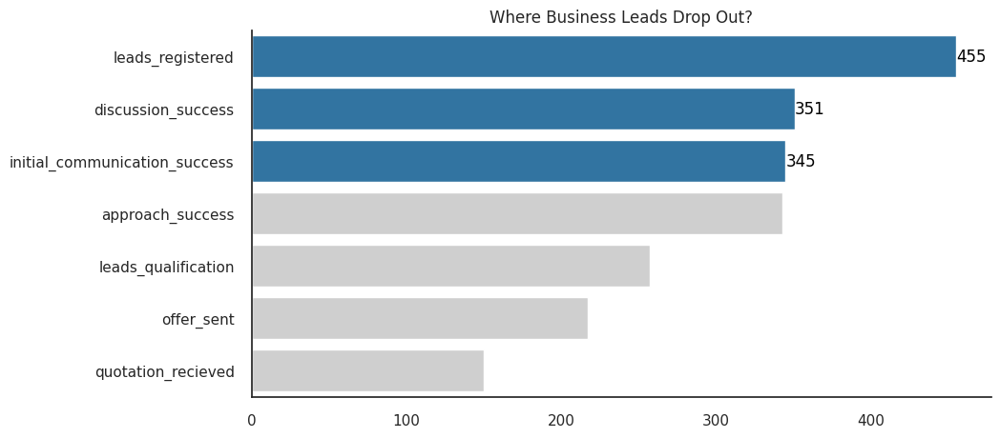

In [ ]:
#Where Cluster 1 mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual.query("cluster == 1")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Business Leads Drop Out?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

fig.savefig('Where Business Leads Drop Out?.png', format='png', bbox_inches='tight', dpi=200)

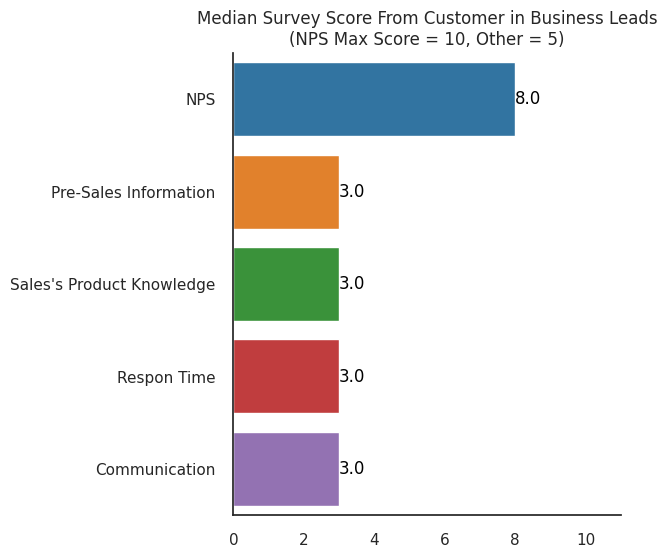

In [ ]:
#Survey Result from Customer in Cluster 1
df_survey_cluster0 = df2.merge(df_gmm_visual.query("cluster == 1"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='median', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Median Survey Score From Customer in Business Leads\n(NPS Max Score = 10, Other = 5)')
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

fig.savefig('Median Survey Score From Customer in Business Leads.png', format='png', bbox_inches='tight', dpi=200)

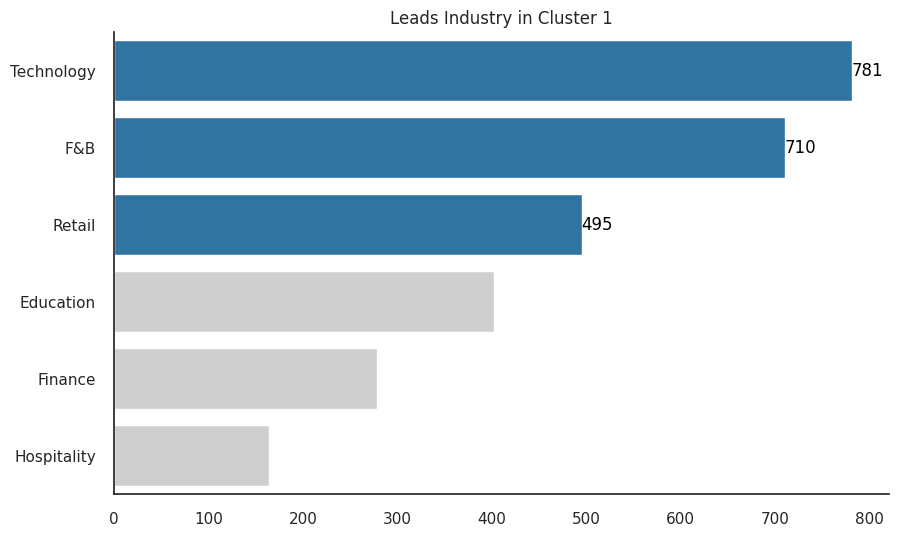

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual.query("cluster == 1").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

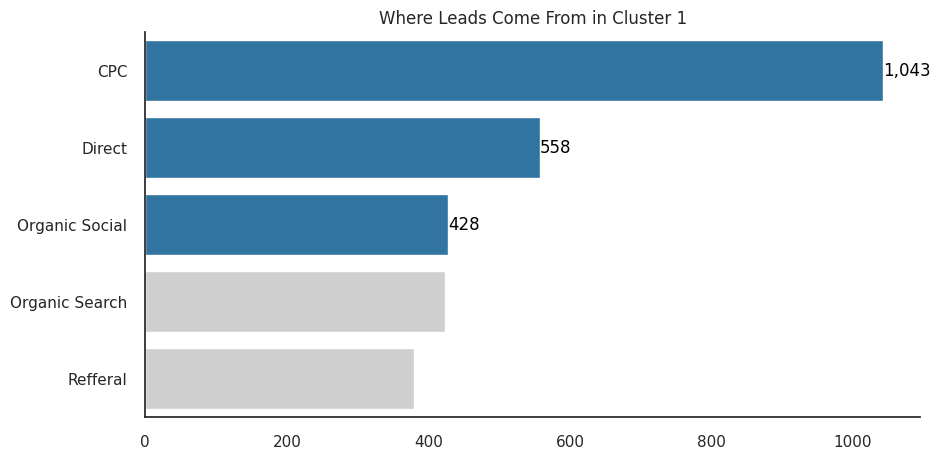

In [ ]:
#Top 3 session_source
df_session_cluster1 = df_gmm_visual.query("cluster == 1").groupby('session_source').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_session_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_session_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(data=df_session_cluster1, y=df_session_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Where Leads Come From in Cluster 1')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

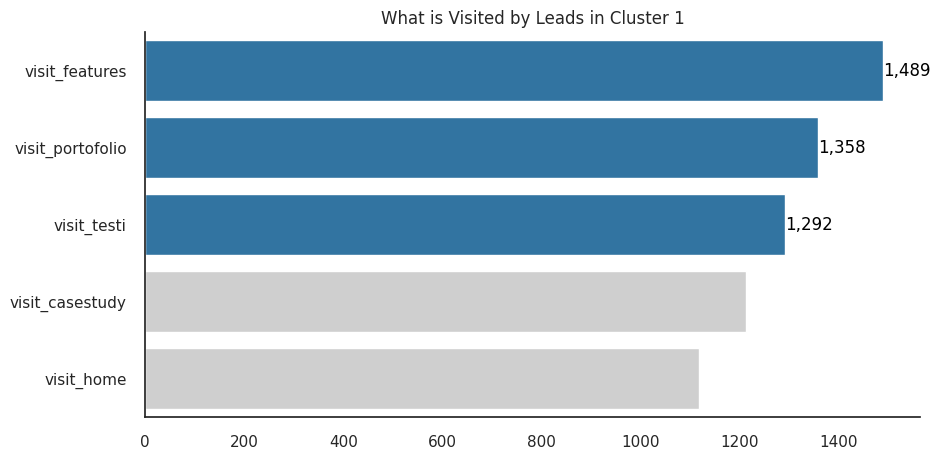

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual.groupby('cluster')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex([1]).T\
                        .rename(columns={1:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

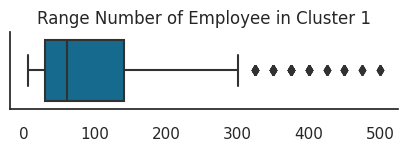

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1')
plt.xlabel('')
plt.show()

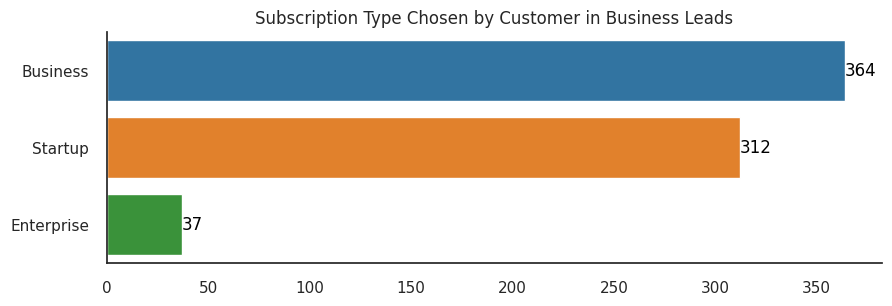

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual.query("cluster==1").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Business Leads')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

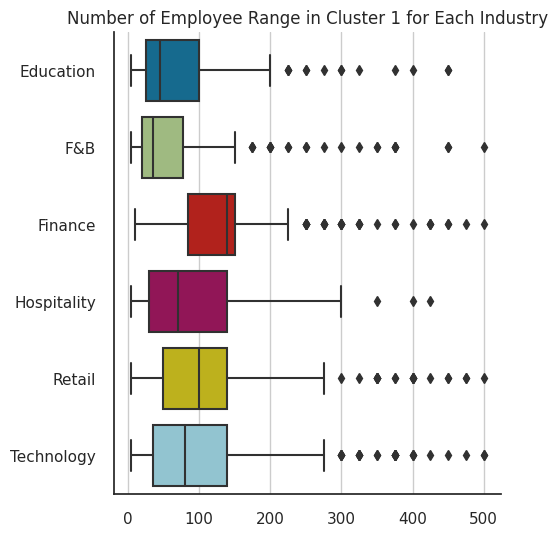

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
df_gmm_visual[journey_list].head()

,first_page,second_page,third_page,fourth_page,fifth_page,sixth_page
0,3.0,4.0,5.0,NaN,NaN,NaN
1,1.0,6.0,NaN,NaN,NaN,NaN
2,0.0,4.0,2.0,6.0,NaN,NaN
3,1.0,3.0,8.0,5.0,NaN,NaN
4,4.0,2.0,6.0,NaN,NaN,NaN


In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual1 = df_gmm_visual.copy().query("cluster == 1")
df_gmm_visual1['second_page'] = df_gmm_visual1['second_page'].fillna(9)
df_gmm_visual1['third_page'] = np.where(
    (df_gmm_visual1['second_page']==9)&(df_gmm_visual1['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['second_page'].isin(range(9)))&(df_gmm_visual1['third_page'].isna()),
         9,df_gmm_visual1['third_page']
    ))
df_gmm_visual1['fourth_page'] = np.where(
    (df_gmm_visual1['third_page']==9)&(df_gmm_visual1['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['third_page'].isin(range(9)))&(df_gmm_visual1['fourth_page'].isna()),
         9,df_gmm_visual1['fourth_page']
    ))
df_gmm_visual1['fifth_page'] = np.where(
    (df_gmm_visual1['fourth_page']==9)&(df_gmm_visual1['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fourth_page'].isin(range(9)))&(df_gmm_visual1['fifth_page'].isna()),
         9,df_gmm_visual1['fifth_page']
    ))
df_gmm_visual1['sixth_page'] = np.where(
    (df_gmm_visual1['fifth_page']==9)&(df_gmm_visual1['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fifth_page'].isin(range(9)))&(df_gmm_visual1['sixth_page'].isna()),
         9,df_gmm_visual1['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual1.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual1.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual1.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual1.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual1.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'orange',
               'blue', 'green', 'orange',
               'blue', 'green', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Business leads Page Journey", font_size=14)
fig.show()

In [ ]:
df_gmm_visual1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2831 entries, 0 to 3396
Data columns (total 51 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      2831 non-null   int64        
 1   number_of_employee            2831 non-null   int64        
 2   leads_reg_year                2831 non-null   int64        
 3   leads_reg_quarter             2831 non-null   int64        
 4   leads_reg_month               2831 non-null   int64        
 5   leads_reg_quarter_period      2831 non-null   period[Q-DEC]
 6   leads_reg_month_period        2831 non-null   period[M]    
 7   discount_month                2831 non-null   int64        
 8   discount_month_b1             2831 non-null   int64        
 9   industry_Education            2831 non-null   uint8        
 10  industry_F&B                  2831 non-null   uint8        
 11  industry_Finance              2831 non-null

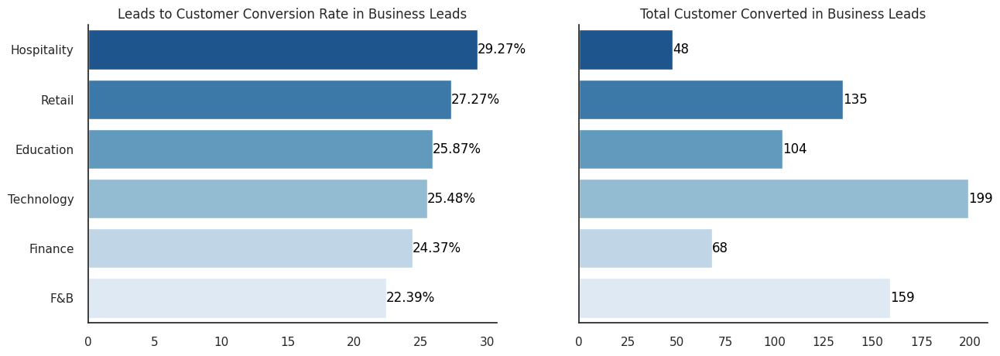

In [ ]:
#leads_to_won ratio and sum per industry
df_won_mean = df_gmm_visual1.groupby('industry').agg({'deal_won':'mean'}).round(4)*100
df_won_mean = df_won_mean.sort_values(by='deal_won', ascending=False)

fig, ax = plt.subplots(figsize=(15,5), nrows=1, ncols=2, sharey=True)
plot = sns.barplot(x="deal_won", y=df_won_mean.index, data=df_won_mean, palette='Blues_r', orient='h', order = df_won_mean.index, ax=ax[0])
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Leads to Customer Conversion Rate in Business Leads')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax[0].get_yticks()[i]
  ax[0].text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

df_won_sum = df_gmm_visual1.groupby('industry').agg({'deal_won':'sum'})
df_won_sum = df_won_sum.sort_values(by='deal_won', ascending=False)

plot2 = sns.barplot(x="deal_won", y=df_won_sum.index, data=df_won_sum, palette='Blues_r', orient='h', order = df_won_mean.index, ax=ax[1])
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('Total Customer Converted in Business Leads')
for i,v in enumerate(plot2.patches):
  v = v.get_width()
  y = ax[1].get_yticks()[i]
  ax[1].text(v, y, "{:,}".format(round(v),0), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()
fig.savefig('leads_conv_total1.png', format='png', bbox_inches='tight', dpi=200)

####Cluster 1 Persona with num employee >= 140

In [ ]:
df_gmm_visual_140 = df_gmm_visual.query("number_of_employee >= 140")
len(df_gmm_visual_140.query("cluster == 1"))

777

In [ ]:
df_gmm_visual_140.query("cluster == 1")['deal_won'].mean()*100

27.927927927927925

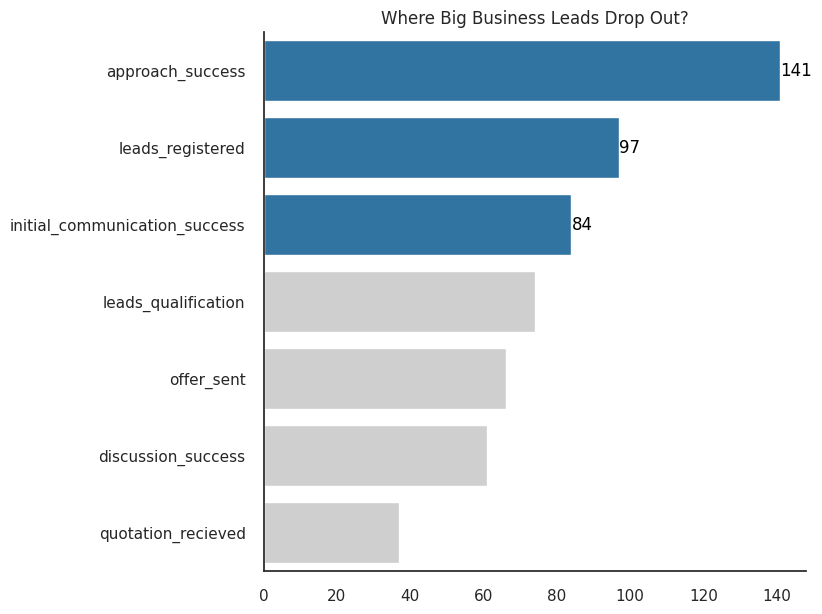

In [ ]:
#Where Cluster 1 mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual_140.query("cluster == 1")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(7,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Big Business Leads Drop Out?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

fig.savefig('Where Regular 1 Drop Out?.png', format='png', bbox_inches='tight', dpi=200)

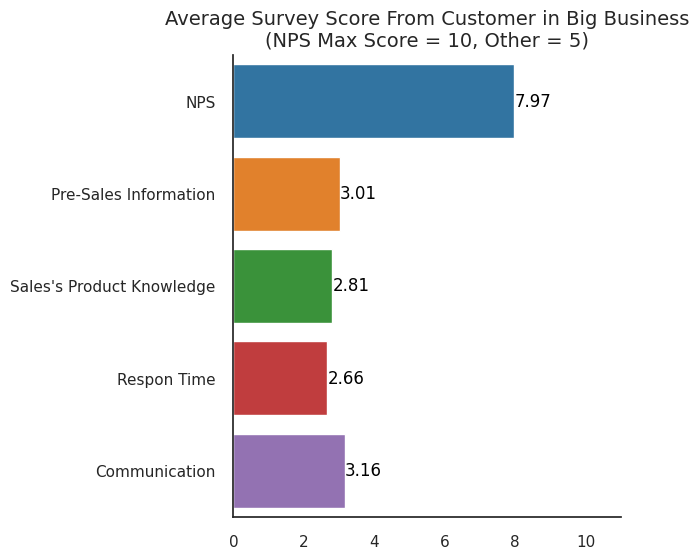

In [ ]:
#Survey Result from Customer in Cluster 1
df_survey_cluster0 = df2.merge(df_gmm_visual_140.query("cluster == 1"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='mean', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Average Survey Score From Customer in Big Business\n(NPS Max Score = 10, Other = 5)',fontsize=14)
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

fig.savefig('Average Survey Score From Customer in Regular above 140.png', format='png', bbox_inches='tight', dpi=200)

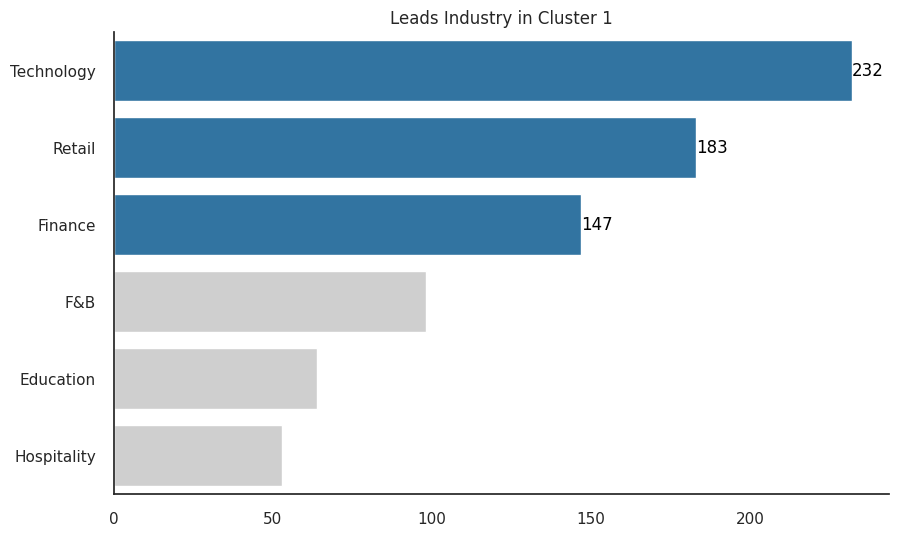

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual_140.query("cluster == 1").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

fig.savefig('Industry regular above 140.png', format='png', bbox_inches='tight', dpi=200)

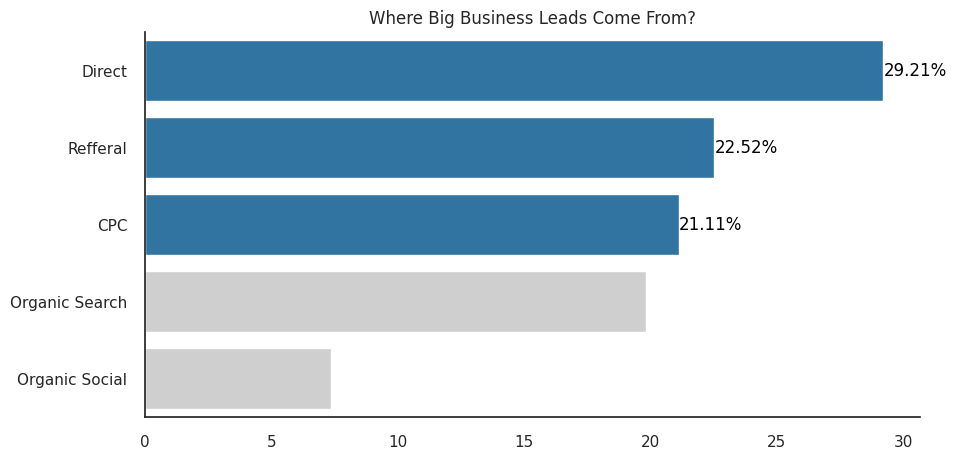

In [ ]:
#Top 3 session_source
df_session_cluster1 = df_gmm_visual_140.query("cluster == 1").groupby('session_source').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})
df_session_cluster1['col'] = df_session_cluster1['col']/df_session_cluster1['col'].sum()*100
color = [sns.color_palette('tab10')[0] if x in df_session_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_session_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(data=df_session_cluster1, y=df_session_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Where Big Business Leads Come From?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

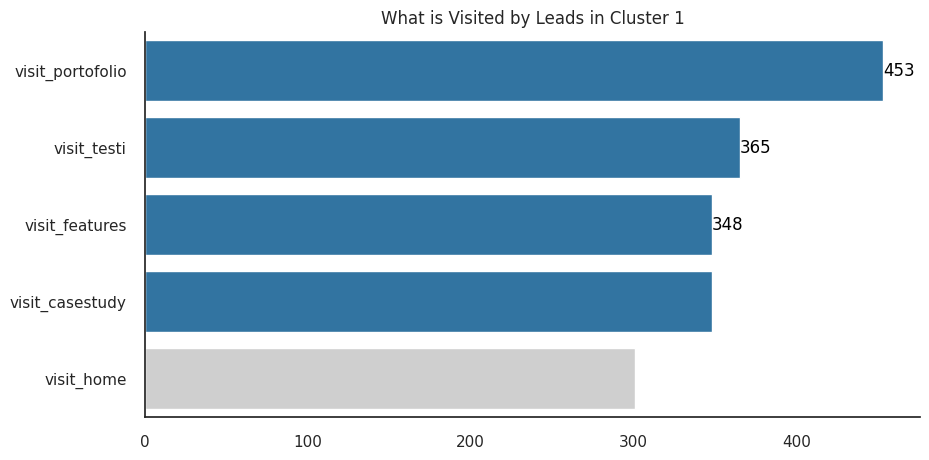

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual_140.groupby('cluster')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex([1]).T\
                        .rename(columns={1:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

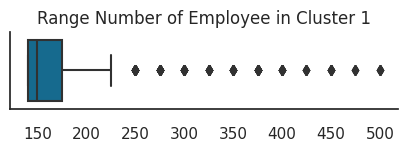

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual_140.query("cluster == 1")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1')
plt.xlabel('')
plt.show()

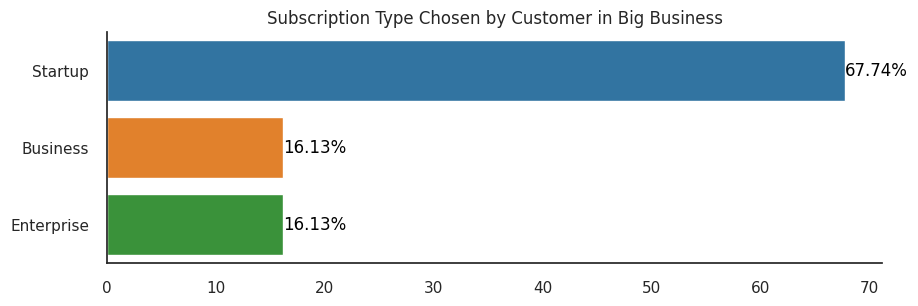

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual_140.query("cluster==1").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)
df_gmm_contract1['col'] = df_gmm_contract1['col']/df_gmm_contract1['col'].sum()*100
fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Big Business')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

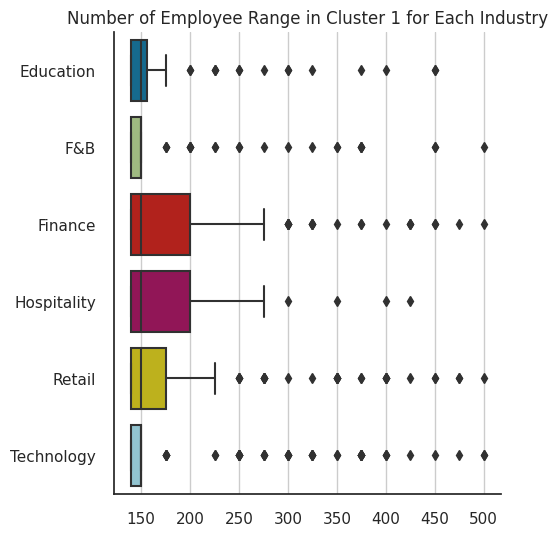

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual_140.query("cluster == 1")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
df_gmm_visual_140[journey_list].head()

,first_page,second_page,third_page,fourth_page,fifth_page,sixth_page
72,3.0,2.0,4.0,3.0,5.0,5.0
73,8.0,NaN,NaN,NaN,NaN,NaN
74,8.0,NaN,NaN,NaN,NaN,NaN
201,2.0,6.0,NaN,NaN,NaN,NaN
202,0.0,3.0,6.0,8.0,NaN,NaN


In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual_1401 = df_gmm_visual_140.copy().query("cluster == 1")
df_gmm_visual_1401['second_page'] = df_gmm_visual_1401['second_page'].fillna(9)
df_gmm_visual_1401['third_page'] = np.where(
    (df_gmm_visual_1401['second_page']==9)&(df_gmm_visual_1401['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_1401['second_page'].isin(range(9)))&(df_gmm_visual_1401['third_page'].isna()),
         9,df_gmm_visual_1401['third_page']
    ))
df_gmm_visual_1401['fourth_page'] = np.where(
    (df_gmm_visual_1401['third_page']==9)&(df_gmm_visual_1401['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_1401['third_page'].isin(range(9)))&(df_gmm_visual_1401['fourth_page'].isna()),
         9,df_gmm_visual_1401['fourth_page']
    ))
df_gmm_visual_1401['fifth_page'] = np.where(
    (df_gmm_visual_1401['fourth_page']==9)&(df_gmm_visual_1401['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_1401['fourth_page'].isin(range(9)))&(df_gmm_visual_1401['fifth_page'].isna()),
         9,df_gmm_visual_1401['fifth_page']
    ))
df_gmm_visual_1401['sixth_page'] = np.where(
    (df_gmm_visual_1401['fifth_page']==9)&(df_gmm_visual_1401['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_1401['fifth_page'].isin(range(9)))&(df_gmm_visual_1401['sixth_page'].isna()),
         9,df_gmm_visual_1401['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual_1401.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual_1401.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual_1401.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual_1401.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual_1401.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'green',
               'green', 'green', 'orange',
               'orange', 'orange', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Big Business Page Journey", font_size=14)
fig.show()

In [ ]:
df_gmm_visual_1401.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 777 entries, 72 to 3396
Data columns (total 51 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      777 non-null    int64        
 1   number_of_employee            777 non-null    int64        
 2   leads_reg_year                777 non-null    int64        
 3   leads_reg_quarter             777 non-null    int64        
 4   leads_reg_month               777 non-null    int64        
 5   leads_reg_quarter_period      777 non-null    period[Q-DEC]
 6   leads_reg_month_period        777 non-null    period[M]    
 7   discount_month                777 non-null    int64        
 8   discount_month_b1             777 non-null    int64        
 9   industry_Education            777 non-null    uint8        
 10  industry_F&B                  777 non-null    uint8        
 11  industry_Finance              777 non-null 

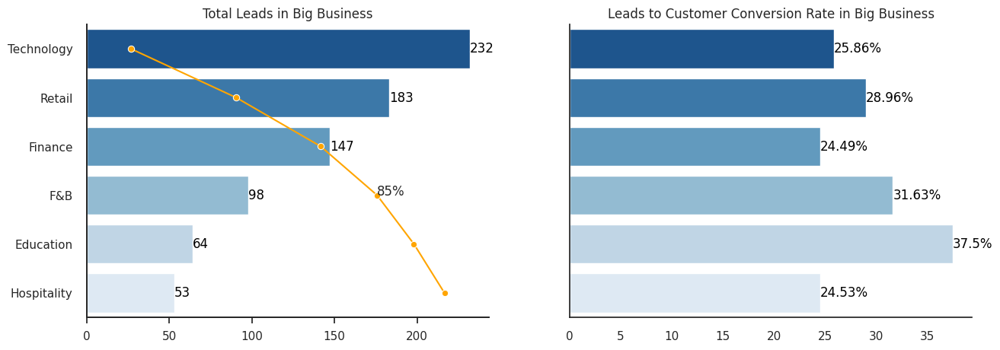

In [ ]:
#leads_to_won ratio and sum per industry
fig, ax = plt.subplots(figsize=(15,5), nrows=1, ncols=2, sharey=True)

df_won_sum = df_gmm_visual_1401.groupby('industry').agg({'leads_id':'count'})
df_won_sum = df_won_sum.sort_values(by='leads_id', ascending=False)

plot2 = sns.barplot(x="leads_id", y=df_won_sum.index, data=df_won_sum, palette='Blues_r', orient='h', order = df_won_sum.index, ax=ax[0])
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Total Leads in Big Business')
for i,v in enumerate(plot2.patches):
  v = v.get_width()
  y = ax[0].get_yticks()[i]
  ax[0].text(v, y, "{:,}".format(round(v),0), horizontalalignment='left', verticalalignment='center', color='black')

ax2 = ax[0].twiny()
df_won_sum['cum_percentage'] = np.round(df_won_sum['leads_id'].cumsum()/df_won_sum['leads_id'].sum() * 100,2)
plot3 = sns.lineplot(data=df_won_sum, y='industry', x='cum_percentage', color='orange', marker='o', ax=ax2, orient='y')
ax2.set_xlabel('')
ax2.set_xticks(ax2.get_xticks(),['','','','','','','','','',''])
ax2.tick_params(top = False)
for i,v in enumerate(df_won_sum['cum_percentage']):
  if v >= 80:
    plt.text(v, i, f"{round(v)}%")
    break
  else:
    continue

df_won_mean = df_gmm_visual_1401.groupby('industry').agg({'deal_won':'mean'}).round(4)*100
df_won_mean = df_won_mean.sort_values(by='deal_won', ascending=False)

plot = sns.barplot(x="deal_won", y=df_won_mean.index, data=df_won_mean, palette='Blues_r', orient='h', order = df_won_sum.index, ax=ax[1])
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('Leads to Customer Conversion Rate in Big Business')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax[1].get_yticks()[i]
  ax[1].text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()
fig.savefig('leads_conv_total1_0.png', format='png', bbox_inches='tight', dpi=200)

####Cluster 1 Persona with num employee < 140

In [ ]:
df_gmm_visual_min140 = df_gmm_visual.query("number_of_employee < 140")
len(df_gmm_visual_min140.query("cluster == 1"))

2054

In [ ]:
df_gmm_visual_min140['deal_won'].mean()*100

24.148003894839338

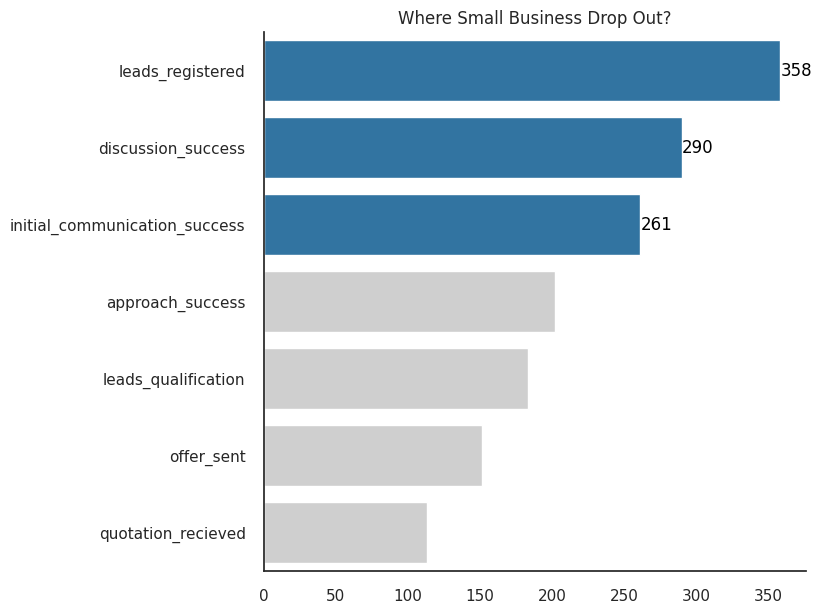

In [ ]:
#Where Cluster 1 mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual_min140.query("cluster == 1")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(7,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Small Business Drop Out?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

fig.savefig('Where Regular Leads with under 140 EmployeDrop Out?.png', format='png', bbox_inches='tight', dpi=200)

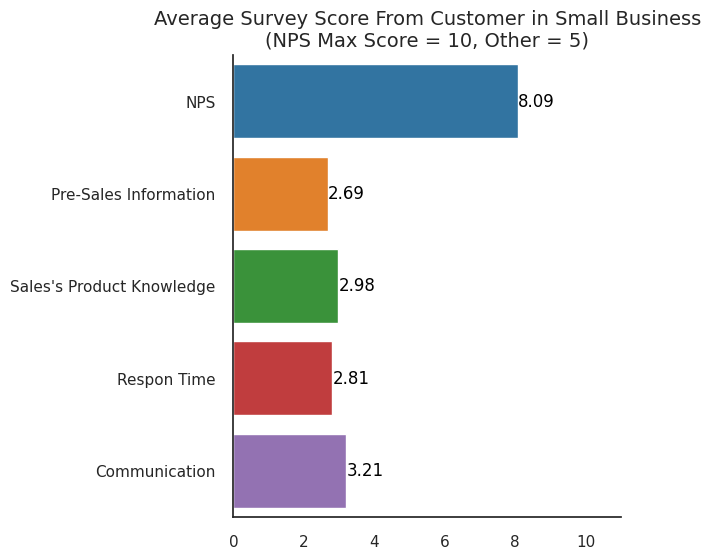

In [ ]:
#Survey Result from Customer in Cluster 1
df_survey_cluster0 = df2.merge(df_gmm_visual_min140.query("cluster == 1"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='mean', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Average Survey Score From Customer in Small Business\n(NPS Max Score = 10, Other = 5)', fontsize=14)
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

fig.savefig('Average Survey Score From Customer in Regular Leads under 140.png', format='png', bbox_inches='tight', dpi=200)

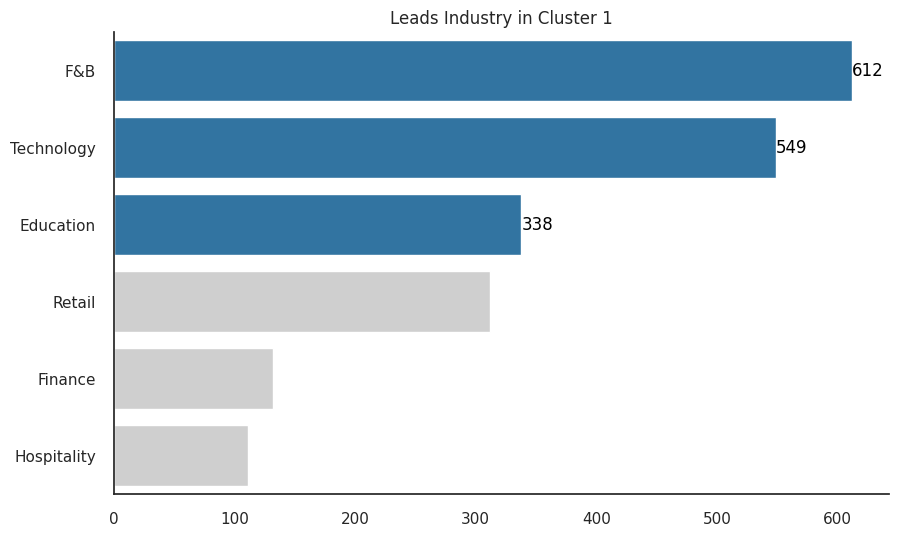

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual_min140.query("cluster == 1").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

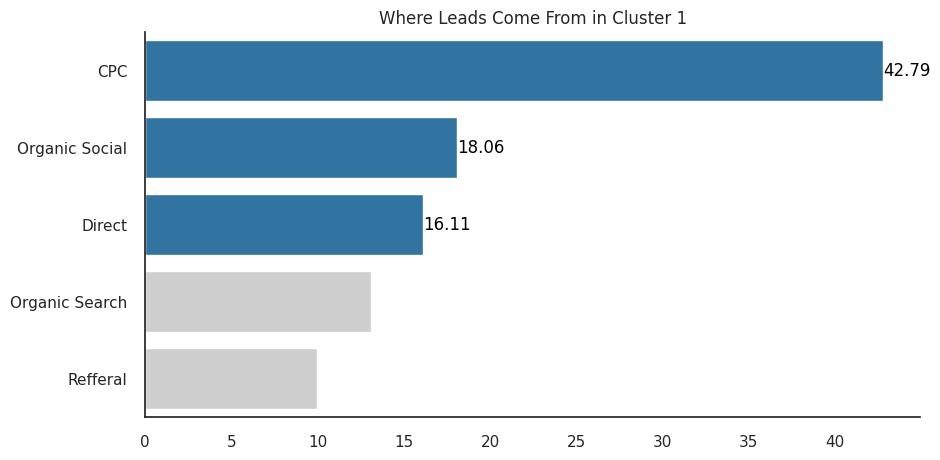

In [ ]:
#Top 3 session_source
df_session_cluster1 = df_gmm_visual_min140.query("cluster == 1").groupby('session_source').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})
df_session_cluster1['col'] = df_session_cluster1['col']/df_session_cluster1['col'].sum()*100
color = [sns.color_palette('tab10')[0] if x in df_session_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_session_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(data=df_session_cluster1, y=df_session_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Where Leads Come From in Cluster 1')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

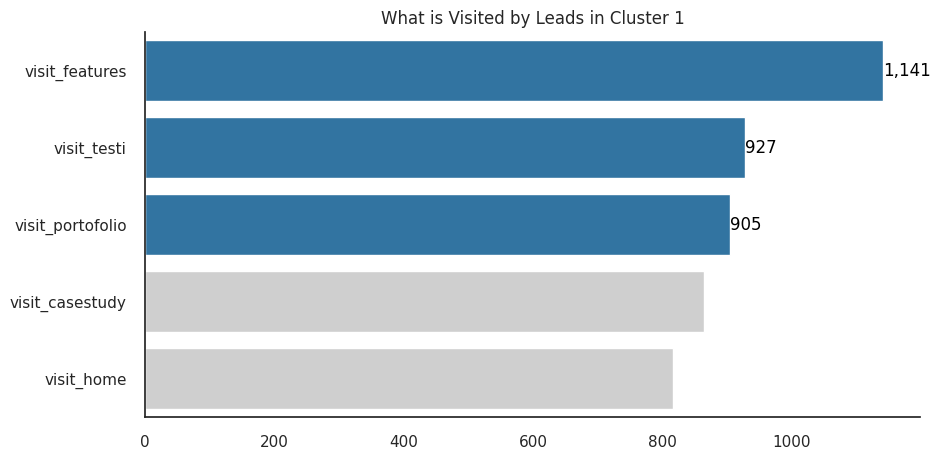

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual_min140.groupby('cluster')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex([1]).T\
                        .rename(columns={1:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

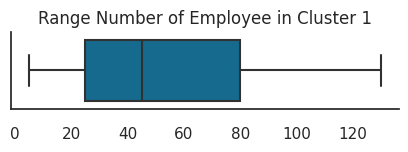

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual_min140.query("cluster == 1")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1')
plt.xlabel('')
plt.show()

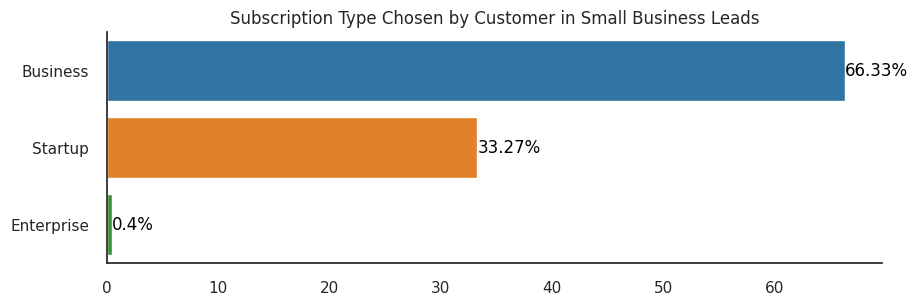

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual_min140.query("cluster==1").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)
df_gmm_contract1['col'] = df_gmm_contract1['col']/df_gmm_contract1['col'].sum()*100
fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Small Business Leads')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

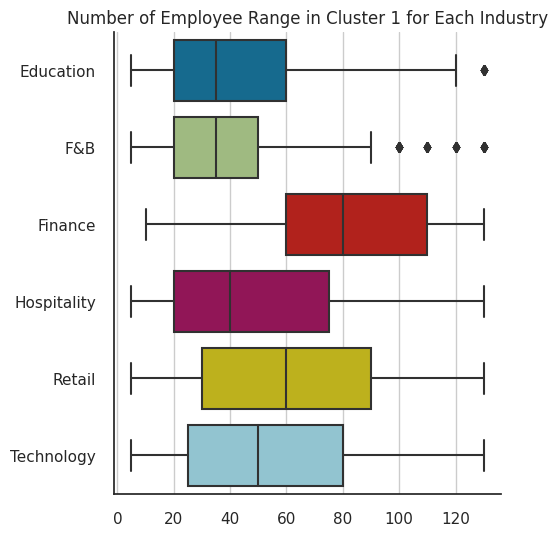

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual_min140.query("cluster == 1")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
df_gmm_visual_min140[journey_list].head()

,first_page,second_page,third_page,fourth_page,fifth_page,sixth_page
0,3.0,4.0,5.0,NaN,NaN,NaN
1,1.0,6.0,NaN,NaN,NaN,NaN
2,0.0,4.0,2.0,6.0,NaN,NaN
3,1.0,3.0,8.0,5.0,NaN,NaN
4,4.0,2.0,6.0,NaN,NaN,NaN


In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual_min1401 = df_gmm_visual_min140.copy().query("cluster == 1")
df_gmm_visual_min1401['second_page'] = df_gmm_visual_min1401['second_page'].fillna(9)
df_gmm_visual_min1401['third_page'] = np.where(
    (df_gmm_visual_min1401['second_page']==9)&(df_gmm_visual_min1401['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['second_page'].isin(range(9)))&(df_gmm_visual_min1401['third_page'].isna()),
         9,df_gmm_visual_min1401['third_page']
    ))
df_gmm_visual_min1401['fourth_page'] = np.where(
    (df_gmm_visual_min1401['third_page']==9)&(df_gmm_visual_min1401['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['third_page'].isin(range(9)))&(df_gmm_visual_min1401['fourth_page'].isna()),
         9,df_gmm_visual_min1401['fourth_page']
    ))
df_gmm_visual_min1401['fifth_page'] = np.where(
    (df_gmm_visual_min1401['fourth_page']==9)&(df_gmm_visual_min1401['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['fourth_page'].isin(range(9)))&(df_gmm_visual_min1401['fifth_page'].isna()),
         9,df_gmm_visual_min1401['fifth_page']
    ))
df_gmm_visual_min1401['sixth_page'] = np.where(
    (df_gmm_visual_min1401['fifth_page']==9)&(df_gmm_visual_min1401['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['fifth_page'].isin(range(9)))&(df_gmm_visual_min1401['sixth_page'].isna()),
         9,df_gmm_visual_min1401['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual_min1401.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual_min1401.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual_min1401.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual_min1401.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual_min1401.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'green',
               'green', 'green', 'orange',
               'orange', 'orange', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Small Business leads Page Journey", font_size=14)
fig.show()

In [ ]:
df_gmm_visual_min1401.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2054 entries, 0 to 3096
Data columns (total 51 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      2054 non-null   int64        
 1   number_of_employee            2054 non-null   int64        
 2   leads_reg_year                2054 non-null   int64        
 3   leads_reg_quarter             2054 non-null   int64        
 4   leads_reg_month               2054 non-null   int64        
 5   leads_reg_quarter_period      2054 non-null   period[Q-DEC]
 6   leads_reg_month_period        2054 non-null   period[M]    
 7   discount_month                2054 non-null   int64        
 8   discount_month_b1             2054 non-null   int64        
 9   industry_Education            2054 non-null   uint8        
 10  industry_F&B                  2054 non-null   uint8        
 11  industry_Finance              2054 non-null

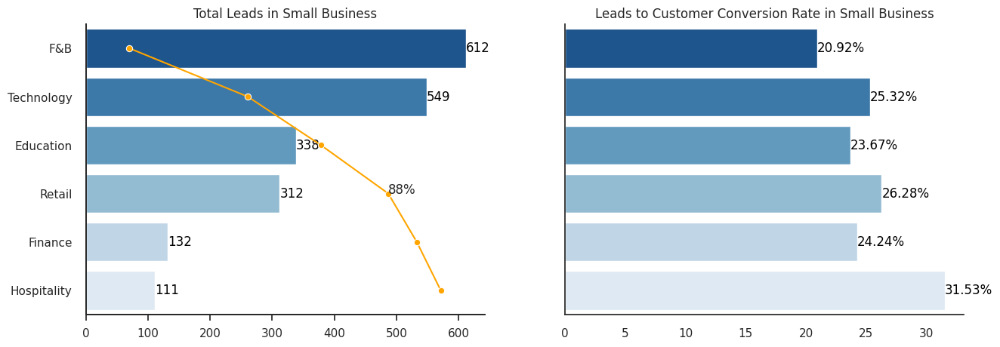

In [ ]:
#leads_to_won ratio and sum per industry
fig, ax = plt.subplots(figsize=(15,5), nrows=1, ncols=2, sharey=True)

df_won_sum = df_gmm_visual_min1401.groupby('industry').agg({'leads_id':'count'})
df_won_sum = df_won_sum.sort_values(by='leads_id', ascending=False)

plot2 = sns.barplot(x="leads_id", y=df_won_sum.index, data=df_won_sum, palette='Blues_r', orient='h', order = df_won_sum.index, ax=ax[0])
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Total Leads in Small Business')
for i,v in enumerate(plot2.patches):
  v = v.get_width()
  y = ax[0].get_yticks()[i]
  ax[0].text(v, y, "{:,}".format(round(v),0), horizontalalignment='left', verticalalignment='center', color='black')

ax2 = ax[0].twiny()
df_won_sum['cum_percentage'] = np.round(df_won_sum['leads_id'].cumsum()/df_won_sum['leads_id'].sum() * 100,2)
plot3 = sns.lineplot(data=df_won_sum, y='industry', x='cum_percentage', color='orange', marker='o', ax=ax2, orient='y')
ax2.set_xlabel('')
ax2.set_xticks(ax2.get_xticks(),['','','','','','','','','',''])
ax2.tick_params(top = False)
for i,v in enumerate(df_won_sum['cum_percentage']):
  if v >= 80:
    plt.text(v, i, f"{round(v)}%")
    break
  else:
    continue

df_won_mean = df_gmm_visual_min1401.groupby('industry').agg({'deal_won':'mean'}).round(4)*100
df_won_mean = df_won_mean.sort_values(by='deal_won', ascending=False)

plot = sns.barplot(x="deal_won", y=df_won_mean.index, data=df_won_mean, palette='Blues_r', orient='h', order = df_won_sum.index, ax=ax[1])
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('Leads to Customer Conversion Rate in Small Business')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax[1].get_yticks()[i]
  ax[1].text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()
fig.savefig('leads_conv_total1_1.png', format='png', bbox_inches='tight', dpi=200)

####Dig Deeper into Small Business

#####General Info

In [ ]:
df_gmm_visual_1 = df_gmm_visual_min140.query("cluster == 1").copy()

In [ ]:
pivot_col_gmm_median = ['number_of_employee', 'register_to_deal']

df_gmm_describe_median = df_gmm_visual_1.groupby('session_source', as_index=False)[pivot_col_gmm_median].agg('median').T
df_gmm_describe_median

,0,1,2,3,4
session_source,CPC,Direct,Organic Search,Organic Social,Refferal
number_of_employee,35.0,70.0,50.0,30.0,70.0
register_to_deal,677.42,744.585,741.3,673.325,774.67


In [ ]:
df_gmm_describe_count = df_gmm_visual_1.groupby('session_source')[['leads_id']].agg('count').T
df_gmm_describe_count

session_source,CPC,Direct,Organic Search,Organic Social,Refferal
leads_id,879,331,269,371,204


In [ ]:
pivot_col_gmm_sum = ['industry_Education','industry_F&B', 'industry_Finance',
                 'industry_Hospitality','industry_Retail', 'industry_Technology',
                 'source_CPC', 'source_Direct','source_Organic Search', 'source_Organic Social',
                 'source_Refferal']

df_gmm_describe_sum = df_gmm_visual_1.groupby('session_source', as_index=False)[pivot_col_gmm_sum].agg('sum').T
df_gmm_describe_sum

,0,1,2,3,4
session_source,CPC,Direct,Organic Search,Organic Social,Refferal
industry_Education,147,50,45,72,24
industry_F&B,298,67,68,135,44
industry_Finance,33,42,28,4,25
industry_Hospitality,51,19,13,20,8
industry_Retail,132,49,40,55,36
industry_Technology,218,104,75,85,67
source_CPC,879,0,0,0,0
source_Direct,0,331,0,0,0
source_Organic Search,0,0,269,0,0


<Axes: xlabel='session_source', ylabel='count'>

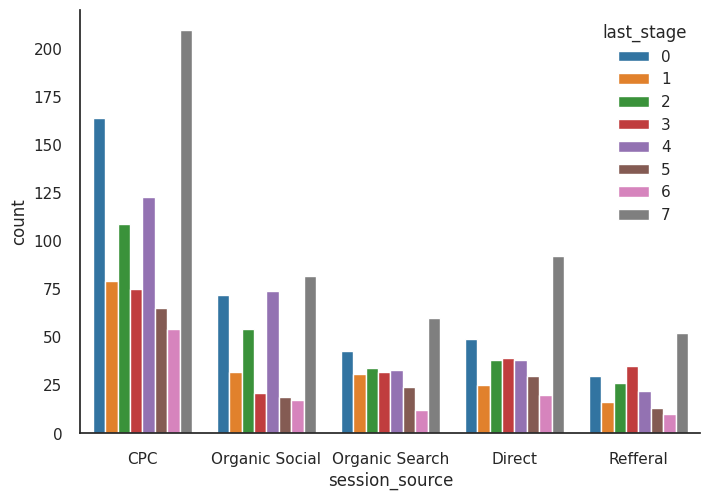

In [ ]:
#last_stage
sns.countplot(x="session_source", hue="last_stage", data=df_gmm_visual_1, palette='tab10')

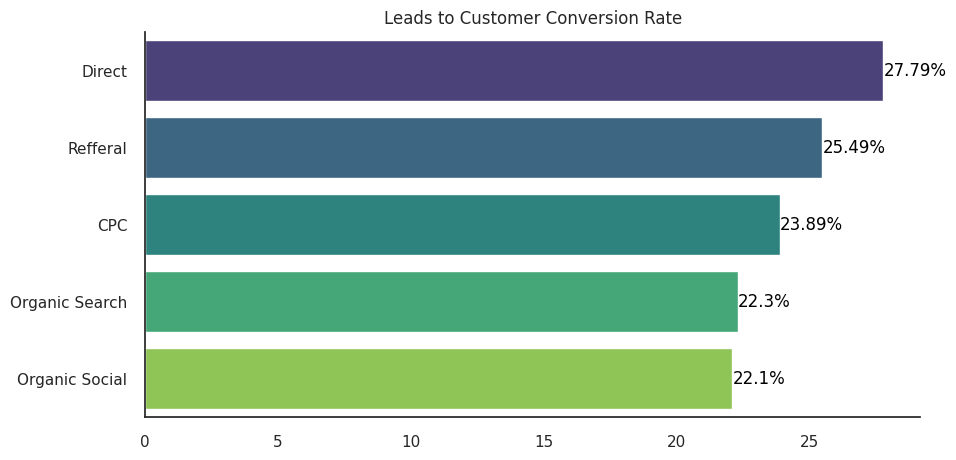

In [ ]:
#leads_to_won ratio
df_won = df_gmm_visual_1.groupby('session_source').agg({'deal_won':'mean'}).round(4)*100
df_won = df_won.sort_values(by='deal_won', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(x="deal_won", y=df_won.index, data=df_won, palette='viridis', orient='h', order = df_won.index, ax=ax)
plt.ylabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.xlabel('')
plt.title('Leads to Customer Conversion Rate')
plt.show()

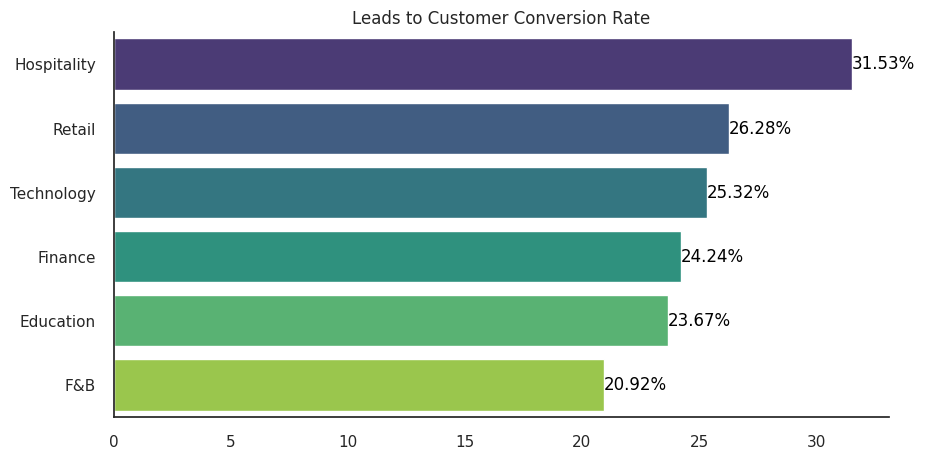

In [ ]:
#leads_to_won ratio
df_won = df_gmm_visual_1.groupby('industry').agg({'deal_won':'mean'}).round(4)*100
df_won = df_won.sort_values(by='deal_won', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))
plot = sns.barplot(x="deal_won", y=df_won.index, data=df_won, palette='viridis', orient='h', order = df_won.index, ax=ax)
plt.ylabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.xlabel('')
plt.title('Leads to Customer Conversion Rate')
plt.show()

<Axes: xlabel='industry', ylabel='count'>

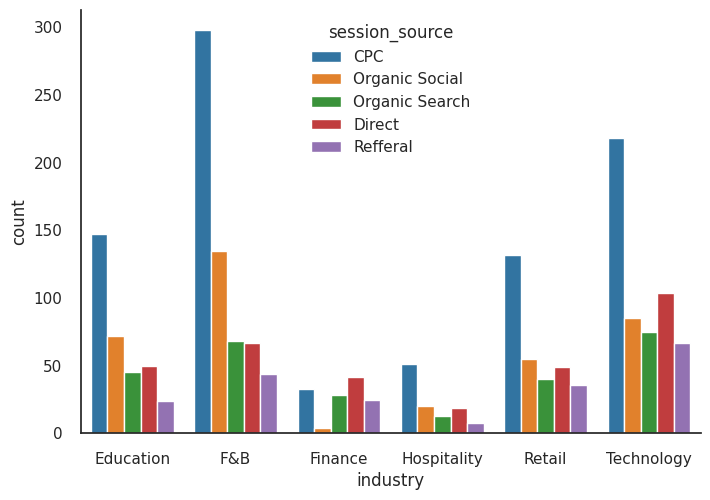

In [ ]:
sns.countplot(x="industry", hue="session_source", data=df_gmm_visual_1, palette='tab10')

<Axes: xlabel='session_source', ylabel='count'>

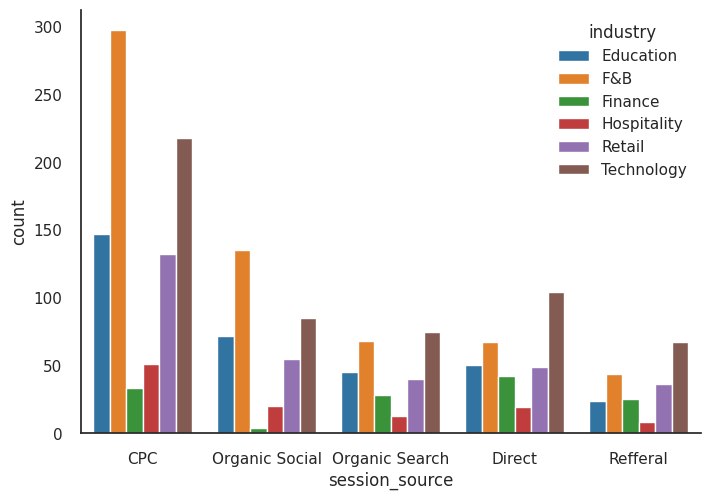

In [ ]:
sns.countplot(x="session_source", hue="industry", data=df_gmm_visual_1, palette='tab10')

<Axes: xlabel='number_of_employee', ylabel='session_source'>

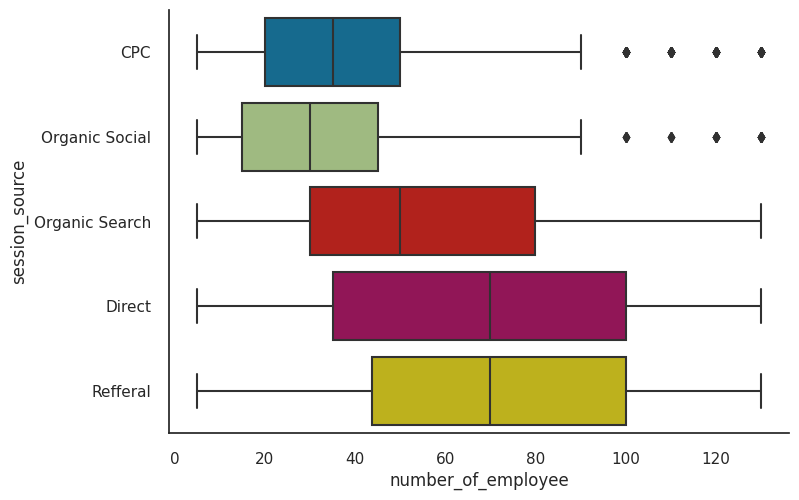

In [ ]:
#number_of_employee
sns.boxplot(data=df_gmm_visual_1, orient='h', y='session_source', x='number_of_employee')

In [ ]:
df_pagevisit

,visit_home,visit_features,visit_casestudy,visit_portofolio,visit_testi
cluster,,,,,
1,817,1141,864,905,927


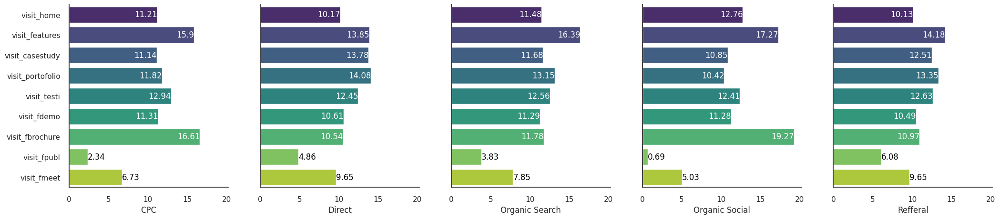

In [ ]:
#page visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo',
        'visit_fbrochure', 'visit_fpubl', 'visit_fmeet']
df_pagevisit = df_gmm_visual_1.groupby('session_source')[page].agg('sum')

for i in df_pagevisit.index:
  df_pagevisit.loc[i] = df_pagevisit.loc[i]/df_pagevisit.loc[i].sum()*100

df_pagevisit = df_pagevisit.T

fig, ax = plt.subplots(nrows=1, ncols=len(df_pagevisit.columns), figsize=(5*len(df_pagevisit.columns),5), sharey=True, sharex=True)

for idx,j in enumerate(df_pagevisit.columns):
  sns.barplot(df_pagevisit, y=df_pagevisit.index, x=j, orient='h', palette='viridis', ax=ax[idx])
  ax[idx].set_xlabel(f"{j}")

  for i,v in enumerate(df_pagevisit[j]):
    if v < 10:
      ax[idx].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
    else:
      ax[idx].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='right', verticalalignment='center', color='white')

plt.show()

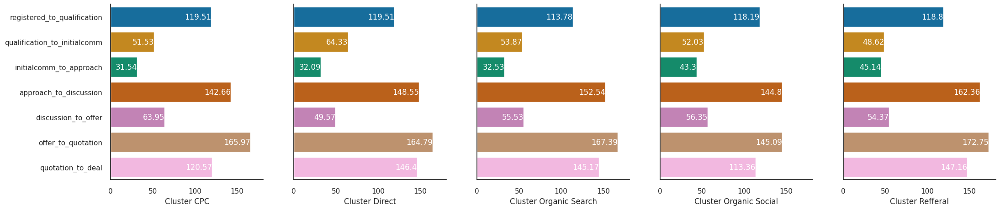

In [ ]:
#duration on each stage
df_duration_visual = df_gmm_visual_1.groupby('session_source')[duration_col].median().T

fig, ax = plt.subplots(nrows=1, ncols=len(df_duration_visual.columns), figsize=(5*len(df_duration_visual.columns),5), sharey=True, sharex=True)

for idx,j in enumerate(df_duration_visual.columns):
  sns.barplot(df_duration_visual, y=df_duration_visual.index, x=j, orient='h', palette='colorblind', ax=ax[idx])
  ax[idx].set_xlabel(f"Cluster {j}")

  for i,v in enumerate(df_duration_visual[j]):
    ax[idx].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='right', verticalalignment='center', color='white')

plt.show()

#####Survey Score

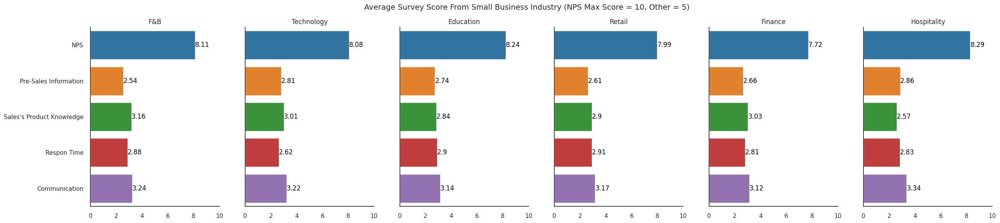

In [ ]:
#Survey Result from Customer in Small Business Cluster per Industry
df_survey_cluster0 = df2.merge(df_gmm_visual_min140.query("cluster == 1"), how='inner', on='leads_id')\
 [['industry','NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(30,6), nrows=1, ncols=6, sharey=True)

for idx, val in enumerate(['F&B', 'Technology', 'Education', 'Retail', 'Finance', 'Hospitality']):
  temp = df_survey_cluster0[df_survey_cluster0['industry']==val]
  plot = sns.barplot(temp, orient='h', estimator='mean', errorbar=None, ax=ax[idx], palette='tab10')
  for i,v in enumerate(plot.patches):
    v = v.get_width()
    y = ax[idx].get_yticks()[i]
    ax[idx].text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
  ax[idx].set_title(f'{val}', fontsize=12)
  ax[idx].set_xlim(xmin=0, xmax=10)
  ax[idx].set_xlabel('')
  ax[idx].grid(False)
fig.suptitle('Average Survey Score From Small Business Industry (NPS Max Score = 10, Other = 5)', fontsize=14)
plt.show()

fig.savefig('Avg Survey Small Business per Industry.png', format='png', bbox_inches='tight', dpi=200)

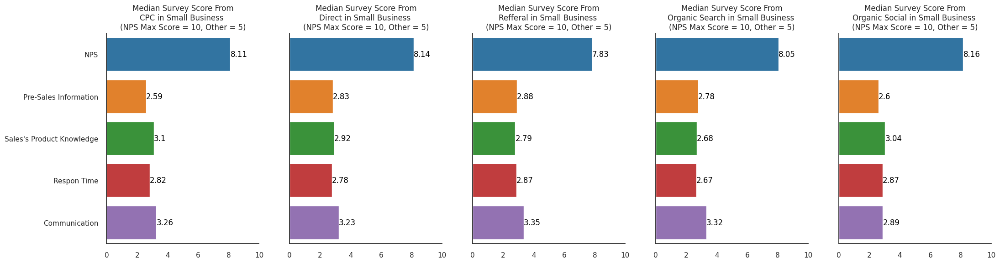

In [ ]:
#Survey Result from Customer in Small Business Cluster per Session Source
df_survey_cluster0 = df2.merge(df_gmm_visual_min140.query("cluster == 1"), how='inner', on='leads_id')\
 [['session_source','NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(25,6), nrows=1, ncols=5, sharey=True)

for idx, val in enumerate(['CPC', 'Direct', 'Refferal', 'Organic Search', 'Organic Social']):
  temp = df_survey_cluster0[df_survey_cluster0['session_source']==val]
  plot = sns.barplot(temp, orient='h', estimator='mean', errorbar=None, ax=ax[idx], palette='tab10')
  for i,v in enumerate(plot.patches):
    v = v.get_width()
    y = ax[idx].get_yticks()[i]
    ax[idx].text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
  ax[idx].set_title(f'Median Survey Score From\n{val} in Small Business \n(NPS Max Score = 10, Other = 5)', fontsize=12)
  ax[idx].set_xlim(xmin=0, xmax=10)
  ax[idx].set_xlabel('')
  ax[idx].grid(False)
plt.show()

In [ ]:
#clustering
df_survey_cluster1 = df2.merge(df_gmm_visual_min140.query("cluster == 1"), how='inner', on='leads_id')

X = df_survey_cluster1[['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']].copy()

##scale data
ss = StandardScaler()
mm = MinMaxScaler()

X[['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']] = mm.fit_transform(X[['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']])

In [ ]:
#GMM

##Choose Number of Cluster, using GMM BIC score

def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)

param_grid = {
    "n_components": range(2, 7),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(random_state=10), param_grid=param_grid, scoring=gmm_bic_score
)
grid_search.fit(X)

df_bic = pd.DataFrame(grid_search.cv_results_)[
         ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df_bic["mean_test_score"] = -df_bic["mean_test_score"]
df_bic = df_bic.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)
df_bic.sort_values(by="BIC score").head()

,Number of components,Type of covariance,BIC score
0,2,spherical,241.223119
1,3,spherical,274.532889
10,2,diag,277.110334
5,2,tied,302.676284
2,4,spherical,310.910172


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For k=2, the average silhouette score is 0.15779979886428647
For k=3, the average silhouette score is 0.14980761530137235


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For k=4, the average silhouette score is 0.15799685208712277
For k=5, the average silhouette score is 0.16167557800151433


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For k=6, the average silhouette score is 0.1651549368322609
For k=7, the average silhouette score is 0.1631089084302151


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For k=8, the average silhouette score is 0.16430118172031183
For k=9, the average silhouette score is 0.17376296617404005


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For k=10, the average silhouette score is 0.1672454836476289


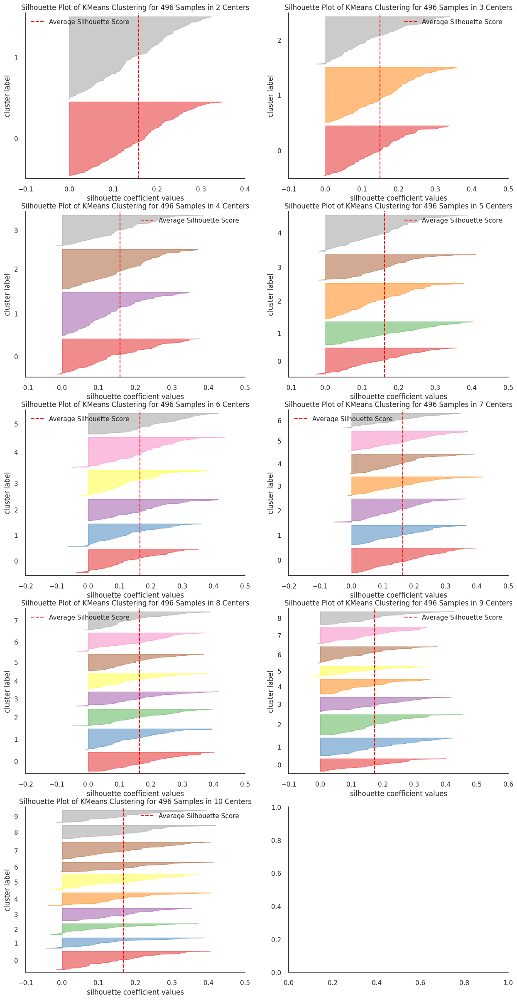

In [ ]:
# Silhouette score plot Kmeans
K = range(2,11)
max_K = max(K)
fig, ax = plt.subplots(int(np.ceil(max_K/2)), 2, figsize = (15,30))

for n_clusters in K:
  kmeansModel = KMeans(n_clusters=n_clusters, init='k-means++', random_state=10)

  q, mod = divmod(n_clusters,2)
  sil = SilhouetteVisualizer(kmeansModel, is_fitted = False, ax = ax[q-1][mod])
  sil.fit(X)
  sil.finalize()
  print(f"For k={n_clusters}, the average silhouette score is {sil.silhouette_score_}")

#####Survey Cluster Result

What's OK:

Kmeans 5 ss



In [ ]:
gaussianModel = GaussianMixture(n_components=2, covariance_type='diag', random_state=10)
df_survey_cluster1['cluster'] = gaussianModel.fit_predict(X)

df_gmm1_describe_count = df_survey_cluster1.groupby('cluster', as_index=False)['cluster'].agg('count').rename(columns={'cluster':'total_customer'})
df_gmm1_describe_count

,total_customer
0,258
1,238


In [ ]:
# kmeansModel = KMeans(n_clusters=3, init='k-means++', random_state=10)
# kmeansModel.fit_predict(X)

# df_survey_cluster1['cluster'] = kmeansModel.labels_

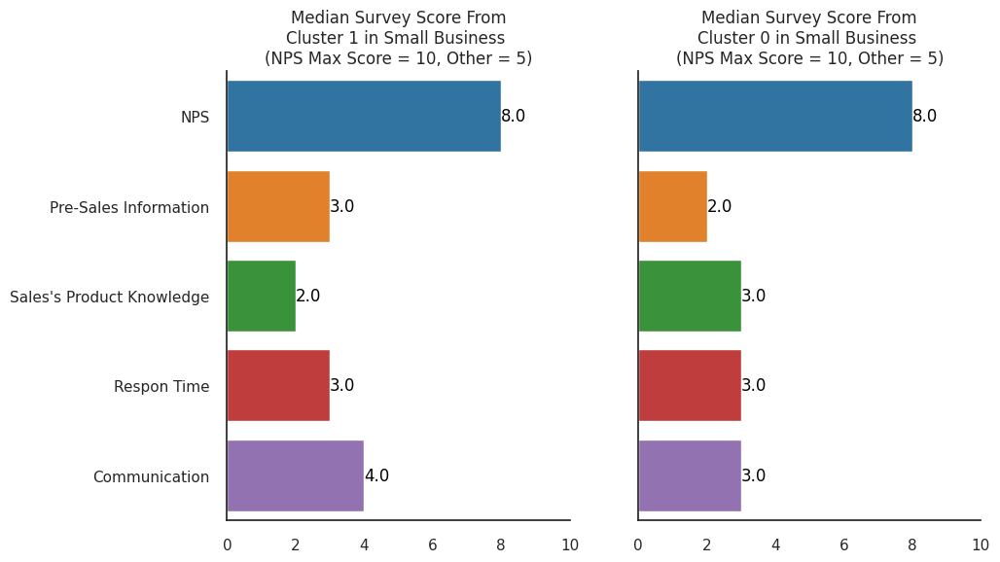

In [ ]:
#Survey Result from Customer in Sub-Cluster in Small Business
df_survey_subcluster = df_survey_cluster1[['cluster','NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5*df_survey_cluster1['cluster'].nunique(),6), nrows=1, ncols=df_survey_cluster1['cluster'].nunique(), sharey=True)

for idx, val in enumerate(df_survey_cluster1['cluster'].unique()):
  temp = df_survey_subcluster[df_survey_subcluster['cluster']==val].drop(columns='cluster')
  plot = sns.barplot(temp, orient='h', estimator='median', errorbar=None, ax=ax[idx], palette='tab10')
  for i,v in enumerate(plot.patches):
    v = v.get_width()
    y = ax[idx].get_yticks()[i]
    ax[idx].text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
  ax[idx].set_title(f'Median Survey Score From\nCluster {val} in Small Business \n(NPS Max Score = 10, Other = 5)', fontsize=12)
  ax[idx].set_xlim(xmin=0, xmax=10)
  ax[idx].set_xlabel('')
  ax[idx].grid(False)
plt.show()

<Axes: xlabel='cluster', ylabel='count'>

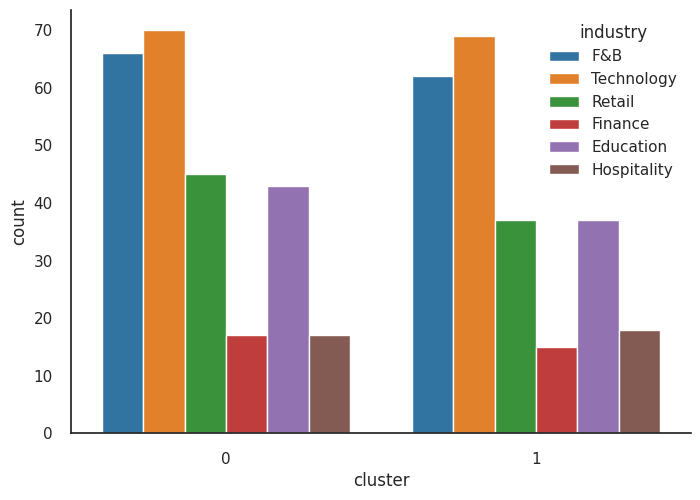

In [ ]:
sns.countplot(x="cluster", hue="industry", data=df_survey_cluster1, palette='tab10')

<Axes: xlabel='cluster', ylabel='count'>

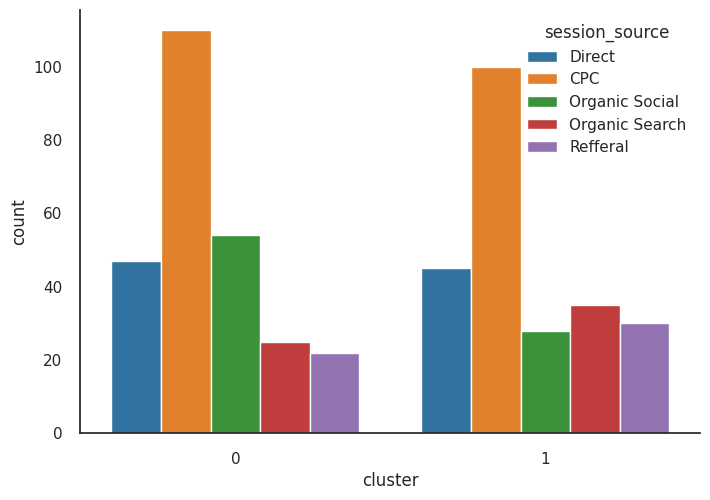

In [ ]:
sns.countplot(x="cluster", hue="session_source", data=df_survey_cluster1, palette='tab10')

<Axes: xlabel='number_of_employee', ylabel='cluster'>

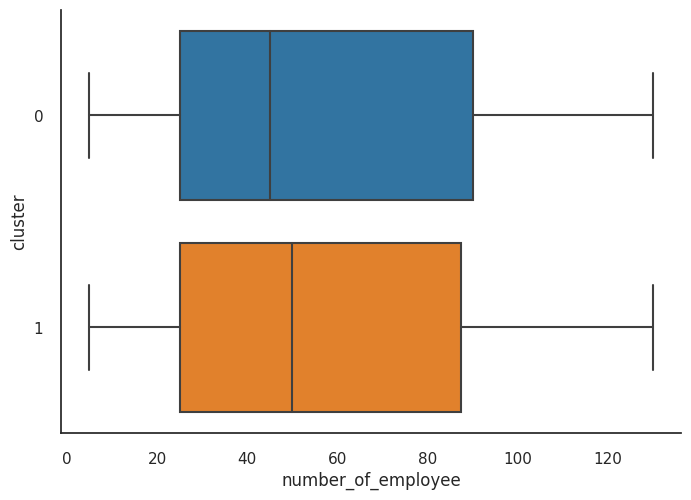

In [ ]:
sns.boxplot(df_survey_cluster1, orient='h', y='cluster', x='number_of_employee', palette='tab10')

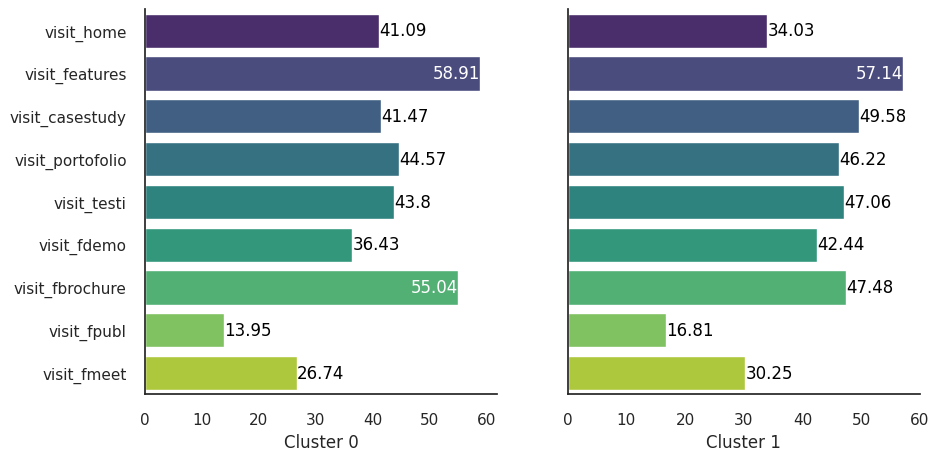

In [ ]:
#page visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi', 'visit_fdemo',
        'visit_fbrochure', 'visit_fpubl', 'visit_fmeet']
df_pagevisit = df_survey_cluster1.groupby('cluster')[page].agg('mean')

for i in df_pagevisit.index:
  df_pagevisit.loc[i] = df_pagevisit.loc[i]*100

df_pagevisit = df_pagevisit.T

fig, ax = plt.subplots(nrows=1, ncols=len(df_pagevisit.columns), figsize=(5*len(df_pagevisit.columns),5), sharey=True)

for j in df_pagevisit.columns:
  sns.barplot(df_pagevisit, y=df_pagevisit.index, x=j, orient='h', palette='viridis', ax=ax[j])
  ax[j].set_xlabel(f"Cluster {j}")

  for i,v in enumerate(df_pagevisit[j]):
    if v < 50:
      ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
    else:
      ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='right', verticalalignment='center', color='white')

plt.show()

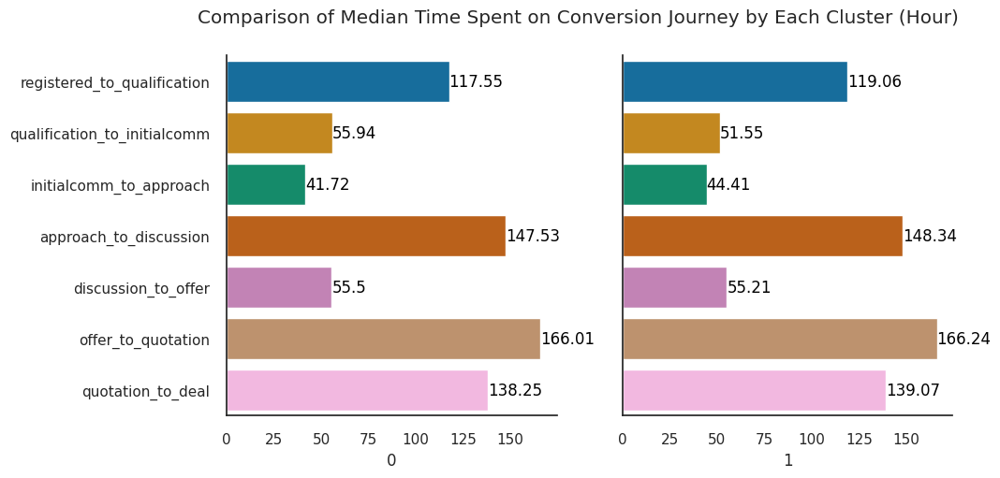

In [ ]:
#duration on each stage
df_duration_visual = df_survey_cluster1.groupby('cluster')[duration_col].median().T

fig, ax = plt.subplots(nrows=1, ncols=len(df_duration_visual.columns), figsize=(5*len(df_duration_visual.columns),5), sharey=True, sharex=True)

for j in df_duration_visual.columns:
  sns.barplot(df_duration_visual, y=df_duration_visual.index, x=j, orient='h', palette='colorblind', ax=ax[j])
  # ax[j].set_xlabel(f"Cluster {j}")
  # if j == 0:
  #   title = 'Big Enterprise'
  # else:
  #   title = 'Business'
  # ax[j].set_xlabel(f"Cluster {title}")

  for i,v in enumerate(df_duration_visual[j]):
    ax[j].text(v, i, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

fig.suptitle('Comparison of Median Time Spent on Conversion Journey by Each Cluster (Hour)')
plt.show()

fig.savefig('X.png', format='png', bbox_inches='tight', dpi=200)

In [ ]:
#What kind of subscription is chosen by customer
df_gmm_contract0 = df_survey_cluster1.merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby(['subscription_type','cluster']).size().to_frame()\
                                      #  .rename(columns={0:'col'}).sort_values(by='col', ascending=False)
df_gmm_contract0
# fig, ax = plt.subplots(figsize=(10,3), nrows=1, ncols=3*df_survey_cluster1.nunique())

# for idx, val in enumerate(df_gmm_contract0.unique()):
#   temp = df_survey_cluster1[df_survey_cluster1['cluster'] = ]
#   plot = sns.barplot(data=temp, y=df_gmm_contract0.index, x='col',
#                     orient='h', palette='tab10', ax=ax)

#   plt.title('Subscription Type Chosen by Customer in Cluster 0')
#   for i,v in enumerate(plot.patches):
#     v = v.get_width()
#     y = ax.get_yticks()[i]
#     if i < 3:
#       ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
#   plt.ylabel('')
#   plt.xlabel('')
# plt.show()

0
subscription_type cluster     
Business          0        172
                  1        157
Enterprise        0          1
                  1          1
Startup           0         85
                  1         80

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual_min1401 = df_survey_cluster1.copy().query("cluster == 0")
df_gmm_visual_min1401['second_page'] = df_gmm_visual_min1401['second_page'].fillna(9)
df_gmm_visual_min1401['third_page'] = np.where(
    (df_gmm_visual_min1401['second_page']==9)&(df_gmm_visual_min1401['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['second_page'].isin(range(9)))&(df_gmm_visual_min1401['third_page'].isna()),
         9,df_gmm_visual_min1401['third_page']
    ))
df_gmm_visual_min1401['fourth_page'] = np.where(
    (df_gmm_visual_min1401['third_page']==9)&(df_gmm_visual_min1401['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['third_page'].isin(range(9)))&(df_gmm_visual_min1401['fourth_page'].isna()),
         9,df_gmm_visual_min1401['fourth_page']
    ))
df_gmm_visual_min1401['fifth_page'] = np.where(
    (df_gmm_visual_min1401['fourth_page']==9)&(df_gmm_visual_min1401['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['fourth_page'].isin(range(9)))&(df_gmm_visual_min1401['fifth_page'].isna()),
         9,df_gmm_visual_min1401['fifth_page']
    ))
df_gmm_visual_min1401['sixth_page'] = np.where(
    (df_gmm_visual_min1401['fifth_page']==9)&(df_gmm_visual_min1401['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['fifth_page'].isin(range(9)))&(df_gmm_visual_min1401['sixth_page'].isna()),
         9,df_gmm_visual_min1401['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual_min1401.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual_min1401.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual_min1401.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual_min1401.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual_min1401.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'green',
               'green', 'green', 'orange',
               'orange', 'orange', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Y", font_size=14)
fig.show()

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual_min1401 = df_survey_cluster1.copy().query("cluster == 1")
df_gmm_visual_min1401['second_page'] = df_gmm_visual_min1401['second_page'].fillna(9)
df_gmm_visual_min1401['third_page'] = np.where(
    (df_gmm_visual_min1401['second_page']==9)&(df_gmm_visual_min1401['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['second_page'].isin(range(9)))&(df_gmm_visual_min1401['third_page'].isna()),
         9,df_gmm_visual_min1401['third_page']
    ))
df_gmm_visual_min1401['fourth_page'] = np.where(
    (df_gmm_visual_min1401['third_page']==9)&(df_gmm_visual_min1401['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['third_page'].isin(range(9)))&(df_gmm_visual_min1401['fourth_page'].isna()),
         9,df_gmm_visual_min1401['fourth_page']
    ))
df_gmm_visual_min1401['fifth_page'] = np.where(
    (df_gmm_visual_min1401['fourth_page']==9)&(df_gmm_visual_min1401['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['fourth_page'].isin(range(9)))&(df_gmm_visual_min1401['fifth_page'].isna()),
         9,df_gmm_visual_min1401['fifth_page']
    ))
df_gmm_visual_min1401['sixth_page'] = np.where(
    (df_gmm_visual_min1401['fifth_page']==9)&(df_gmm_visual_min1401['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual_min1401['fifth_page'].isin(range(9)))&(df_gmm_visual_min1401['sixth_page'].isna()),
         9,df_gmm_visual_min1401['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual_min1401.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual_min1401.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual_min1401.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual_min1401.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual_min1401.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'green',
               'green', 'green', 'orange',
               'orange', 'orange', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Z", font_size=14)
fig.show()

#####CPC

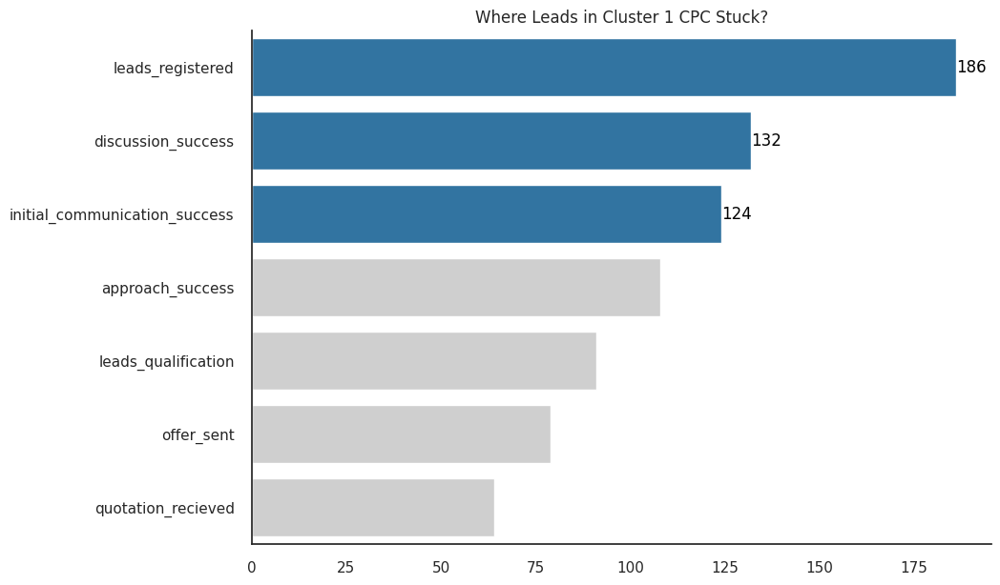

In [ ]:
#Where Cluster 1 CPC mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual.query("cluster == 1 & session_source == 'CPC'")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(10,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Leads in Cluster 1 CPC Stuck?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

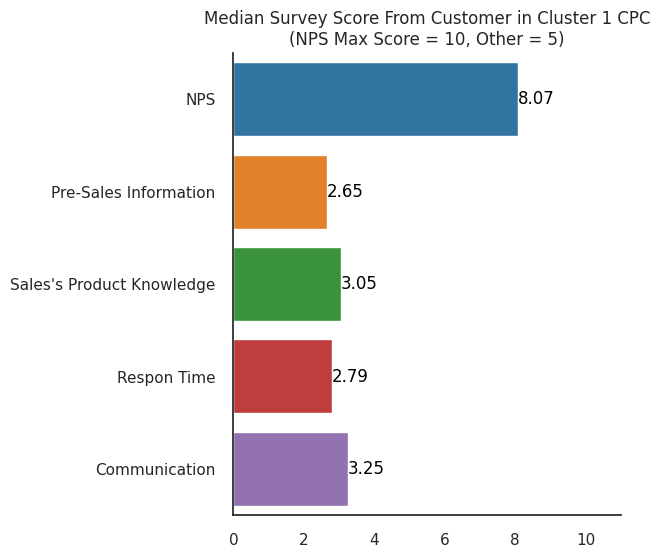

In [ ]:
#Survey Result from Customer in Cluster 1 CPC
df_survey_cluster0 = df2.merge(df_gmm_visual.query("cluster == 1 & session_source == 'CPC'"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='mean', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Median Survey Score From Customer in Cluster 1 CPC\n(NPS Max Score = 10, Other = 5)')
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

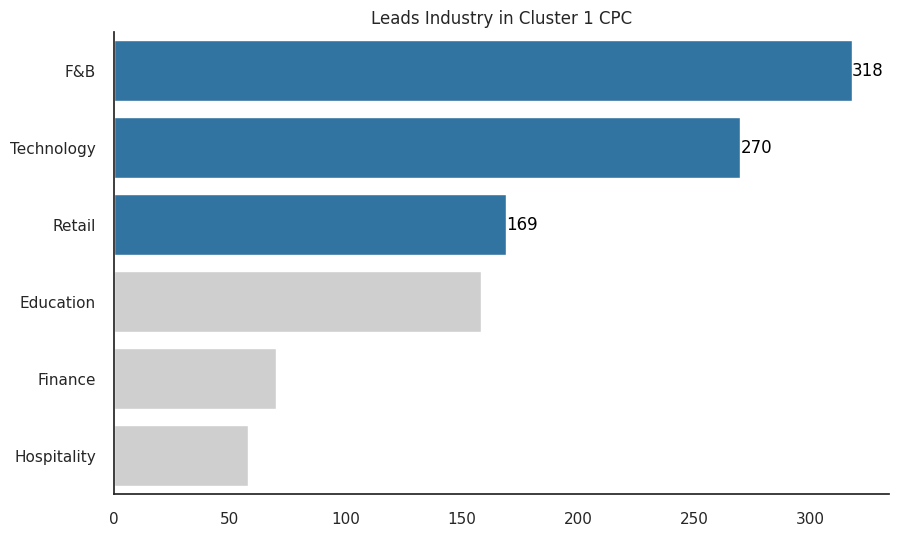

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'CPC'").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1 CPC')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

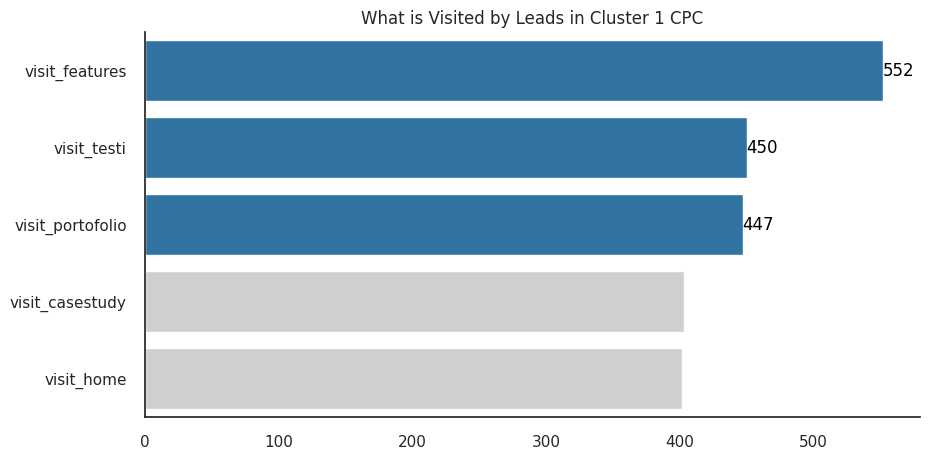

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual.groupby('session_source')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex(['CPC']).T\
                        .rename(columns={'CPC':'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1 CPC')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

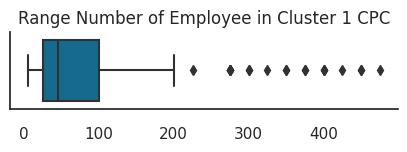

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'CPC'")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1 CPC')
plt.xlabel('')
plt.show()

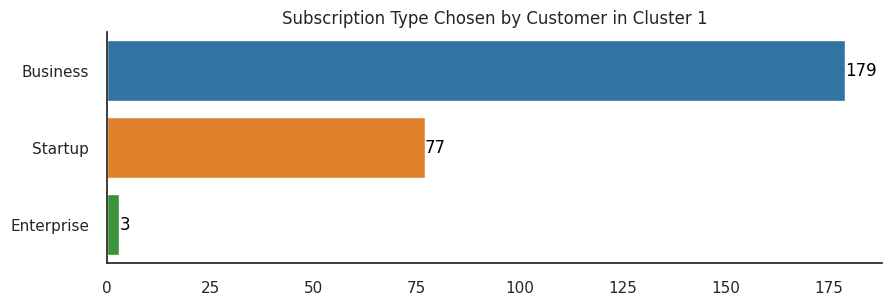

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual.query("cluster==1 & session_source == 'CPC'").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Cluster 1')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

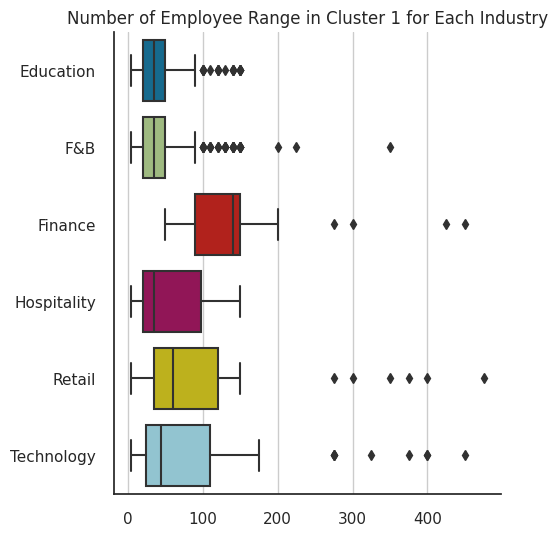

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'CPC'")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual1 = df_gmm_visual.copy().query("cluster == 1 & session_source == 'CPC'")
df_gmm_visual1['second_page'] = df_gmm_visual1['second_page'].fillna(9)
df_gmm_visual1['third_page'] = np.where(
    (df_gmm_visual1['second_page']==9)&(df_gmm_visual1['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['second_page'].isin(range(9)))&(df_gmm_visual1['third_page'].isna()),
         9,df_gmm_visual1['third_page']
    ))
df_gmm_visual1['fourth_page'] = np.where(
    (df_gmm_visual1['third_page']==9)&(df_gmm_visual1['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['third_page'].isin(range(9)))&(df_gmm_visual1['fourth_page'].isna()),
         9,df_gmm_visual1['fourth_page']
    ))
df_gmm_visual1['fifth_page'] = np.where(
    (df_gmm_visual1['fourth_page']==9)&(df_gmm_visual1['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fourth_page'].isin(range(9)))&(df_gmm_visual1['fifth_page'].isna()),
         9,df_gmm_visual1['fifth_page']
    ))
df_gmm_visual1['sixth_page'] = np.where(
    (df_gmm_visual1['fifth_page']==9)&(df_gmm_visual1['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fifth_page'].isin(range(9)))&(df_gmm_visual1['sixth_page'].isna()),
         9,df_gmm_visual1['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual1.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual1.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual1.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual1.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual1.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'orange',
               'blue', 'green', 'orange',
               'blue', 'green', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Leads in Cluster 1 CPC Journey", font_size=14)
fig.show()

<Axes: xlabel='last_stage', ylabel='count'>

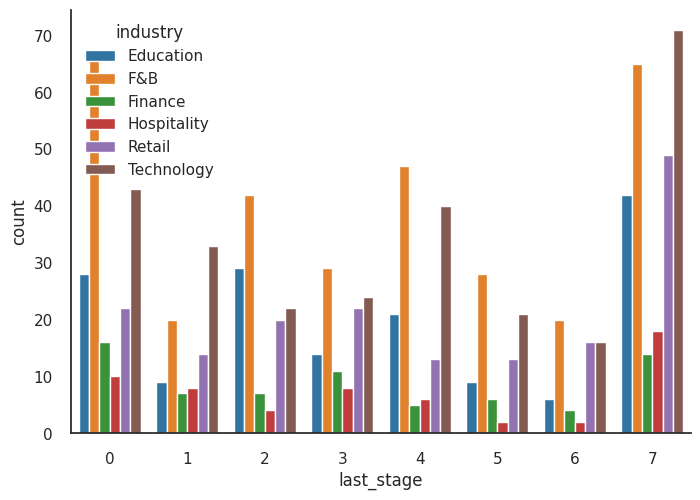

In [ ]:
sns.countplot(x="last_stage", hue="industry", data=df_gmm_visual.query("cluster == 1 & session_source == 'CPC'"), palette='tab10')

#####Direct

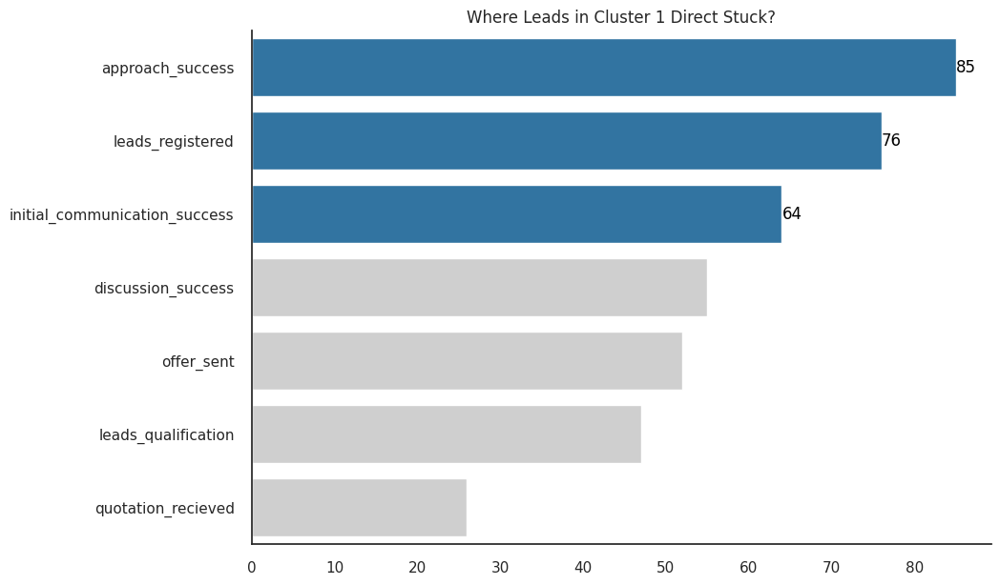

In [ ]:
#Where Cluster 1 Direct mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual.query("cluster == 1 & session_source == 'Direct'")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(10,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Leads in Cluster 1 Direct Stuck?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

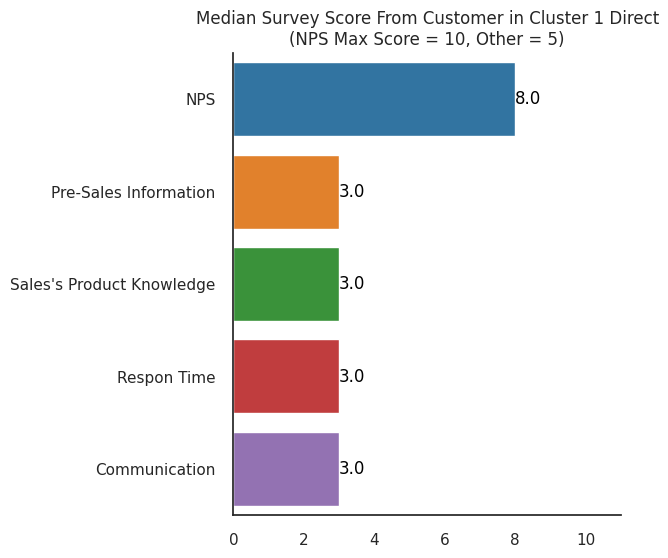

In [ ]:
#Survey Result from Customer in Cluster 1 Direct
df_survey_cluster0 = df2.merge(df_gmm_visual.query("cluster == 1 & session_source == 'Direct'"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='median', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Median Survey Score From Customer in Cluster 1 Direct\n(NPS Max Score = 10, Other = 5)')
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

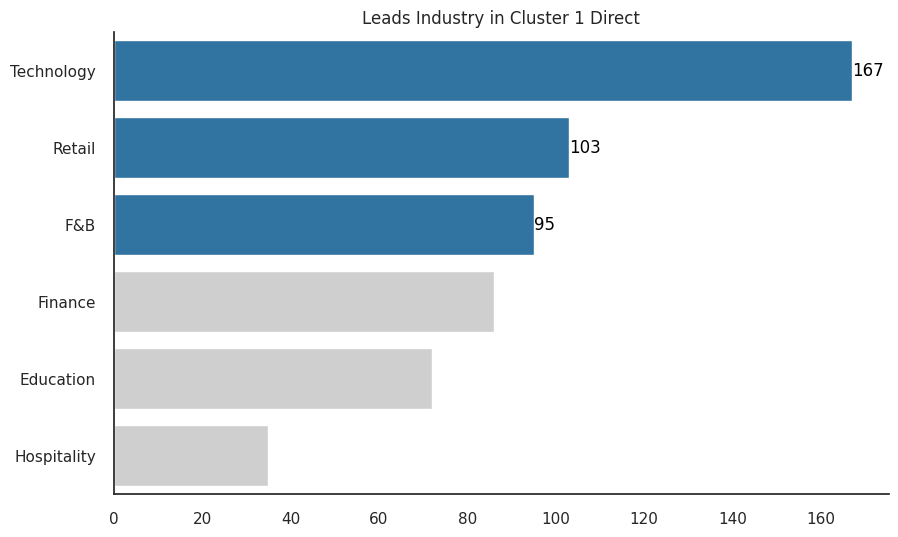

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Direct'").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1 Direct')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

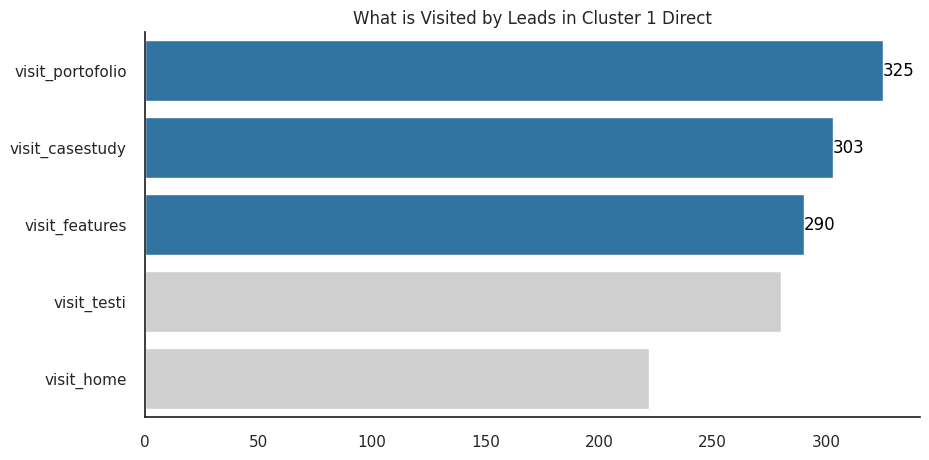

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual.groupby('session_source')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex(['Direct']).T\
                        .rename(columns={'Direct':'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1 Direct')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

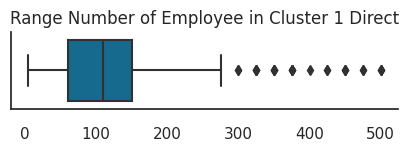

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Direct'")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1 Direct')
plt.xlabel('')
plt.show()

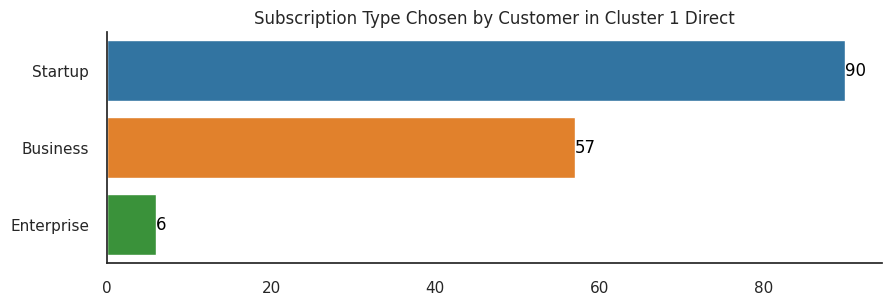

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual.query("cluster==1 & session_source == 'Direct'").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Cluster 1 Direct')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

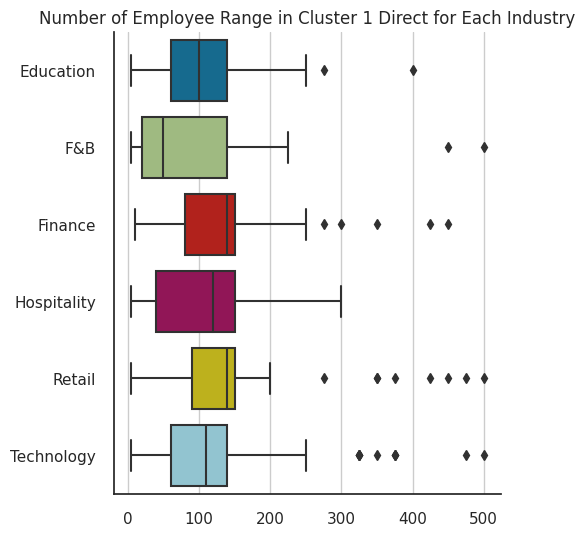

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Direct'")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 Direct for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual1 = df_gmm_visual.copy().query("cluster == 1 & session_source == 'Direct'")
df_gmm_visual1['second_page'] = df_gmm_visual1['second_page'].fillna(9)
df_gmm_visual1['third_page'] = np.where(
    (df_gmm_visual1['second_page']==9)&(df_gmm_visual1['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['second_page'].isin(range(9)))&(df_gmm_visual1['third_page'].isna()),
         9,df_gmm_visual1['third_page']
    ))
df_gmm_visual1['fourth_page'] = np.where(
    (df_gmm_visual1['third_page']==9)&(df_gmm_visual1['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['third_page'].isin(range(9)))&(df_gmm_visual1['fourth_page'].isna()),
         9,df_gmm_visual1['fourth_page']
    ))
df_gmm_visual1['fifth_page'] = np.where(
    (df_gmm_visual1['fourth_page']==9)&(df_gmm_visual1['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fourth_page'].isin(range(9)))&(df_gmm_visual1['fifth_page'].isna()),
         9,df_gmm_visual1['fifth_page']
    ))
df_gmm_visual1['sixth_page'] = np.where(
    (df_gmm_visual1['fifth_page']==9)&(df_gmm_visual1['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fifth_page'].isin(range(9)))&(df_gmm_visual1['sixth_page'].isna()),
         9,df_gmm_visual1['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual1.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual1.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual1.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual1.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual1.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'orange',
               'blue', 'green', 'orange',
               'blue', 'green', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Leads in Cluster 1 Direct Journey", font_size=14)
fig.show()

#####Organic Search

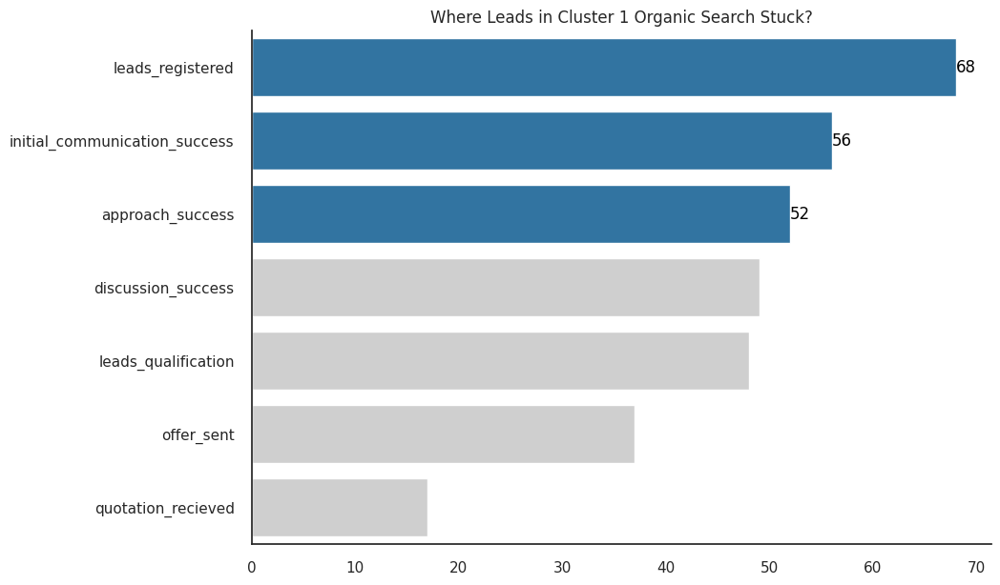

In [ ]:
#Where Cluster 1 Organic Search mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Search'")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(10,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Leads in Cluster 1 Organic Search Stuck?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

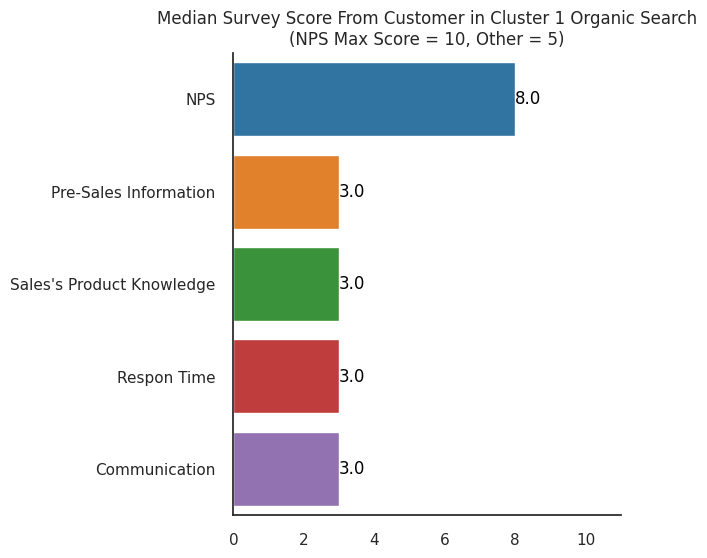

In [ ]:
#Survey Result from Customer in Cluster 1 Organic Search
df_survey_cluster0 = df2.merge(df_gmm_visual.query("cluster == 1 & session_source == 'Organic Search'"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='median', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Median Survey Score From Customer in Cluster 1 Organic Search\n(NPS Max Score = 10, Other = 5)')
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

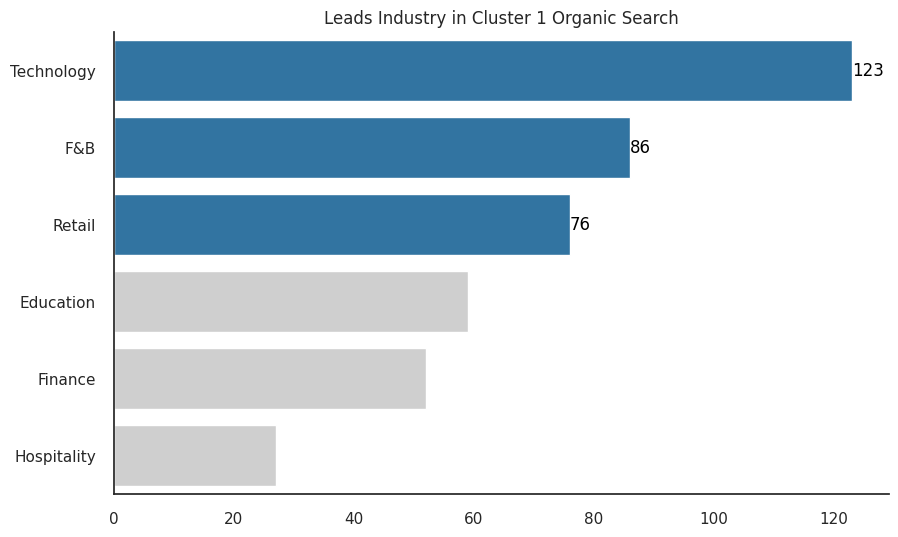

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Search'").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1 Organic Search')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

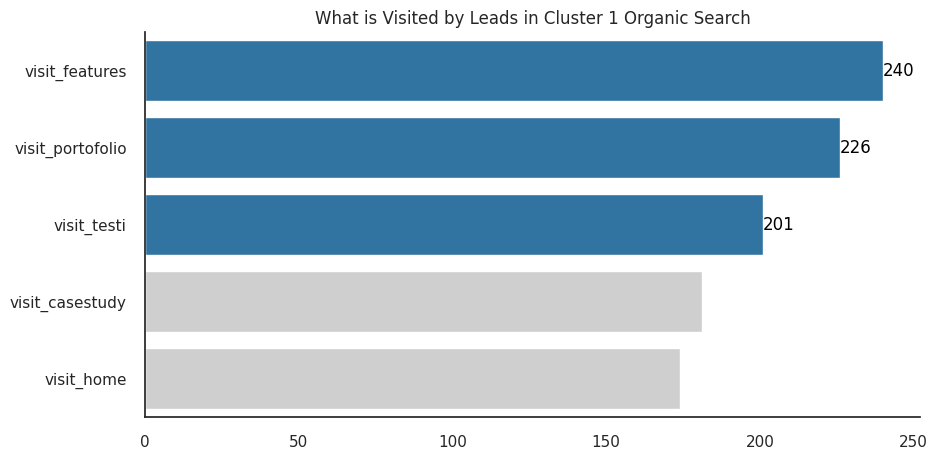

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual.groupby('session_source')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex(['Organic Search']).T\
                        .rename(columns={'Organic Search':'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1 Organic Search')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

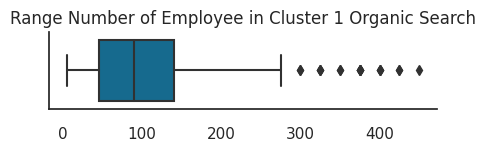

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Search'")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1 Organic Search')
plt.xlabel('')
plt.show()

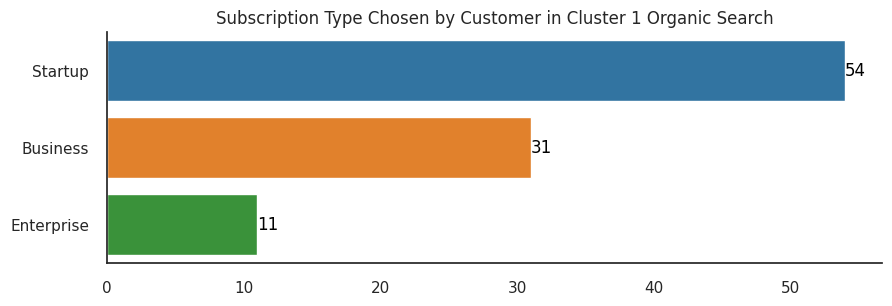

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual.query("cluster==1 & session_source == 'Organic Search'").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Cluster 1 Organic Search')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

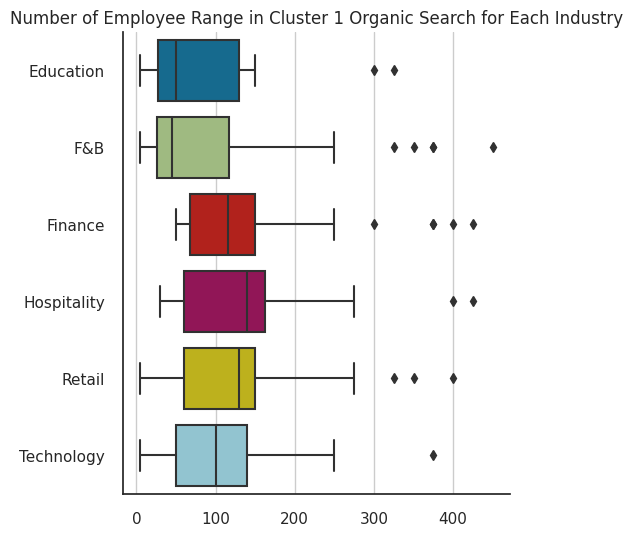

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Search'")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 Organic Search for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual1 = df_gmm_visual.copy().query("cluster == 1 & session_source == 'Organic Search'")
df_gmm_visual1['second_page'] = df_gmm_visual1['second_page'].fillna(9)
df_gmm_visual1['third_page'] = np.where(
    (df_gmm_visual1['second_page']==9)&(df_gmm_visual1['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['second_page'].isin(range(9)))&(df_gmm_visual1['third_page'].isna()),
         9,df_gmm_visual1['third_page']
    ))
df_gmm_visual1['fourth_page'] = np.where(
    (df_gmm_visual1['third_page']==9)&(df_gmm_visual1['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['third_page'].isin(range(9)))&(df_gmm_visual1['fourth_page'].isna()),
         9,df_gmm_visual1['fourth_page']
    ))
df_gmm_visual1['fifth_page'] = np.where(
    (df_gmm_visual1['fourth_page']==9)&(df_gmm_visual1['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fourth_page'].isin(range(9)))&(df_gmm_visual1['fifth_page'].isna()),
         9,df_gmm_visual1['fifth_page']
    ))
df_gmm_visual1['sixth_page'] = np.where(
    (df_gmm_visual1['fifth_page']==9)&(df_gmm_visual1['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fifth_page'].isin(range(9)))&(df_gmm_visual1['sixth_page'].isna()),
         9,df_gmm_visual1['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual1.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual1.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual1.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual1.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual1.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'orange',
               'blue', 'green', 'orange',
               'blue', 'green', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Leads in Cluster 1 Organic Search Journey", font_size=14)
fig.show()

#####Organic Social

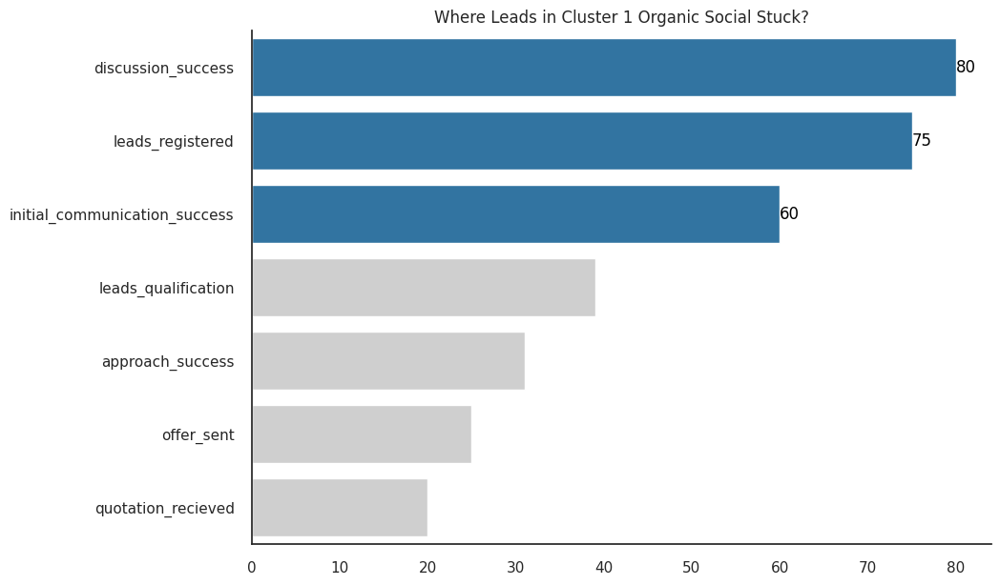

In [ ]:
#Where Cluster 1 Organic Social mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Social'")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(10,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Leads in Cluster 1 Organic Social Stuck?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

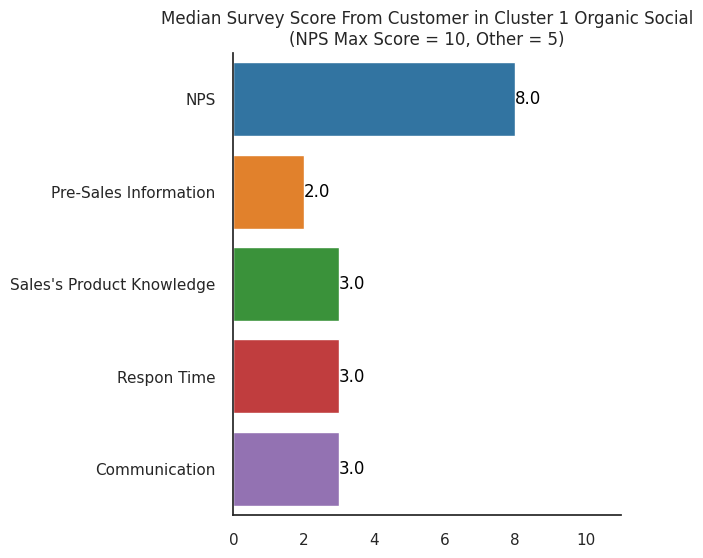

In [ ]:
#Survey Result from Customer in Cluster 1 Organic Social
df_survey_cluster0 = df2.merge(df_gmm_visual.query("cluster == 1 & session_source == 'Organic Social'"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='median', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Median Survey Score From Customer in Cluster 1 Organic Social\n(NPS Max Score = 10, Other = 5)')
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

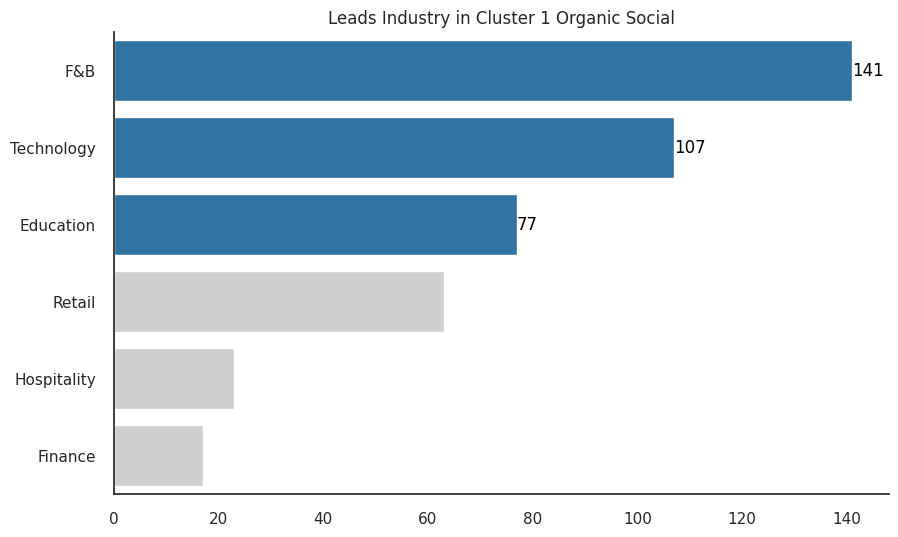

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Social'").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1 Organic Social')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

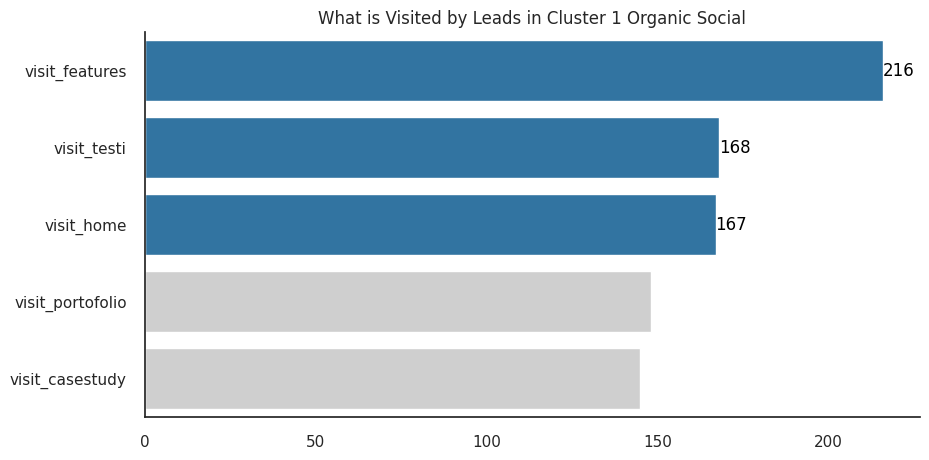

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual.groupby('session_source')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex(['Organic Social']).T\
                        .rename(columns={'Organic Social':'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1 Organic Social')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

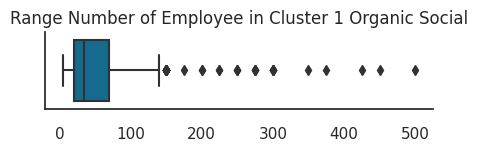

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Social'")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1 Organic Social')
plt.xlabel('')
plt.show()

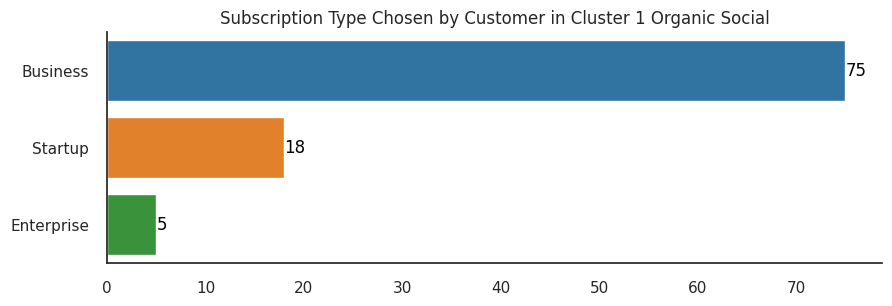

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual.query("cluster==1 & session_source == 'Organic Social'").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Cluster 1 Organic Social')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

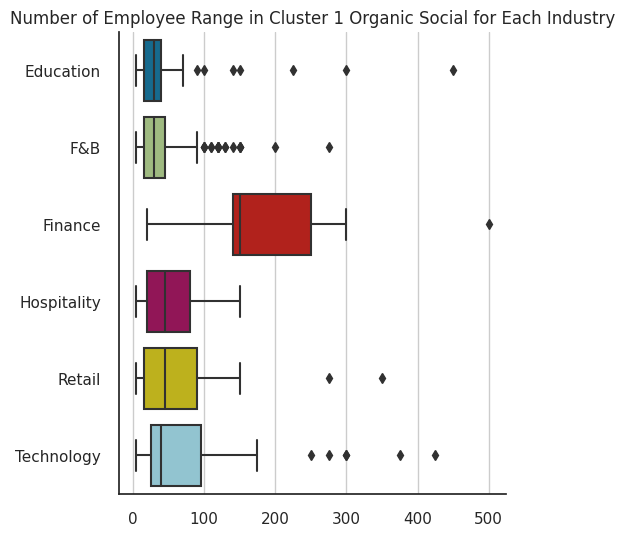

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Organic Social'")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 Organic Social for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual1 = df_gmm_visual.copy().query("cluster == 1 & session_source == 'Organic Social'")
df_gmm_visual1['second_page'] = df_gmm_visual1['second_page'].fillna(9)
df_gmm_visual1['third_page'] = np.where(
    (df_gmm_visual1['second_page']==9)&(df_gmm_visual1['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['second_page'].isin(range(9)))&(df_gmm_visual1['third_page'].isna()),
         9,df_gmm_visual1['third_page']
    ))
df_gmm_visual1['fourth_page'] = np.where(
    (df_gmm_visual1['third_page']==9)&(df_gmm_visual1['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['third_page'].isin(range(9)))&(df_gmm_visual1['fourth_page'].isna()),
         9,df_gmm_visual1['fourth_page']
    ))
df_gmm_visual1['fifth_page'] = np.where(
    (df_gmm_visual1['fourth_page']==9)&(df_gmm_visual1['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fourth_page'].isin(range(9)))&(df_gmm_visual1['fifth_page'].isna()),
         9,df_gmm_visual1['fifth_page']
    ))
df_gmm_visual1['sixth_page'] = np.where(
    (df_gmm_visual1['fifth_page']==9)&(df_gmm_visual1['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fifth_page'].isin(range(9)))&(df_gmm_visual1['sixth_page'].isna()),
         9,df_gmm_visual1['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual1.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual1.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual1.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual1.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual1.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'orange',
               'blue', 'green', 'orange',
               'blue', 'green', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Leads in Cluster 1 Organic Social Journey", font_size=14)
fig.show()

#####Refferal

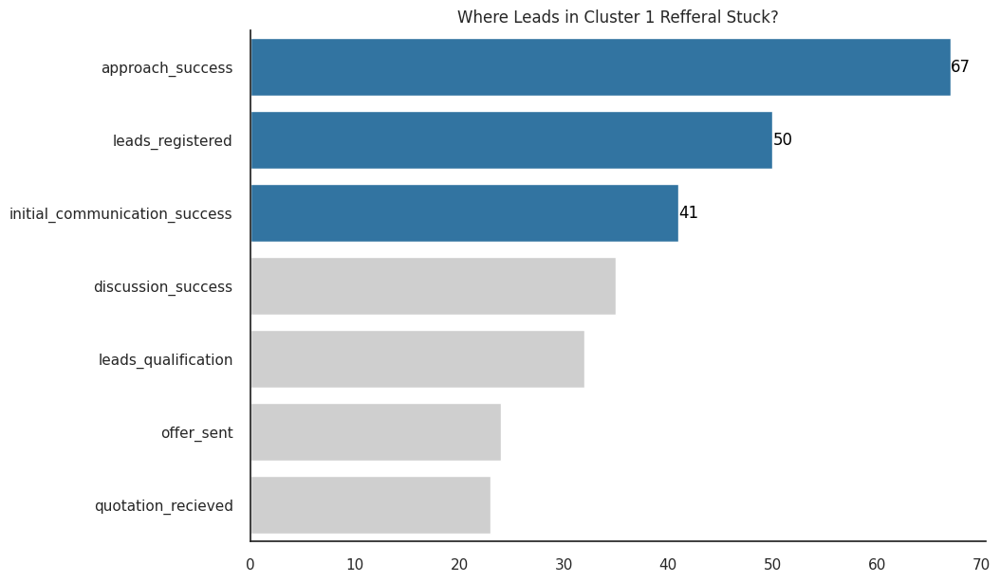

In [ ]:
#Where Cluster 1 Refferal mostly stuck
stage_dict = {}
for i,v in enumerate(df_stage.sort_values(by='stage_id').stage.unique()):
  stage_dict[i] = v

df_gmm_cluster1_stagecount = df_gmm_visual.query("cluster == 1 & session_source == 'Refferal'")['last_stage'].value_counts().to_frame().drop(index=7)

label = [stage_dict[x] for x in df_gmm_cluster1_stagecount.index.to_list()]
color = [sns.color_palette('tab10')[0] if x in df_gmm_cluster1_stagecount.nlargest(3, 'last_stage')['last_stage'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_gmm_cluster1_stagecount['last_stage']]

fig, ax = plt.subplots(figsize=(10,7))
plot = sns.barplot(x="last_stage", y=df_gmm_cluster1_stagecount.index,
            data=df_gmm_cluster1_stagecount, orient='h',
            order = df_gmm_cluster1_stagecount.index, ax=ax, palette=color)

plt.title('Where Leads in Cluster 1 Refferal Stuck?')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.yticks(ax.get_yticks(), label)
plt.xlabel('')
plt.show()

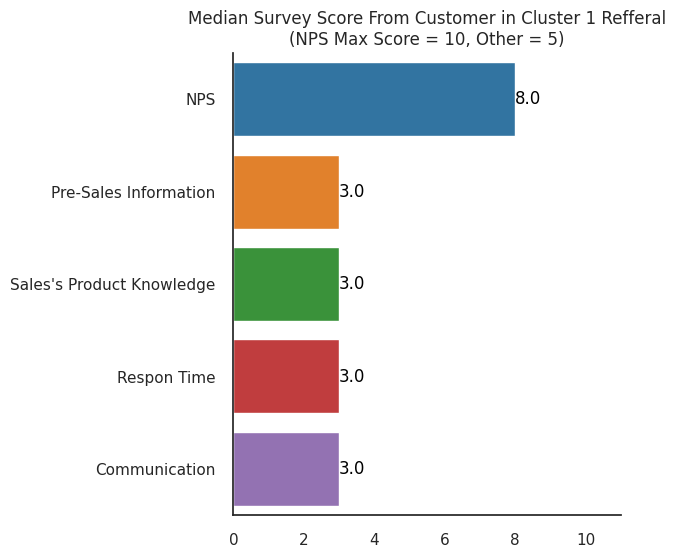

In [ ]:
#Survey Result from Customer in Cluster 1 Refferal
df_survey_cluster0 = df2.merge(df_gmm_visual.query("cluster == 1 & session_source == 'Refferal'"), how='inner', on='leads_id')\
 [['NPS', 'Pre-Sales Information', "Sales's Product Knowledge",'Respon Time', 'Communication']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.barplot(df_survey_cluster0, orient='h', estimator='median', errorbar=None, ax=ax, palette='tab10')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  ax.text(v, y, "{:,}".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')
plt.title('Median Survey Score From Customer in Cluster 1 Refferal\n(NPS Max Score = 10, Other = 5)')
ax.set_xlim(xmin=0, xmax=11)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

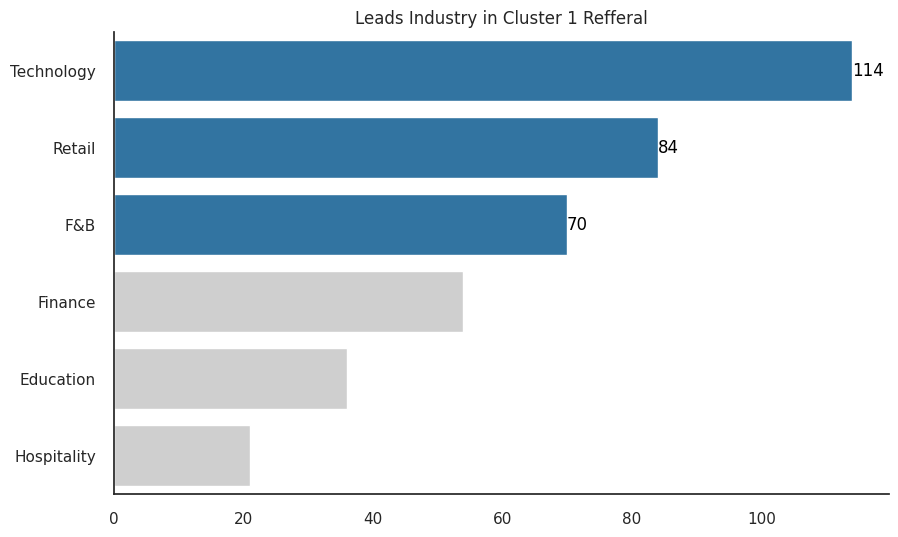

In [ ]:
#Top 3 industry
df_industry_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Refferal'").groupby('industry').size().sort_values(ascending=False).to_frame().rename(columns={0:'col'})

color = [sns.color_palette('tab10')[0] if x in df_industry_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_industry_cluster1['col']]

fig, ax = plt.subplots(figsize=(10,6))
plot = sns.barplot(data=df_industry_cluster1, y=df_industry_cluster1.index, x='col',
                   orient='h', palette=color, ax=ax)

plt.title('Leads Industry in Cluster 1 Refferal')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

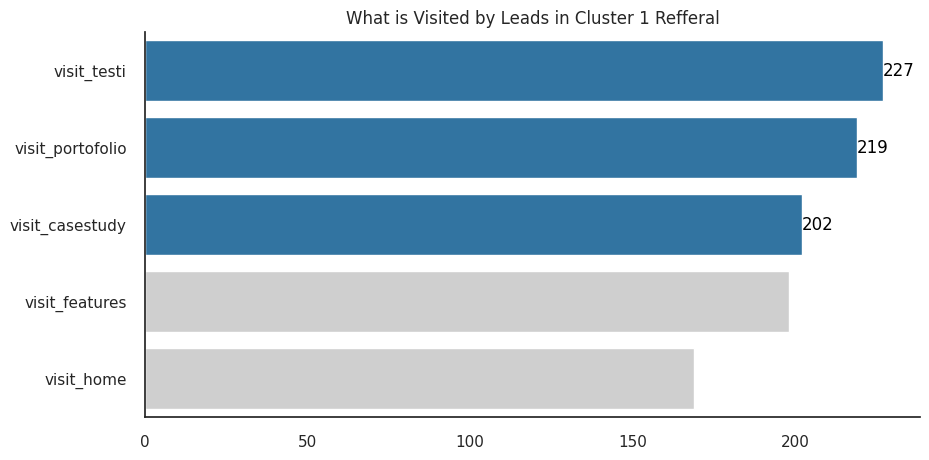

In [ ]:
#Top 3 page_visited
page = ['visit_home', 'visit_features', 'visit_casestudy',
       'visit_portofolio', 'visit_testi']
df_pagevisit = df_gmm_visual.groupby('session_source')[page].agg('sum')

df_pagevisit_cluster1 = df_pagevisit.reindex(['Refferal']).T\
                        .rename(columns={'Refferal':'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,5))

color = [sns.color_palette('tab10')[0] if x in df_pagevisit_cluster1.nlargest(3, 'col')['col'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_pagevisit_cluster1['col']]

plot = sns.barplot(df_pagevisit_cluster1, y=df_pagevisit_cluster1.index, x='col',
                   orient='h',palette=color, ax=ax, order=df_pagevisit_cluster1.index)
plt.title('What is Visited by Leads in Cluster 1 Refferal')
plt.xlabel('')

for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()

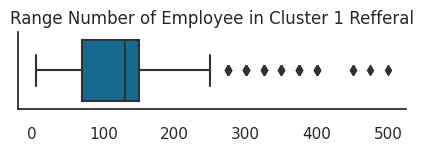

In [ ]:
#Number of employee in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Refferal'")['number_of_employee'].to_frame()

fig, ax = plt.subplots(figsize=(5,1))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', orient='h', ax=ax)
plt.title('Range Number of Employee in Cluster 1 Refferal')
plt.xlabel('')
plt.show()

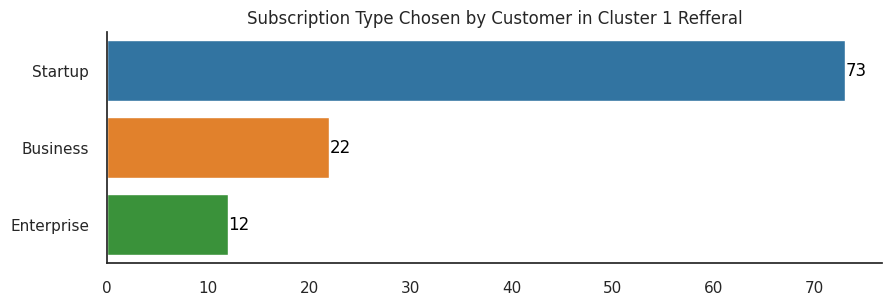

In [ ]:
#What kind of subscription is chosen by customer in cluster 1
df_gmm_contract1 = df_gmm_visual.query("cluster==1 & session_source == 'Refferal'").merge(df_contract.query("reten_flag == 0")[['leads_id', 'subscription_type']],
                                       on='leads_id', how='left').groupby('subscription_type').size().to_frame()\
                                       .rename(columns={0:'col'}).sort_values(by='col', ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
plot = sns.barplot(data=df_gmm_contract1, y=df_gmm_contract1.index, x='col',
                   orient='h', palette='tab10', ax=ax)

plt.title('Subscription Type Chosen by Customer in Cluster 1 Refferal')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax.get_yticks()[i]
  if i < 3:
    ax.text(v, y, "{:,}".format(round(v)), horizontalalignment='left', verticalalignment='center', color='black')
plt.ylabel('')
plt.xlabel('')
plt.show()

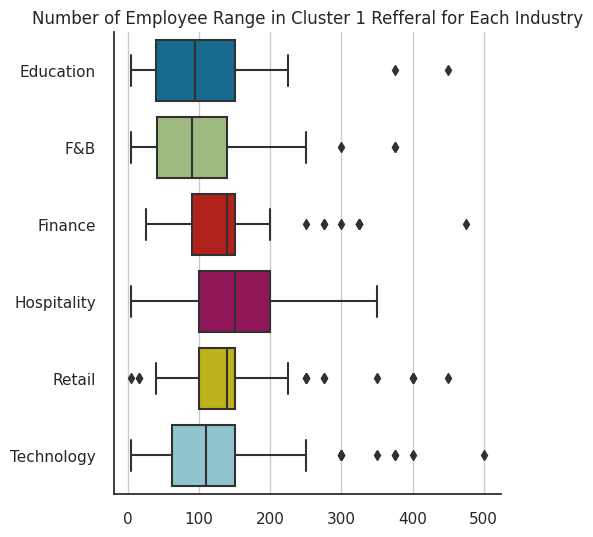

In [ ]:
#Number of employee for each industry in cluster 1
df_emp_cluster1 = df_gmm_visual.query("cluster == 1 & session_source == 'Refferal'")[['industry','number_of_employee']]

fig, ax = plt.subplots(figsize=(5,6))
plot = sns.boxplot(df_emp_cluster1, x='number_of_employee', y='industry', orient='h', ax=ax)
plt.title('Number of Employee Range in Cluster 1 Refferal for Each Industry')
plt.xlabel('')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

In [ ]:
#Leads Journey
page_categories = ['/home', '/features', '/studycase', '/portofolio',
       '/testimonials', '/form/demo', '/form/brochure', '/form/publications',
       '/form/set-a-meeting', 'stop']

journey_list = ['first_page', 'second_page', 'third_page', 'fourth_page', 'fifth_page', 'sixth_page']

df_gmm_visual1 = df_gmm_visual.copy().query("cluster == 1 & session_source == 'Refferal'")
df_gmm_visual1['second_page'] = df_gmm_visual1['second_page'].fillna(9)
df_gmm_visual1['third_page'] = np.where(
    (df_gmm_visual1['second_page']==9)&(df_gmm_visual1['third_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['second_page'].isin(range(9)))&(df_gmm_visual1['third_page'].isna()),
         9,df_gmm_visual1['third_page']
    ))
df_gmm_visual1['fourth_page'] = np.where(
    (df_gmm_visual1['third_page']==9)&(df_gmm_visual1['fourth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['third_page'].isin(range(9)))&(df_gmm_visual1['fourth_page'].isna()),
         9,df_gmm_visual1['fourth_page']
    ))
df_gmm_visual1['fifth_page'] = np.where(
    (df_gmm_visual1['fourth_page']==9)&(df_gmm_visual1['fifth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fourth_page'].isin(range(9)))&(df_gmm_visual1['fifth_page'].isna()),
         9,df_gmm_visual1['fifth_page']
    ))
df_gmm_visual1['sixth_page'] = np.where(
    (df_gmm_visual1['fifth_page']==9)&(df_gmm_visual1['sixth_page'].isna()),
    np.nan, np.where(
        (df_gmm_visual1['fifth_page'].isin(range(9)))&(df_gmm_visual1['sixth_page'].isna()),
         9,df_gmm_visual1['sixth_page']
    ))
new_page_dict = dict(zip(range(10), page_categories))

j1 = df_gmm_visual1.groupby(['first_page', 'second_page'], as_index=False)['leads_id'].count()
j1.columns = ['source', 'target', 'value']
j1['source'] = j1.source.map(new_page_dict)
j1['target'] = j1.target.map(new_page_dict)

j2 = df_gmm_visual1.groupby(['second_page', 'third_page'], as_index=False)['leads_id'].count()
j2.columns = ['source', 'target', 'value']
j2['source'] = j2.source.map(new_page_dict)
j2['target'] = j2.target.map(new_page_dict)

j3 = df_gmm_visual1.groupby(['third_page', 'fourth_page'], as_index=False)['leads_id'].count()
j3.columns = ['source', 'target', 'value']
j3['source'] = j3.source.map(new_page_dict)
j3['target'] = j3.target.map(new_page_dict)

j4 = df_gmm_visual1.groupby(['fourth_page', 'fifth_page'], as_index=False)['leads_id'].count()
j4.columns = ['source', 'target', 'value']
j4['source'] = j4.source.map(new_page_dict)
j4['target'] = j4.target.map(new_page_dict)

j5 = df_gmm_visual1.groupby(['fifth_page', 'sixth_page'], as_index=False)['leads_id'].count()
j5.columns = ['source', 'target', 'value']
j5['source'] = j5.source.map(new_page_dict)
j5['target'] = j5.target.map(new_page_dict)

link_list = [j1, j2, j3, j4, j5]
links = pd.concat(link_list, axis=0)

unique_source_target = list(pd.unique(links[['source', 'target']].values.ravel('K')))
mapping_dict = {k: v for v, k in enumerate(unique_source_target)}

links['source'] = links['source'].map(mapping_dict)
links['target'] = links['target'].map(mapping_dict)
links_dict = links.to_dict(orient='list')

fig = go.Figure(data=[go.Sankey(
      node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 2),
      label = unique_source_target,
      color = ['blue', 'green', 'orange',
               'blue', 'green', 'orange',
               'blue', 'green', 'orange']
    ),
    link = dict(
      source = links_dict["source"],
      target = links_dict["target"],
      value = links_dict["value"]
  ))])

fig.update_layout(title_text="Leads in Cluster 1 Refferal Journey", font_size=14)
fig.show()

#Impact Analysis

##Direct Marketing Cost Increase

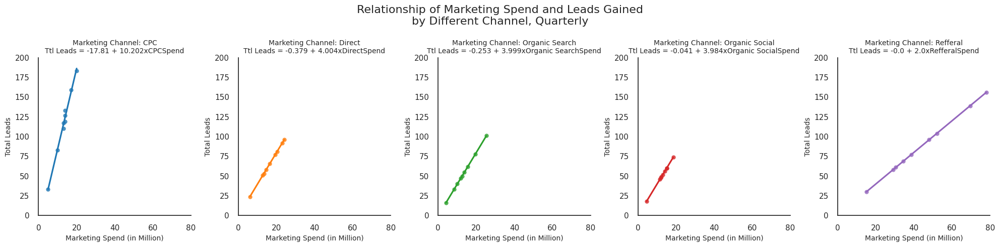

In [ ]:
#Group quarterly
sns.set_theme(style='white', palette=None, rc={"axes.spines.left": True, "axes.spines.right": False, "axes.spines.top": False, "axes.spines.bottom": True})

#Calculate total leads per channel and their respective marketing spend
df_leads_sum = df_eda5.groupby(['leads_reg_month_period','leads_reg_year', 'leads_reg_quarter_period','session_source'],
                                as_index=False)[['leads_id']].count().rename(columns={'leads_id':'total_leads'})
df_leads_sum = df_leads_sum.merge(df_marketing_melt,
                                  left_on=['leads_reg_month_period', 'session_source'],
                                  right_on=['Date', 'session_source'], how='right')\
                                  .drop(columns='leads_reg_month_period')\
                                  .dropna()

df_leads_sum_q = df_leads_sum.groupby(['leads_reg_year', 'leads_reg_quarter_period', 'session_source'], as_index=False)\
                                      [['total_leads', 'marketing_spend']].sum()
df_leads_sum_q['marketing_spend'] = df_leads_sum_q['marketing_spend']/1000000

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(20,5))
ax = ax.flatten()

for i, v in enumerate(df_leads_sum_q['session_source'].unique()):
  temp = df_leads_sum_q[df_leads_sum_q['session_source']==v]
  tab10 = sns.color_palette('tab10')
  if v == 'CPC':
    color = tab10[0]
  elif v == 'Direct':
    color = tab[1]
  elif v == 'Organic Search':
    color = tab[2]
  elif v == 'Organic Social':
    color = tab[3]
  else:
    color = tab[4]
  p = sns.regplot(data=temp, x='marketing_spend', y='total_leads', color=color, ax=ax[i], ci=None)

  #calculate slope and intercept of regression equation
  slope, intercept, r, p, sterr = linregress(x=p.get_lines()[0].get_xdata(),
                                             y=p.get_lines()[0].get_ydata())

  #add regression equation to plot
  ax[i].set_title(f"Marketing Channel: {v}\nTtl Leads = {round(intercept,3)} + {round(slope, 3)}x{v}Spend", fontsize=10)
  ax[i].set_xlabel('Marketing Spend (in Million)', fontsize=10)
  ax[i].set_ylabel('Total Leads', fontsize=10)
  ax[i].set_xlim(xmin=0, xmax=80)
  ax[i].set_ylim(ymin=0, ymax=200)

fig.suptitle("Relationship of Marketing Spend and Leads Gained\nby Different Channel, Quarterly", fontsize=16)

fig.tight_layout()
plt.show()

fig.savefig('compare_spend_leads.png', format='png', bbox_inches='tight', dpi=200)

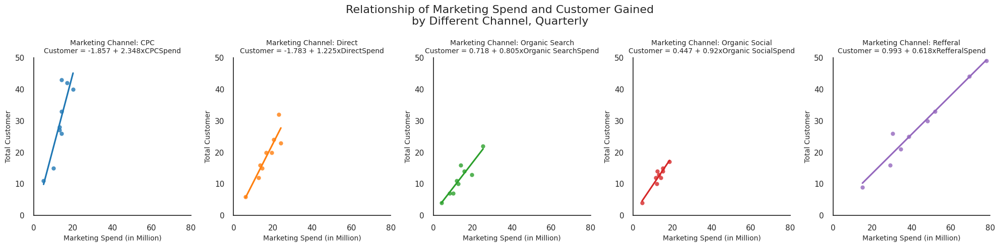

In [ ]:
#Group quarterly
sns.set_theme(style='white', palette=None, rc={"axes.spines.left": True, "axes.spines.right": False, "axes.spines.top": False, "axes.spines.bottom": True})

df_deal_won_sum_q = df_deal_won_sum.groupby(['leads_reg_quarter_period', 'session_source'], as_index=False)[['deal_won_sum', 'marketing_spend']].sum()
df_deal_won_sum_q['marketing_spend'] = df_deal_won_sum_q['marketing_spend']/1000000

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(20,5))
ax = ax.flatten()

for i, v in enumerate(df_deal_won_sum_q['session_source'].unique()):
  temp = df_deal_won_sum_q[df_deal_won_sum_q['session_source']==v]
  tab10 = sns.color_palette('tab10')
  if v == 'CPC':
    color = tab10[0]
  elif v == 'Direct':
    color = tab[1]
  elif v == 'Organic Search':
    color = tab[2]
  elif v == 'Organic Social':
    color = tab[3]
  else:
    color = tab[4]
  p = sns.regplot(data=temp, x='marketing_spend', y='deal_won_sum', color=color, ax=ax[i], ci=None)

  #calculate slope and intercept of regression equation
  slope, intercept, r, p, sterr = linregress(x=p.get_lines()[0].get_xdata(),
                                             y=p.get_lines()[0].get_ydata())

  #add regression equation to plot
  ax[i].set_title(f"Marketing Channel: {v}\nCustomer = {round(intercept,3)} + {round(slope, 3)}x{v}Spend", fontsize=10)
  ax[i].set_xlabel('Marketing Spend (in Million)', fontsize=10)
  ax[i].set_ylabel('Total Customer', fontsize=10)
  ax[i].set_xlim(xmin=0, xmax=80)
  ax[i].set_ylim(ymin=0, ymax=50)

fig.suptitle("Relationship of Marketing Spend and Customer Gained\nby Different Channel, Quarterly", fontsize=16)

fig.tight_layout()
plt.show()

fig.savefig('compare_spend_customer.png', format='png', bbox_inches='tight', dpi=200)

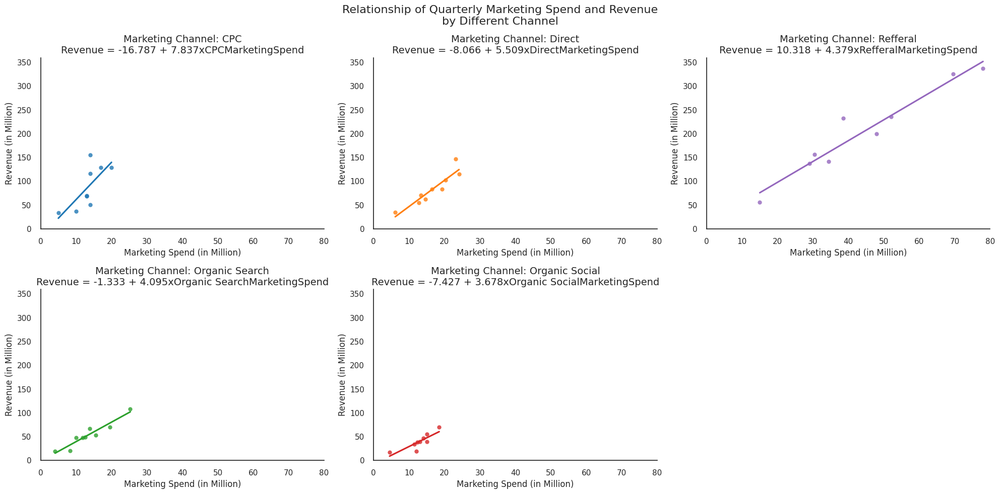

In [ ]:
#Group quarterly and calculate cac
sns.set_theme(style='white', palette=None, rc={"axes.spines.left": True, "axes.spines.right": False, "axes.spines.top": False, "axes.spines.bottom": True})

#Calculate Revenue and group quarterly per marketing channel
df_rev_q = df_contract_disc.groupby('leads_id', as_index=False)[['revenue']].sum()\
                             .merge(df_eda5[['leads_id', 'leads_reg_month_period', 'leads_reg_quarter_period', 'leads_reg_year', 'session_source']])\
                             .groupby(['leads_reg_quarter_period','session_source'], as_index=False)[['revenue']].sum()

df_deal_won_sum_q = df_deal_won_sum.groupby(['leads_reg_quarter_period', 'session_source'], as_index=False)[['deal_won_sum', 'marketing_spend']].sum()
df_rev_deal_q = df_deal_won_sum_q.merge(df_rev_q, on=['leads_reg_quarter_period','session_source'])
df_rev_deal_q['marketing_spend'] = df_rev_deal_q['marketing_spend']/1000000
df_rev_deal_q['revenue'] = df_rev_deal_q['revenue']/1000000

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20,10))
ax = ax.flatten()

for i, v in enumerate(['CPC', 'Direct', 'Refferal', 'Organic Search', 'Organic Social']):
  temp = df_rev_deal_q[df_rev_deal_q['session_source']==v]
  tab10 = sns.color_palette('tab10')
  if v == 'CPC':
    color = tab10[0]
  elif v == 'Direct':
    color = tab[1]
  elif v == 'Organic Search':
    color = tab[2]
  elif v == 'Organic Social':
    color = tab[3]
  else:
    color = tab[4]
  p = sns.regplot(data=temp, x='marketing_spend', y='revenue', color=color, ax=ax[i], ci=None)

  #calculate slope and intercept of regression equation
  slope, intercept, r, p, sterr = linregress(x=p.get_lines()[0].get_xdata(),
                                             y=p.get_lines()[0].get_ydata())

  #add regression equation to plot
  ax[i].set_title(f"Marketing Channel: {v}\nRevenue = {round(intercept,3)} + {round(slope, 3)}x{v}MarketingSpend", fontsize=14)
  ax[i].set_xlabel('Marketing Spend (in Million)', fontsize=12)
  ax[i].set_ylabel('Revenue (in Million)', fontsize=12)
  ax[i].set_xlim(xmin=0, xmax=80)
  ax[i].set_ylim(ymin=0, ymax=360)
ax[5].set_visible(False)
fig.suptitle("Relationship of Quarterly Marketing Spend and Revenue\nby Different Channel", fontsize=16)

fig.tight_layout()
plt.show()

fig.savefig('compare_spend_rev.png', format='png', bbox_inches='tight', dpi=200)

In [ ]:
#Calculate total leads and deal won per channel and their respective marketing spend
df_leads_deal_sum = df_eda5.groupby(['leads_reg_month_period','leads_reg_year', 'leads_reg_quarter_period','session_source'],
                                     as_index=False).agg({'leads_id':'count', 'deal_won':'sum'}).rename(columns={'leads_id':'total_leads'})
df_leads_deal_sum = df_leads_deal_sum.merge(df_marketing_melt,
                                            left_on=['leads_reg_month_period', 'session_source'],
                                            right_on=['Date', 'session_source'], how='right')\
                                     .drop(columns='leads_reg_month_period')\
                                     .dropna()
df_leads_deal_sum = df_leads_deal_sum.groupby(['leads_reg_quarter_period', 'session_source'], as_index=False)\
                                              .agg({'total_leads':'sum', 'deal_won':'sum', 'marketing_spend':'sum'})
df_leads_deal_sum['conversion_rate'] = round(df_leads_deal_sum['deal_won']/df_leads_deal_sum['total_leads'],3)
df_leads_deal_sum['leads_reg_quarter_period'] = df_leads_deal_sum['leads_reg_quarter_period'].astype('str')
df_leads_deal_sum.query("leads_reg_quarter_period == '2022Q2'")

,leads_reg_quarter_period,session_source,total_leads,deal_won,marketing_spend,conversion_rate
30,2022Q2,CPC,159.0,42.0,17000000,0.264
31,2022Q2,Direct,81.0,24.0,20300000,0.296
32,2022Q2,Organic Search,78.0,13.0,19600000,0.167
33,2022Q2,Organic Social,60.0,14.0,15100000,0.233
34,2022Q2,Refferal,139.0,44.0,69500000,0.317


In [ ]:
calc_leads = df_leads_deal_sum.query("leads_reg_quarter_period == '2022Q2'")['total_leads'].sum()
calc_cust = df_leads_deal_sum.query("leads_reg_quarter_period == '2022Q2'")['deal_won'].sum()
calc_cvr = calc_cust/calc_leads
print(calc_leads, calc_cust, calc_cvr)
#0.28 = (137+0,296x) / (517+x)
#144,76 + 0,28x = 137 + 0,296x
#7,76 = 0,016x
#x = 485

517.0 137.0 0.26499032882011603


In [ ]:
temp = df_leads_deal_sum.query("leads_reg_quarter_period == '2022Q2'").copy()
temp.loc[31, 'total_leads'] = 81+485
temp.loc[31, 'deal_won'] = round(temp.loc[31, 'total_leads']*0.296,0)

calc_leads = temp['total_leads'].sum()
calc_cust = temp['deal_won'].sum()
calc_cvr = calc_cust/calc_leads
print(calc_leads, calc_cust, calc_cvr)

1002.0 281.0 0.28043912175648705


##Survey score vs deal_won

In [ ]:
df_gmm_visual.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3397 entries, 0 to 3396
Data columns (total 51 columns):
 #   Column                        Non-Null Count  Dtype        
---  ------                        --------------  -----        
 0   leads_id                      3397 non-null   int64        
 1   number_of_employee            3397 non-null   int64        
 2   leads_reg_year                3397 non-null   int64        
 3   leads_reg_quarter             3397 non-null   int64        
 4   leads_reg_month               3397 non-null   int64        
 5   leads_reg_quarter_period      3397 non-null   period[Q-DEC]
 6   leads_reg_month_period        3397 non-null   period[M]    
 7   discount_month                3397 non-null   int64        
 8   discount_month_b1             3397 non-null   int64        
 9   industry_Education            3397 non-null   uint8        
 10  industry_F&B                  3397 non-null   uint8        
 11  industry_Finance              3397 non-null

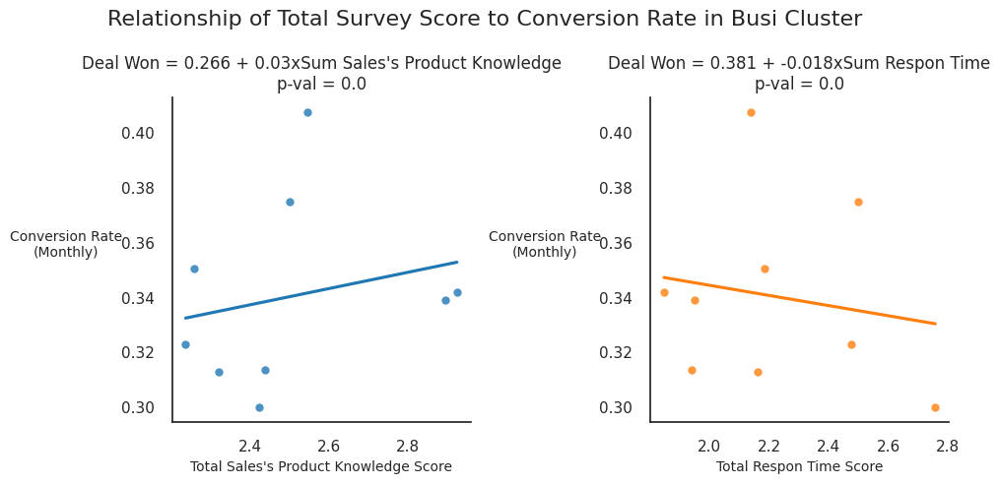

In [ ]:
#prepare df with conversion rate (deal_won mean)
df_0_merge = df_gmm_visual[['leads_reg_quarter_period','cluster','deal_won']]\
                           .query("cluster == 0")\
                           .groupby('leads_reg_quarter_period', as_index=False)[['deal_won']].mean()

df_survey_analysis = df2.merge(df_gmm_visual[['leads_id','cluster','leads_reg_quarter_period']].query("cluster == 0"), on='leads_id', how='inner')\
                        .groupby('leads_reg_quarter_period', as_index=False).agg({"Sales's Product Knowledge":'mean', "Respon Time":"mean"})\
                        .merge(df_0_merge, on='leads_reg_quarter_period')

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

for i, v in enumerate(["Sales's Product Knowledge", "Respon Time"]):
  p = sns.regplot(data=df_survey_analysis, x=v, y='deal_won', color=tab10[i], ax=ax[i], ci=None)

  #calculate slope and intercept of regression equation
  slope, intercept, r, p, sterr = linregress(x=p.get_lines()[0].get_xdata(),
                                             y=p.get_lines()[0].get_ydata())

  ax[i].set_title(f"Deal Won = {round(intercept,3)} + {round(slope, 3)}xSum {v}\np-val = {p}", fontsize=12)
  ax[i].set_xlabel(f'Total {v} Score', fontsize=10)
  ax[i].set_ylabel('Conversion Rate\n(Monthly)', fontsize=10, rotation=0, labelpad=40)

fig.suptitle("Relationship of Total Survey Score to Conversion Rate in Busi Cluster", fontsize=16)

fig.tight_layout()
plt.show()

fig.savefig('compare_survey_deal.png', format='png', bbox_inches='tight', dpi=200)

Bias, because the survey sample is only from customer

##Number of employee, industry and conversion rate

In [ ]:
df_impact = df_gmm_visual.copy()

#create column to separate which have employee >=140 or not
mask = df_impact['number_of_employee'] >= 140
df_impact['above140emp'] = np.where(mask, ">=140 Employee", "<140 Employee")
df_impact['industry_emp'] = df_impact['industry'] + ' ' + df_impact['above140emp']

In [ ]:
focus_industry = ['Education >=140 Employee', 'F&B >=140 Employee', 'Hospitality <140 Employee',
                  'Hospitality >=140 Employee', 'Technology >=140 Employee', 'Finance >=140 Employee',
                  'Retail >=140 Employee']
focus_industry2 = ['F&B <140 Employee', 'Technology <140 Employee', 'Retail >=140 Employee',
                  'Technology >=140 Employee', 'Finance >=140 Employee',
                  'Education <140 Employee', 'Retail <140 Employee']

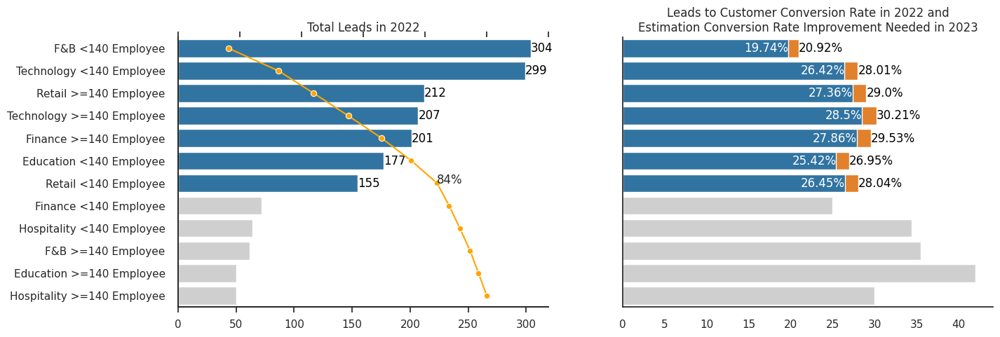

In [ ]:
sns.set_theme(style='white', palette=None, rc={"axes.spines.right": False, "axes.spines.top": False})

#leads_to_won ratio and sum per industry
fig, ax = plt.subplots(figsize=(15,5), nrows=1, ncols=2, sharey=True)

df_won_sum = df_impact.query("leads_reg_year == 2022").groupby('industry_emp').agg({'leads_id':'count'}).sort_values(by='leads_id', ascending=False)
color = [sns.color_palette('tab10')[0] if x in df_won_mean.nlargest(7, 'deal_won')['deal_won'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_won_mean['deal_won']]
color2 = [sns.color_palette('tab10')[1] if x in df_won_mean.nlargest(7, 'deal_won')['deal_won'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_won_mean['deal_won']]

plot2 = sns.barplot(x="leads_id", y=df_won_sum.index, data=df_won_sum, palette=color, orient='h', order = df_won_sum.index, ax=ax[0])
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Total Leads in 2022')
for i,v in enumerate(plot2.patches):
  v = v.get_width()
  y = ax[0].get_yticks()[i]
  if i < 7:
    ax[0].text(v, y, "{:,}".format(round(v),2), horizontalalignment='left', verticalalignment='center', color='black')

ax2 = ax[0].twiny()
df_won_sum['cum_percentage'] = np.round(df_won_sum['leads_id'].cumsum()/df_won_sum['leads_id'].sum() * 100,2)
plot3 = sns.lineplot(data=df_won_sum, y='industry_emp', x='cum_percentage', color='orange', marker='o', ax=ax2, orient='y')

ax2.set_xlabel('')
ax2.set_xticks(ax2.get_xticks(),['','','','','','',''])
for i,v in enumerate(df_won_sum['cum_percentage']):
  if v >= 80:
    plt.text(v, i, f"{round(v)}%")
    break
  else:
    continue

df_won_mean = df_impact.query("leads_reg_year == 2022").groupby('industry_emp').agg({'deal_won':'mean'}).round(4)*100
df_won_mean = df_won_mean.sort_values(by='deal_won', ascending=False)
df_won_mean2 = df_won_mean.copy()
df_won_mean2['deal_won'] = np.where(df_won_mean2.index.isin(focus_industry2), 1.06*df_won_mean2['deal_won'], df_won_mean2['deal_won'])

plot = sns.barplot(x="deal_won", y=df_won_mean.index, data=df_won_mean2, palette=color2, orient='h', order = df_won_sum.index, ax=ax[1])
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('Leads to Customer Conversion Rate in 2022 and\nEstimation Conversion Rate Improvement Needed in 2023')

plot2 = sns.barplot(x="deal_won", y=df_won_mean.index, data=df_won_mean, palette=color, orient='h', order = df_won_sum.index, ax=ax[1])
ax[1].set_ylabel('')
ax[1].set_xlabel('')
for i,v in enumerate(zip(plot.patches, plot2.patches)):
  v1, v2 = v
  v1 = v1.get_width()
  v2 = v2.get_width()
  if i < 7:
    y = ax[1].get_yticks()[i]
    ax[1].text(v1, y, "{:,}%".format(round(v1,2)), horizontalalignment='left', verticalalignment='center', color='black')
  elif i >=7 and i < 12:
    continue
  elif i <= 18:
    i -= 12
    y = ax[1].get_yticks()[i]
    ax[1].text(v2, y, "{:,}%".format(round(v2,2)), horizontalalignment='right', verticalalignment='center', color='white')
  else:
    break
plt.show()
fig.savefig('leads_conv_total_imp.png', format='png', bbox_inches='tight', dpi=200)

In [ ]:
df_won_sum2 = df_impact.query("leads_reg_year == 2022").groupby('industry_emp').agg({'deal_won':'sum'})
df_impact_industry = df_won_sum.merge(df_won_mean, on='industry_emp')\
                               .rename(columns={'leads_id':'total_leads', 'deal_won':'conversion_rate'})\
                               .merge(df_won_sum2, on='industry_emp').reset_index()

focus_industry = ['Education >=140 Employee', 'F&B >=140 Employee', 'Hospitality <140 Employee',
                  'Hospitality >=140 Employee', 'Technology >=140 Employee', 'Finance >=140 Employee',
                  'Retail >=140 Employee']
focus_industry2 = ['F&B <140 Employee', 'Technology <140 Employee', 'Retail >=140 Employee',
                  'Technology >=140 Employee', 'Finance >=140 Employee',
                  'Education <140 Employee', 'Retail <140 Employee']
industry_mask = df_impact_industry['industry_emp'].isin(focus_industry)
industry_mask2 = df_impact_industry['industry_emp'].isin(focus_industry2)

# df_impact_industry['h_total_leads'] = np.where(industry_mask, round(df_impact_industry['total_leads']*13.6), df_impact_industry['total_leads'])
# df_impact_industry['h_deal_won'] = round(df_impact_industry['h_total_leads']*df_impact_industry['conversion_rate']/100)

df_impact_industry['h_total_leads'] = df_impact_industry['total_leads']
df_impact_industry['h_conversion_rate'] = np.where(industry_mask2, round(df_impact_industry['conversion_rate']*1.06,2), df_impact_industry['conversion_rate'])
df_impact_industry['h_deal_won'] = round(df_impact_industry['h_total_leads']*df_impact_industry['h_conversion_rate']/100)

df_impact_industry

,industry_emp,total_leads,cum_percentage,conversion_rate,deal_won,h_total_leads,h_conversion_rate,h_deal_won
0,F&B <140 Employee,304,16.41,19.74,60,304,20.92,64.0
1,Technology <140 Employee,299,32.54,26.42,79,299,28.01,84.0
2,Retail >=140 Employee,212,43.98,27.36,58,212,29.00,61.0
3,Technology >=140 Employee,207,55.15,28.50,59,207,30.21,63.0
4,Finance >=140 Employee,201,66.00,27.86,56,201,29.53,59.0
5,Education <140 Employee,177,75.55,25.42,45,177,26.95,48.0
6,Retail <140 Employee,155,83.92,26.45,41,155,28.04,43.0
7,Finance <140 Employee,72,87.80,25.00,18,72,25.00,18.0
8,Hospitality <140 Employee,64,91.26,34.38,22,64,34.38,22.0
9,F&B >=140 Employee,62,94.60,35.48,22,62,35.48,22.0


In [ ]:
df_impact_industry['deal_won'].sum()/df_impact_industry['total_leads'].sum()*100

26.76740420939018

In [ ]:
df_impact_industry['h_deal_won'].sum()/df_impact_industry['h_total_leads'].sum()*100

28.062601187263898

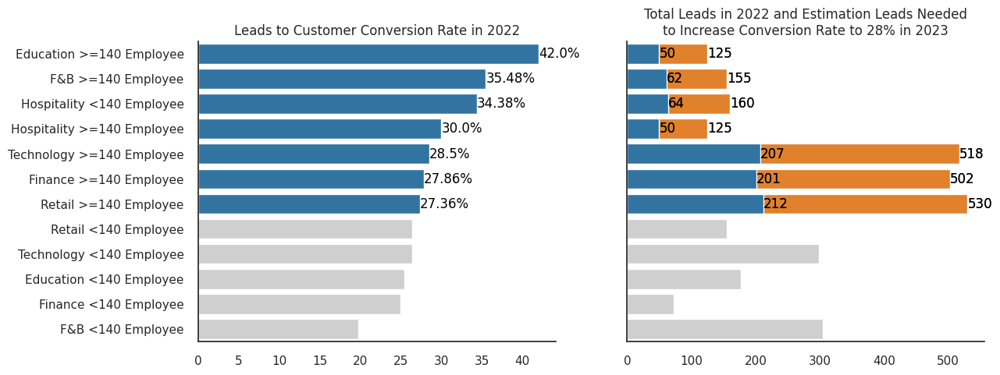

In [ ]:
sns.set_theme(style='white', palette=None, rc={"axes.spines.right": False, "axes.spines.top": False})

#leads_to_won ratio and sum per industry
fig, ax = plt.subplots(figsize=(13,5), nrows=1, ncols=2, sharey=True)

df_won_sum = df_impact.query("leads_reg_year == 2022").groupby('industry_emp').agg({'leads_id':'count'}).sort_values(by='leads_id', ascending=False)
df_won_mean = df_impact.query("leads_reg_year == 2022").groupby('industry_emp').agg({'deal_won':'mean'}).round(4)*100
df_won_mean = df_won_mean.sort_values(by='deal_won', ascending=False)

color = [sns.color_palette('tab10')[0] if x in df_won_mean.nlargest(7, 'deal_won')['deal_won'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_won_mean['deal_won']]
color2 = [sns.color_palette('tab10')[1] if x in df_won_mean.nlargest(7, 'deal_won')['deal_won'].to_list()\
         else sns.color_palette('pastel')[7] for x in df_won_mean['deal_won']]

df_won_sum2 = df_won_sum.copy()
df_won_sum2['leads_id'] = np.where(df_won_sum2.index.isin(focus_industry), df_won_sum2['leads_id']*2.5, df_won_sum2['leads_id'])
plot3 = sns.barplot(x="leads_id", y=df_won_sum2.index, data=df_won_sum2, palette=color2, orient='h', order = df_won_mean.index, ax=ax[1])

plot2 = sns.barplot(x="leads_id", y=df_won_sum.index, data=df_won_sum, palette=color, orient='h', order = df_won_mean.index, ax=ax[1])
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('Total Leads in 2022 and Estimation Leads Needed\nto Increase Conversion Rate to 28% in 2023')

for i,v in enumerate(zip(plot3.patches, plot2.patches)):
  v1, v2 = v
  v1 = v1.get_width()
  v2 = v2.get_width()
  if i > 11:
    i -= 12
  if i > 6:
    continue
  y = ax[1].get_yticks()[i]
  ax[1].text(v1, y, "{:,}".format(round(v1),2), horizontalalignment='left', verticalalignment='center', color='black')
  ax[1].text(v2, y, "{:,}".format(round(v2),2), horizontalalignment='left', verticalalignment='center', color='black')

plot = sns.barplot(x="deal_won", y=df_won_mean.index, data=df_won_mean, palette=color, orient='h', order = df_won_mean.index, ax=ax[0])
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Leads to Customer Conversion Rate in 2022')
for i,v in enumerate(plot.patches):
  v = v.get_width()
  y = ax[0].get_yticks()[i]
  if i < 7:
    ax[0].text(v, y, "{:,}%".format(round(v,2)), horizontalalignment='left', verticalalignment='center', color='black')

plt.show()
fig.savefig('leads_conv_total_imp2.png', format='png', bbox_inches='tight', dpi=200)

In [ ]:
df_won_sum2 = df_impact.query("leads_reg_year == 2022").groupby('industry_emp').agg({'deal_won':'sum'})
df_impact_industry = df_won_sum.merge(df_won_mean, on='industry_emp')\
                               .rename(columns={'leads_id':'total_leads', 'deal_won':'conversion_rate'})\
                               .merge(df_won_sum2, on='industry_emp').reset_index()

industry_mask = df_impact_industry['industry_emp'].isin(focus_industry)
industry_mask2 = df_impact_industry['industry_emp'].isin(focus_industry2)

# df_impact_industry['h_deal_won'] = round(df_impact_industry['h_total_leads']*df_impact_industry['conversion_rate']/100)

df_impact_industry['h_total_leads'] = np.where(industry_mask, round(df_impact_industry['total_leads']*2.5), df_impact_industry['total_leads'])
df_impact_industry['h_conversion_rate'] = df_impact_industry['conversion_rate']
df_impact_industry['h_deal_won'] = round(df_impact_industry['h_total_leads']*df_impact_industry['h_conversion_rate']/100)

df_impact_industry

,industry_emp,total_leads,conversion_rate,deal_won,h_total_leads,h_conversion_rate,h_deal_won
0,F&B <140 Employee,304,19.74,60,304.0,19.74,60.0
1,Technology <140 Employee,299,26.42,79,299.0,26.42,79.0
2,Retail >=140 Employee,212,27.36,58,530.0,27.36,145.0
3,Technology >=140 Employee,207,28.50,59,518.0,28.50,148.0
4,Finance >=140 Employee,201,27.86,56,502.0,27.86,140.0
5,Education <140 Employee,177,25.42,45,177.0,25.42,45.0
6,Retail <140 Employee,155,26.45,41,155.0,26.45,41.0
7,Finance <140 Employee,72,25.00,18,72.0,25.00,18.0
8,Hospitality <140 Employee,64,34.38,22,160.0,34.38,55.0
9,F&B >=140 Employee,62,35.48,22,155.0,35.48,55.0


In [ ]:
df_impact_industry['deal_won'].sum()/df_impact_industry['total_leads'].sum()*100

26.76740420939018

In [ ]:
df_impact_industry['h_deal_won'].sum()/df_impact_industry['h_total_leads'].sum()*100

28.05893657911595